# **Object Recognition**

## **Introduction**. Short summary of the goals of the project. The sections composing the report.

**Section 1**. Data loading and visualization

1.   Download the data and visualize an image from the dataset;

2.   Write a custom dataset for Penn-Fudan;
3.   Visualize images with ground truth.




**Section 2**. Data preparation

1. Define a tronsformer function;
2. Define the training set and test set.
**Section 3**. Preparation of the training

1. The NN model: download and adjust;
2. Visualize the network structure;
3. Define hyperparameters.
**Section 4**. Training execution

1. Training;
2. Retrieve the loss data during training.

**Section 5**. Test

1. Plot training losses;
2. Visualize the predicted bounding boxes.
**Section 6**. Results, observations and conclusions

--Full code--

# **Introduction**

This project is divided into 6 parts. In the section1 and 2, we download and extract a zip file " Penn-Fudan Database pedestrian detection and segmentation" which contains 170 images with 345 instances of pedestrians. In this project, we have only one class(a class for detecting persons) and and 4 coordinates for drawing bounding box. In this cases, we should consider annotation file, then write a custom dataset for it and then visualize images with ground truth and semantic segmentation. After that, we prepare data using helper function and transform data then specify and split training and test set. Then download a pretrained moded (Faster R-CNN model with a Resnet-50 backbone) and adjust input layer to resize the images into 224X224 pixels resolution and fine-tune the pretrained model to our own classes which is two (one class is for person and the other is for background). In section 4 and 5, after defining hyperparameters, we execute trainining and demonstrate multi-task losses in the plots and finally we visualize the prediced bounding boxes and compare it with groundtruth.





# 1. Data loading and preparation
Install the pycocotools library. It will be used for computing the evaluation metrics (accuracy) using the COCO metric for intersection over union. Then, import the libraries.

In [ ]:
!pip install cython
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

In [ ]:
import os
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py")
#os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py")
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py")

0

In [ ]:
import os
os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py")

0

In [ ]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.9.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 462604, done.
remote: Counting objects: 100% (43063/43063), done.
remote: Compressing objects: 100% (2050/2050), done.
remote: Total 462604 (delta 41049), reused 42909 (delta 40948), pack-reused 419541
Receiving objects: 100% (462604/462604), 909.01 MiB | 16.19 MiB/s, done.
Resolving deltas: 100% (430152/430152), done.
Note: switching to 'v0.9.0'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at 01dfa8ea81 add custom user agent for download_url (#3499)


In [ ]:
# imports
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import random
from torchvision.datasets.utils import download_and_extract_archive
import os
import numpy as np
import torch
import torch.utils.data
import utils
import transforms
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import pickle

### 1a. Download the data and visualize an image from the dataset

In this project we will use the [Penn-Fudan Database for Pedestrian Detection and Segmentation](https://www.cis.upenn.edu/~jshi/ped_html/).


### Download and extract the data

In [ ]:
import os
import zipfile
import shutil  # Add this import statement


!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip -P data
url = "https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip" #URL to download file from
root = "." #directory to place downloaded file in
download_and_extract_archive(url, root)


# Specify the paths to the zip files
zip_path = '/content/data/PennFudanPed.zip'


# Specify the extraction directories
extracted_dir = '/content/data'


# Create directories if they don't exist
os.makedirs(extracted_dir, exist_ok=True)

# Extract the contents of the zip files
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)


--2024-01-31 08:47:03--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘data/PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M  11.1MB/s    in 5.7s    

2024-01-31 08:47:09 (8.99 MB/s) - ‘data/PennFudanPed.zip’ saved [53723336/53723336]



100%|██████████| 53723336/53723336 [00:05<00:00, 9214463.94it/s] 


Extracting ./PennFudanPed.zip to .


#### Visualize an image and its corresponding segmentation mask






#### Using PIL, open an image from the dataset.

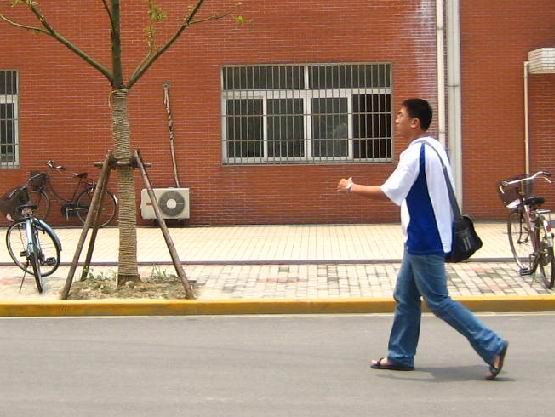

In [ ]:
image_path = 'PennFudanPed/PNGImages/FudanPed00020.png'
Image.open(image_path)

### 1b. Write a custom dataset for Penn-Fudan bold text
Write a custom class that inherits from torch.utils.data.Dataset for defining the Penn-Fudan dataset.


In [ ]:
from torch.utils.data import Dataset

import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image


class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)

        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        image_id = torch.tensor([idx])
        masks= torch.as_tensor(masks, dtype=torch.uint8)
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)


        target = {"boxes": boxes, "labels": labels, "image_id": image_id, "masks":masks, "area": area, "iscrowd":iscrowd}

        if self.transforms:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

Let's see how the outputs are structured for this dataset by instantiating a PennFudanDataset object and printing the first element of the dataset.

In [ ]:
dataset=[]
dataset =  PennFudanDataset('/content/data/PennFudanPed')
print(len(dataset))
element=dataset[21]
print(element)

170
(<PIL.Image.Image image mode=RGB size=536x465 at 0x79DCB9CE18A0>, {'boxes': tensor([[111., 168., 208., 448.],
        [396., 170., 513., 454.]]), 'labels': tensor([1, 1]), 'image_id': tensor([21]), 'masks': tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]], dtype=torch.uint8), 'area': tensor([27160., 33228.]), 'iscrowd': tensor([0, 0])})


The model consider the class 1 as pedestrian and dataset does not contain background class 0 so we should have only 1 in the label tensor. As we can see in the output, it is shown 'labels' : tensor([1,1]) it means it consider two persons as pedestrians .

### 1c. Visualize images with ground truth

Define three functions:

*   show_boxed_image draws bounding boxes around pedestrians in an image;
*   show_area_image draws area rectangles above pedestrians;
*show_mask_image constructs a tensor with all the segmentation masks of pedestrians in the image.

In [ ]:
def show_boxed_image(img):
    '''
    args: img -> PennFudanDataset object
    returns an ImageDraw image with bounding boxes around pedestrians.
    '''
    img_show = img[0] #get the PIL image
    img_coordinates = img[1].get("boxes") #get the bounding boxes coordinates

    # draw a rectangle (bounding box) following the coordinates
    for coords in img_coordinates:
        ## TODO: get the coordinates
        xmin = coords[0]
        ymin = coords[1]#...
        xmax = coords[2]#...
        ymax = coords[3]#...
        draw = ImageDraw.Draw(img_show)
        # draw the rectangle
        # (xmin, ymin) -> upper left corner
        # (xmax, ymax) -> lower right corner
        draw.rectangle([(xmin, ymin), (xmax, ymax)],
                       outline ="lightgreen",
                       width=5)

    return img_show


def show_area_image(img):
    '''
    args: img -> PennFudanDataset object
    returns an ImageDraw image with area rectangles over pedestrians.
    '''
    ## TODO:
    # get the PIL image
    img_show = img[0]
    # get the bounding boxes coordinates
    img_coordinates = img[1].get("boxes")
    # get the area values
    img_areas = img[1].get("area")#...

    fnt = ImageFont.truetype("~/usr/share/fonts/truetype/LiberationMono-Bold.ttf", 30)

    # draw a filled rectangle following the coordinates, and
    # print the value of the area over each rectangle
    for i in range(len(img_areas)):
        ## TODO: get the coordinates
        # ATTENTION: you have to retrieve them in a different way in respect
        #            to the previous function (look at the for loop...)
        xmin = img_coordinates[i][0]
        ymin = img_coordinates[i][1]#...
        xmax = img_coordinates[i][2]#...
        ymax = img_coordinates[i][3]#...
        draw = ImageDraw.Draw(img_show)
        #...

        ## TODO: draw a filled rectangle using the coordinates.
        #...
        draw.rectangle([(xmin, ymin), (xmax, ymax)],
                       fill="green",
                       width=5)

        # Draw the corresponding area over each rectangle
        draw.text(((xmax+xmin)/2-60, (ymin+ymax)/2),
                  str(img_areas[i].item()),
                  font = fnt,
                  fill="blue")

    return img_show


def show_mask_image(img):
    masks = img[1].get("masks")

    # Initialize an empty RGB image
    result = torch.zeros(3, masks.size()[1], masks.size()[2])

    # Assign a random color to each mask
    for i in range(len(masks)):
        # Generate a random RGB color
        color = torch.tensor([random.random(), random.random(), random.random()])

        # Multiply the mask by the color and add to the result
        result += masks[i].unsqueeze(0) * color.unsqueeze(1).unsqueeze(1)

    # Clip values to be between 0 and 1
    result = torch.clamp(result, 0, 1)

    return result


import numpy as np
from PIL import Image, ImageDraw


def show_sample(img, target, show=True):
    """
    Show a sample image
    :param img: Tensor of shape (3, H, W)
    :param target: target dictionary. Should have 'boxes' as key
    :param show: (boolean) if True show the image
    :return: PIL image of the sample with bounding boxes
    """
    img_arr = img.numpy()
    img_arr = img_arr.transpose((1, 2, 0)) * 255
    img_arr = img_arr.astype(np.uint8)

    image = Image.fromarray(img_arr)
    bboxes = target['boxes'].cpu().numpy()
    bboxes = np.ceil(bboxes)

    draw = ImageDraw.Draw(image)
    for bbox_id in range(bboxes.shape[0]):
        bbox = list(bboxes[bbox_id, :])
        draw.rectangle(bbox, outline=(255, 0, 255))

    if show:
        image.show()

    return image


def relu(x):
    return max(x, 0)


def collate_fn(batch):
    return tuple(zip(*batch))

def count_parameters(model):
  result = sum(p.numel() for p in model.parameters() if p.requires_grad)
  print(f"The model has {result:,} trainable parameters.")
  return result



Create a list of four random integers.

In [ ]:
## TODO: create a list containing 4 random integers
import random
randomlist = []

for _ in range(0, 4):
   randomlist.append(random.randint(0, len(dataset)-1))

Visualize 16 images:

* 1st row: 4 random images from the dataset (use the list of 4 random numbers);
* 2nd row: the same 4 images, with bounding boxes;
* 3rd row: the same 4 images, with areas;
* 4th row: the segmentation masks of the same 4 images.

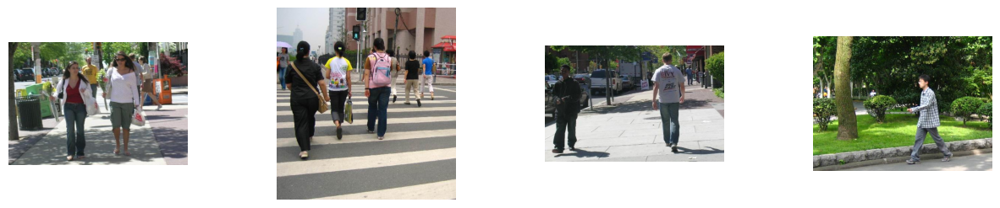

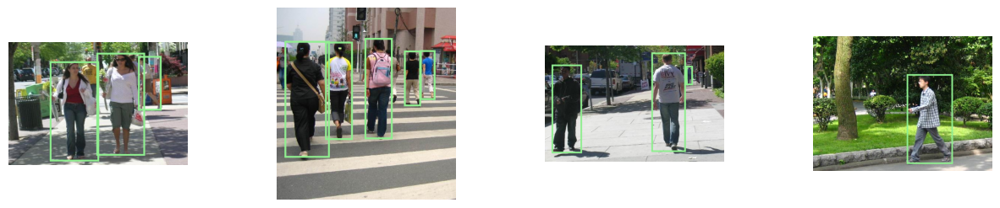

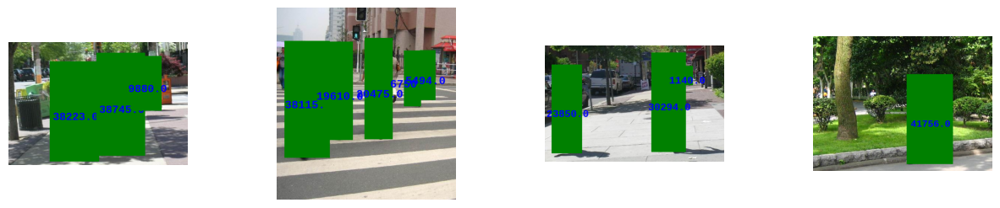

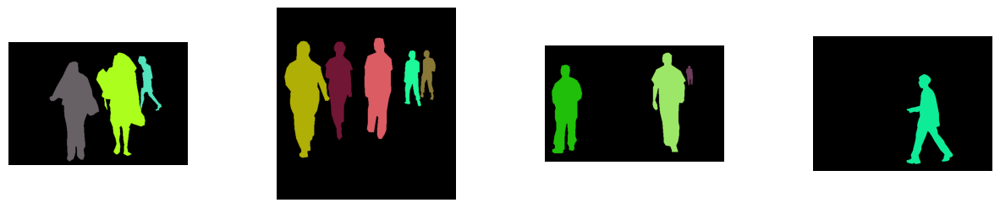

In [ ]:
## visualize 4 original images.
from PIL import Image
fig = plt.figure(figsize=(15,20))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for index, i in zip(randomlist, range(0,4)):
  image = dataset[index][0]
  fig.add_subplot(1,4, i+1)
  plt.axis('off')
  plt.imshow(image)

## visualize 4 images with bounding boxes.
fig = plt.figure(figsize=(15,20))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for index, i in zip(randomlist, range(0,4)):
  fig.add_subplot(1,4, i+1)
  sample = show_boxed_image(dataset[index])
  plt.axis('off')
  plt.imshow(sample)

##  visualize 4 images with areas.
fig = plt.figure(figsize=(15,20))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for index, i in zip(randomlist, range(0,4)):
  fig.add_subplot(1,4, i+1)
  sample = show_area_image(dataset[index])
  plt.axis('off')
  plt.imshow(sample)

## visualize 4 images with segmentation masks.
fig = plt.figure(figsize=(15,20))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for index, i in zip(randomlist, range(0, 4)):
    fig.add_subplot(1, 4, i + 1)

    # Convert the PyTorch tensor to a NumPy array
    sample_np = show_mask_image(dataset[index]).numpy()

    plt.axis('off')
    plt.imshow(sample_np.transpose(1, 2, 0))  # Transpose dimensions for correct display

plt.show()


we visualize 4 images from dataset, and each image has object category (pedestrians) marked with bounding boxes, area and mask segmentation for each instance of the category.

In the second row, we can see bounding boxes which demonstrate the objects of interest within each image.

In the third row, we should notice that each area related to a corresponding object in the images has different sizes so we can see different sizes of regions of interest which contains an object (pedestrian in this project) in the four images.

In the forth row, we demonstrate the semantic segmentation mask of 4 images. In the semantic segmentation, every pixel associate to a particular class(background or person in this project) and all the pixels attribute to a particular class have the same color, as we can see that all pixels associates to a background class are shown by the purple color while the ones belongs to persons are all yellow and this is because that semantic segmentation classify all the persons as a single instance. The image with segmentation masks gives us a better understanding of the shape of the objects in the images.

# 2. Data preparation

### 2a. Define a tronsformer function

Data augmentation is a very important step that lets us extend our dataset (especially when we have a small dataset, as in our case) and make the network more robust. We also want to apply some transformations to make the input to the network consistent (in our case, we need to resize the images so they have constant dimensions).

In addition to the augmentation and transformation of the images, we also need to take care of the labels. For example, if we vertically flip an image, the bounding box will get a new coordinate that we need to update. To update the labels together with the transformation of the image, we are going to write some transformation classes by ourselves.

In [ ]:
import torch
import torchvision.transforms.functional as tf
from torchvision import transforms
from torchvision import transforms as T
import torch
import torchvision.transforms.functional as tf
from torchvision import transforms as T
from torch.utils.data import Dataset
from PIL import Image
import numpy as np
import torchvision

import torch
from torch.utils.data import Dataset, DataLoader

def get_transform(train):
    transforms_to_apply = []
    ## TODO: convert the PIL image into a PyTorch Tensor
    transforms_to_apply.append(
        transforms.ToTensor()#...
        )
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms_to_apply.append(transforms.RandomHorizontalFlip(0.5))
    return transforms.Compose(transforms_to_apply)


class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target


class ToTensor(object):
    def __call__(self, image, target):
        image = torchvision.transforms.ToTensor()(image)

        return image, target


device = 'cuda' if torch.cuda.is_available() else 'cpu'



class CustomTransform:
    def __init__(self):
        self.transform = T.Compose([
            T.Resize((512, 512)),
            T.RandomHorizontalFlip(p=1),
            #T.RandomVerticalFlip(p=1),
            # RandomTranslation(max_translation=(0.2, 0.2)),  # Commented out as it may require adjustments
            T.ColorJitter(brightness=0.8, contrast=0.8, saturation=0, hue=0.4),
            T.ToTensor()
        ])

    def __call__(self, image, target):
        self.width,self.height  = image.size
        image = self.transform(image)

        # Update bounding boxes in the target
        boxes = target["boxes"]
        # Resize bounding boxes
        boxes[:, 0] *= 512/self.width   # x_min
        boxes[:, 2] *= 512/self.width  # x_max
        boxes[:, 1] *= 512/self.height  # y_min
        boxes[:, 3] *= 512/self.height  # y_max

        # Flip bounding boxes for horizontal flip
        boxes[:, 0], boxes[:, 2] = image.shape[2] - boxes[:, 2], image.shape[2] - boxes[:, 0]



        target["boxes"] = boxes

        return image, target





### 2b. Define the training set and test set
Instantiate the training and testing data classes and assign them to DataLoader.

In [ ]:
# use our dataset and defined transformations
root_path = '/content/data/PennFudanPed'
train_set = PennFudanDataset(root_path, transforms = Compose([ToTensor()]))
valid_set = PennFudanDataset(root_path, transforms = Compose([ToTensor()]))
test_set  = PennFudanDataset(root_path, transforms = Compose([ToTensor()]))


# split the dataset in train and test set
torch.manual_seed(1)  #set a seed generating a random integer
indices = torch.randperm(len(train_set)).tolist()   # Returns a random permutation of integers from 0 to n - 1.
## using torch.utils.data.Subset, define the train_set and test_set.
# train_set will be a new subset of train_set defined above. The
#          same applies to the test_set;
#        * get the indices from the 'indices' variable defined above. The
#          train_set must contain 100 elements (e.g. the first 100 indices),
#          and the test_set must contain 20 elements (e.g. the indices from
#          100 to 119). Pay attention to how the indices are selected in
#          list slicing.

train_set = torch.utils.data.Subset(train_set, indices[:-50]) #split dataset into specified indices
test_set = torch.utils.data.Subset(test_set, indices[-30:])
valid_set = torch.utils.data.Subset(valid_set, indices[-50:-30])

# define training and test data loaders. Use 'DataLoader'.
#        Some arguments:
#        train_loader: batch size=2, shuffle=True, num_workers=2,
#                      collate_fn=utils.collate_fn
#        test_loader: batch size=1, shuffle=False, num_workers=2,
#                     collate_fn=utils.collate_fn
train_loader = torch.utils.data.DataLoader(
              train_set, batch_size=2, shuffle=True, num_workers=2,
              collate_fn=utils.collate_fn)

test_loader = torch.utils.data.DataLoader(
         test_set, batch_size=2, shuffle=False, num_workers=2,
         collate_fn=utils.collate_fn)
valid_loader = torch.utils.data.DataLoader(
         valid_set, batch_size=2, shuffle=False, num_workers=2,
         collate_fn=utils.collate_fn)
##check the size of the training set and the test set by printing it
print("The size of training set is : {}  \nThe size of test set is: {} \nThe size of validation set is: {}".format(len(train_set), len(test_set), len(valid_set)))


The size of training set is : 120  
The size of test set is: 30 
The size of validation set is: 20


## **3. Preparation of the training**

### 3a. The NN model: download and adjust

Define a get_model function to download a pre-trained model. Adjust its input layer to resize the images, and the last layer to output a number of classes that suits our dataset.

We will use a Faster R-CNN model with a Resnet-50 backbone.



In [ ]:
def get_model(model, num_classes):
    ## load an object detection model pre-trained on COCO.
    #        Construct a Faster R-CNN model with a ResNet-50-FPN backbone by
    #        using torchvision.models.detection.fasterrcnn_resnet50_fpn().
    #        We want the model to be pre-trained.
    #        https://pytorch.org/vision/stable/models.html#torchvision.models.detection.fasterrcnn_resnet50_fpn
    model = model #...

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model



we finetune the pretrained model with our own particular classes which is two class in this project, one class for person and the other is for th background.

Instantiate the model and apply a resize on the images. The input images resolution must be 224x224 pixels.

In [ ]:
def modelTransform(model,NUM_CLASSES=2 ):

  ## TODO: if available use GPU, else use CPU.
  device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu" )
  print(device)

  ## TODO: define NUM_CLASSES (we only have 2: background and person).
  NUM_CLASSES  = 2

  ## TODO: get the model using the 'get_model' function.
  model = get_model(model,NUM_CLASSES) #...

  # Perform input / target transformation before feeding the data to the model
  grcnn = torchvision.models.detection.transform.GeneralizedRCNNTransform(min_size=224,
                                                                          max_size=224,
                                                                          image_mean=[0.485, 0.456, 0.406],
                                                                          image_std=[0.229, 0.224, 0.225]
                                                                          )
  model.transform = grcnn #apply the transforms
  return model


model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model = modelTransform(model,NUM_CLASSES=2 )

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:02<00:00, 79.0MB/s]


cuda:0


## 3b. Visualize the network structure

In [ ]:
def show_model_structure(model):
  model.eval()
  model_structure = list(model.children())

  print("--------------------------------------------------")
  print("| The network structure is composed by 4 blocks: |\n| \t1. GeneralizedRCNNTransform;             |\n| \t2. BackboneWithFPN (ResNet-50);          |\n| \t3. RegionProposalNetwork;                |\n| \t4. RoIHeads.                             |")
  print("--------------------------------------------------\n")
  # loop through the network "blocks"
  for i in range(len(model_structure)):
      # get the name of each block (which is a class)
      class_name = type(model_structure[i]).__name__
      # print the name of the block
      print("{}\n| {} |\n{}".format(len(class_name)*'-'+"----",
                                    class_name,
                                    len(class_name)*'-'+"----",))
      if i != 1: #excluding from printing the backbone network (ResNet-50)
          if i == 0:
              print("Performs input / target transformation before feeding the data to a GeneralizedRCNN model.\nThe transformations it perform are:\n\t- input normalization (mean subtraction and std division)\n\t- input / target resizing to match min_size / max_size\nIt returns a ImageList for the inputs, and a List[Dict[Tensor]] for the targets\n")
          # print the block components
          text = str(model_structure[i])
          text = text.replace(class_name, '')
          print(text[2:-2])
      else:
          print("ResNet-50")
      print()

show_model_structure(model)

--------------------------------------------------
| The network structure is composed by 4 blocks: |
| 	1. GeneralizedRCNNTransform;             |
| 	2. BackboneWithFPN (ResNet-50);          |
| 	3. RegionProposalNetwork;                |
| 	4. RoIHeads.                             |
--------------------------------------------------

----------------------------
| GeneralizedRCNNTransform |
----------------------------
Performs input / target transformation before feeding the data to a GeneralizedRCNN model.
The transformations it perform are:
	- input normalization (mean subtraction and std division)
	- input / target resizing to match min_size / max_size
It returns a ImageList for the inputs, and a List[Dict[Tensor]] for the targets

    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    Resize(min_size=(224,), max_size=224, mode='bilinear')

-------------------
| BackboneWithFPN |
-------------------
ResNet-50

-------------------------
| RegionProposalNetwork |


## 3b. Define hyperparameters

Implement a Stochastic Gradient Descent optimizer with a learning rate of 0.0005, a momentum factor of 0.9, and a weight decay of 0.0005. Then, construct a learning rate scheduler which decreases the learning rate by 10 times every 3 epochs. Set the number of epochs at 10.

In [ ]:
# construct the optimizer
params = [p for p in model.parameters() if p.requires_grad]
## TODO: complete the arguments.
#        https://pytorch.org/docs/stable/optim.html#torch.optim.SGD
#        learning rate of 0.0005, momentum factor of 0.9,
#        weight decay of 0.0005.
optimizer = torch.optim.SGD(params, lr=0.0005,
                           momentum=0.9, weight_decay=0.0005 #...
                           )

# construct the learning rate scheduler
## TODO: complete the arguments.
#        https://pytorch.org/docs/stable/optim.html#torch.optim.lr_scheduler.StepLR
#        step size of 3, gamma of 0.1.
lr_scheduler = torch.optim.lr_scheduler.StepLR(
                                              optimizer,step_size=3,gamma=0.1 #...
                                              )

## TODO: define the number of epochs (10)
num_epochs = 10

**Evaluation Part**

In [ ]:


def intersection_over_union(dt_bbox, gt_bbox):
    """
    Intersection over Union between two bboxes
    :param dt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :param gt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :return : intersection over union
    """
    intersection_bbox = np.array([max(dt_bbox[0], gt_bbox[0]),
                                  max(dt_bbox[1], gt_bbox[1]),
                                  min(dt_bbox[2], gt_bbox[2]),
                                  min(dt_bbox[3], gt_bbox[3])])

    intersection_area = relu(intersection_bbox[2] - intersection_bbox[0]) * relu(
        intersection_bbox[3] - intersection_bbox[1])
    area_dt = (dt_bbox[2] - dt_bbox[0]) * (dt_bbox[3] - dt_bbox[1])
    area_gt = (gt_bbox[2] - gt_bbox[0]) * (gt_bbox[3] - gt_bbox[1])

    union_area = area_dt + area_gt - intersection_area

    iou = intersection_area / union_area
    return iou


def evaluate_sample(target_pred, target_true, iou_threshold=0.5, nms_threshold=0.9):
    """
    For a given sample, gets if each detection is a True Positive or a False positive
    :param target_pred : dictionary describing the predicted detection (should have 'boxes', 'labels', 'scores')
    :param target_true : dictionary describing the ground truth (should have 'boxes', 'labels')
    :param iou_threshold: The treshold on IoU, to judge if a detection is correct or not
    :return : List of dictionaries with same size as detections, each dict have keys
              'score'  and 'TP' (= 1 if true positive and 0 otherwise)
    """
    gt_bboxes = target_true['boxes'].numpy()
    gt_labels = target_true['labels'].numpy()
    gt_masks  = target_true['masks'].numpy()

    dt_bboxes = target_pred['boxes'].numpy()
    dt_labels = target_pred['labels'].numpy()
    dt_scores = target_pred['scores'].numpy()

    # Perform NMS on predicted boxes
    #keep_indices = nms(torch.tensor(dt_bboxes), torch.tensor(dt_scores), iou_threshold=nms_threshold)
    #dt_bboxes = dt_bboxes[keep_indices]
    #dt_labels = dt_labels[keep_indices]
    #dt_scores = dt_scores[keep_indices]



    results = []
    for detection_id in range(len(dt_labels)):
        dt_bbox = dt_bboxes[detection_id, :]
        dt_label = dt_labels[detection_id]
        dt_score = dt_scores[detection_id]

        detection_result_dict = {'score': dt_score}

        max_IoU = 0
        max_gt_id = -1
        for gt_id in range(len(gt_labels)):
            gt_bbox = gt_bboxes[gt_id, :]
            gt_label = gt_labels[gt_id]

            if gt_label != dt_label:
                continue

            if intersection_over_union(dt_bbox, gt_bbox) > max_IoU:
                max_IoU = intersection_over_union(dt_bbox, gt_bbox)
                max_gt_id = gt_id

        if max_gt_id >= 0 and max_IoU >= iou_threshold:
            detection_result_dict['TP'] = 1
            gt_labels = np.delete(gt_labels, max_gt_id, axis=0)
            gt_bboxes = np.delete(gt_bboxes, max_gt_id, axis=0)

        else:
            detection_result_dict['TP'] = 0

        results.append(detection_result_dict)

    return results

def evaluate_custom(model, test_loader, device):
    """
    Computes precision and recall for a given trehsold (default = 0.5)
    :param model :
    :param test_loader:
    :param device:
    :return : tuple containing precision and recall
    """
    results = []
    model.eval()
    nbr_boxes = 0
    with torch.no_grad():
        for batch, (images, targets_true) in enumerate(test_loader):
            images = list(image.to(device).float() for image in images)
            targets_pred = model(images)

            targets_true = [{k: v.cpu().float() for k, v in t.items()} for t in targets_true]
            targets_pred = [{k: v.cpu().float() for k, v in t.items()} for t in targets_pred]

            for ii in range(len(targets_true)):
                target_true = targets_true[ii]
                target_pred = targets_pred[ii]
                nbr_boxes += target_true['labels'].shape[0]

                results = results + evaluate_sample(target_pred, target_true)

    results = sorted(results, key=lambda k: k['score'], reverse=True)

    acc_TP = np.zeros(len(results))
    acc_FP = np.zeros(len(results))
    recall = np.zeros(len(results))
    precision = np.zeros(len(results))

    if results[0]['TP'] == 1:
        acc_TP[0] = 1
    else:
        acc_FP[0] = 1

    for ii in range(1, len(results)):
        acc_TP[ii] = results[ii]['TP'] + acc_TP[ii - 1]
        acc_FP[ii] = (1 - results[ii]['TP']) + acc_FP[ii - 1]

        precision[ii] = acc_TP[ii] / (acc_TP[ii] + acc_FP[ii])
        recall[ii] = acc_TP[ii] / nbr_boxes

    return auc(recall, precision)

## 3c. Execute the Training

At the beginning of the notebook, we copied some helper functions to simplify training and evaluating models in references/detection/.

Train the model for 10 epochs, evaluating at the end of every epoch.

**Engin Part (training the detection model)**

In [ ]:
from sklearn.metrics import accuracy_score


from sklearn.metrics import auc
from engine import train_one_epoch, evaluate
model.to(device)

metric_collector = []
best_loss = float('inf')
patience_counter = 0
patience = 5  # Adjust the patience value as needed
train_losses = []
valid_losses = []
epoch = 0

for epoch in range(num_epochs):
    ## TODO: using the 'train_one_epoch' function from 'engine', train for
    #        one epoch, printing every 10 iterations (print_freq=10).
    # hints: you can find the source code here
    #        https://github.com/pytorch/vision/blob/master/references/detection/engine.py
    #        these are the arguments:
    #        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq)


    metric_logger = train_one_epoch(
                                    model, optimizer, train_loader, device, epoch, print_freq=50#...
                                   )

    # Check if validation loss has improved
    current_loss = evaluate_custom(model, valid_loader, device=device)

    if current_loss < best_loss:
        best_loss = current_loss
        patience_counter = 0
    else:
        patience_counter += 1

    # If loss hasn't improved for 'patience' epochs, stop training
    if patience_counter >= patience:
        print(f"Early stopping at epoch {epoch}")
        break

    # Update the learning rate
    lr_scheduler.step()
    metric_collector.append(metric_logger)
    valid_losses.append(current_loss)
    # Check if train loss has improved
    train_loss = evaluate_custom(model, train_loader, device=device)
    train_losses.append(train_loss)


    # Evaluate on the test set periodically
    if (epoch + 1) % 5 == 0:
      evaluate(model, test_loader, device=device)

Epoch: [0]  [ 0/60]  eta: 0:06:21  lr: 0.000009  loss: 1.7831 (1.7831)  loss_classifier: 0.7631 (0.7631)  loss_box_reg: 0.4379 (0.4379)  loss_objectness: 0.4479 (0.4479)  loss_rpn_box_reg: 0.1342 (0.1342)  time: 6.3521  data: 0.5315  max mem: 661
Epoch: [0]  [50/60]  eta: 0:00:03  lr: 0.000432  loss: 0.5105 (0.7647)  loss_classifier: 0.1744 (0.3343)  loss_box_reg: 0.2840 (0.3127)  loss_objectness: 0.0254 (0.1101)  loss_rpn_box_reg: 0.0025 (0.0076)  time: 0.2447  data: 0.0292  max mem: 707
Epoch: [0]  [59/60]  eta: 0:00:00  lr: 0.000500  loss: 0.4765 (0.7070)  loss_classifier: 0.1390 (0.3006)  loss_box_reg: 0.3026 (0.3035)  loss_objectness: 0.0099 (0.0957)  loss_rpn_box_reg: 0.0029 (0.0072)  time: 0.2268  data: 0.0272  max mem: 707
Epoch: [0] Total time: 0:00:17 (0.2877 s / it)
Epoch: [1]  [ 0/60]  eta: 0:00:16  lr: 0.000500  loss: 0.4141 (0.4141)  loss_classifier: 0.1136 (0.1136)  loss_box_reg: 0.2715 (0.2715)  loss_objectness: 0.0245 (0.0245)  loss_rpn_box_reg: 0.0045 (0.0045)  time: 

| Metric                                                | Value |
|-------------------------------------------------------|-------|
| AP @[ IoU=0.50:0.95 , area=all , maxDets=100 ]        | 0.674 |
| AP @[ IoU=0.50 , area=all , maxDets=100 ]            | 0.960 |
| AP @[ IoU=0.75 , area=all , maxDets=100 ]            | 0.853 |
| AP @[ IoU=0.50:0.95 , area=small , maxDets=100 ]      | 0.50|
| AP @[ IoU=0.50:0.95 , area=medium , maxDets=100 ]    | 0.155 |
| AP @[ IoU=0.50:0.95 , area=large , maxDets=100 ]     | 0.696 |
| AR @[ IoU=0.50:0.95 , area=all , maxDets=1 ]         | 0.381 |
| AR @[ IoU=0.50:0.95 , area=all , maxDets=10 ]        | 0.721 |
| AR @[ IoU=0.50:0.95 , area=all , maxDets=100 ]       | 0.721 |
| AR @[ IoU=0.50:0.95 , area=small , maxDets=100 ]     | 0.50|
| AR @[ IoU=0.50:0.95 , area=medium , maxDets=100 ]    | 0.367 |
| AR @[ IoU=0.50:0.95 , area=large , maxDets=100 ]     | 0.738 |

In [ ]:
def plot_results(n_epochs, train_losses, valid_losses):
  N_EPOCHS = n_epochs
  # Plot results
  plt.figure(figsize=(20, 6))
  _ = plt.subplot(1,2,1)
  plt.plot(np.arange(N_EPOCHS)+1, train_losses, linewidth=3)
  plt.plot(np.arange(N_EPOCHS)+1, valid_losses, linewidth=3)
  _ = plt.legend(['Train', 'Validation'])
  plt.grid('on'), plt.xlabel('Epoch'), plt.ylabel('AUC')
  plt.title("AU-PR Analysis: Training and Validation Sets")
  plt.show()



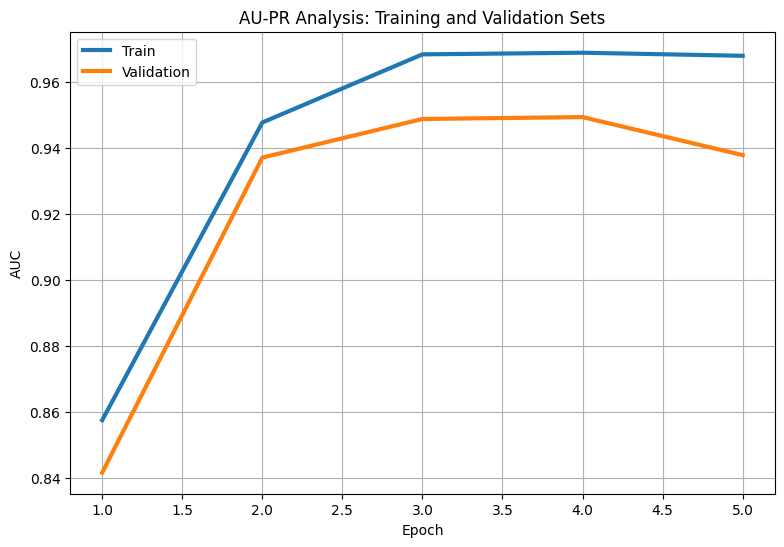

In [ ]:
plot_results(epoch, train_losses, valid_losses)

## 4b. Retrieve the loss data during training

The task of object detection has more than one loss value, so during training these are the losses calculated at every epoch:

* loss: the sum of all losses;
* loss_classifier: measures the performance of the object classification for detected bounding boxes; like binary classification loss.
* loss_box_reg: measures the performance of the network for retrieving the coordinates of the ground truth bounding boxes;
* loss_objectness: measures the performance of the network for retrieving bounding boxes which contain an object;
* loss_rpn_box_reg: measures the performance of the network for retrieving the region proposals.

Retrieve the loss and loss_box_reg metrics from the metric_collector and save them in a metrics list.

In [ ]:
def get_metric_collector(metric_collector):
  loss_metric = []
  loss_classifier_metric = []
  loss_box_reg_metric = []
  loss_objectness_metric = []
  loss_rpn_box_reg_metric = []

      #        loss_rpn_box_reg, and add them to their lists.
  for i in range(len(metric_collector)):
      # get the loss value
      loss = float(str(metric_collector[i].__getattr__("loss")).split(' ', 1)[0])
      # add the loss value to the 'loss_metric' list
      loss_metric.append(loss)

      ## TODO: get the loss_classifier, loss_box_reg, loss_objectness and
      #        loss_rpn_box_reg, and add them to their lists.
      loss_classifier = float(str(metric_collector[i].__getattr__("loss_classifier")).split(' ', 1)[0])
      loss_classifier_metric.append(loss_classifier)

      loss_box_reg = float(str(metric_collector[i].__getattr__("loss_box_reg")).split(' ', 1)[0])
      loss_box_reg_metric.append(loss_box_reg)

      loss_objectness = float(str(metric_collector[i].__getattr__("loss_objectness")).split(' ', 1)[0])
      loss_objectness_metric.append(loss_objectness)

      loss_rpn_box_reg = float(str(metric_collector[i].__getattr__("loss_rpn_box_reg")).split(' ', 1)[0])
      loss_rpn_box_reg_metric.append(loss_rpn_box_reg)

  # list of lists of all losses
  metrics = [loss_metric,
            loss_classifier_metric,
            loss_box_reg_metric,
            loss_objectness_metric,
            loss_rpn_box_reg_metric]

  return metrics

#metrics = get_metric_collector(metric_collector)

Save the metrics and the model.

In [ ]:
# save the metrics (list) to a pickle file
with open('metrics.pickle', 'wb') as f:
    pickle.dump(metrics, f)

## TODO: save the model using 'state_dict()'.
PATH="fasterrcnn_resnet50_fpn1.pth"
torch.save(model.state_dict(), PATH)

NameError: name 'metrics' is not defined

## 5. Test
Load the metrics and the model.

In [ ]:
# load the list of metrics
with open('metrics.pickle', 'rb') as f:
    metrics = pickle.load(f)

# load the model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
loaded_model = get_model(model,num_classes = 2)
## TODO: * load the model using 'load_state_dict()';
#        * put the model in evaluation mode.
loaded_model.load_state_dict(torch.load(PATH))#...
loaded_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## 5a. Plot training losses
Plot the data of the losses during training.

In [ ]:
## TODO: plot the 5 curves of the losses (loss, loss_classifier, loss_box_reg,
#        loss_objectness and loss_rpn_box_reg) in a 2x3 grid.
def plot_metric_collector(metrics):

  fig = plt.figure(figsize=(20,10))
  gridspec = fig.add_gridspec(2,3)

  #plot Loss:
  ax1 = fig.add_subplot(gridspec[0, 0])
  ax1.plot(metrics[0])
  plt.title('Loss')

  #plot Loss Classifier:
  ax2 = fig.add_subplot(gridspec[0, 1] )
  ax2.plot(metrics[1])
  plt.title('loss classifier')

  #plot Loss Box Reg
  ax3 = fig.add_subplot(gridspec[0, 2] )
  ax3.plot(metrics[2])
  plt.title('loss box reg')

  #plot Loss Box Objectness:
  ax4 = fig.add_subplot(gridspec[1, 0] )
  ax4.plot(metrics[3])
  plt.title('loss box objectness')

  #plot Loss Rpn Box Reg
  ax4 = fig.add_subplot(gridspec[1, 1] )
  ax4.plot(metrics[4])
  plt.title('loss rpn_box_reg')

  plt.show()

#plot_metric_collector(metrics)

In this project, The loss is expected to decrease after 10 Epoch because the network is learning and we can see in the 4 plots in which the losses is decreasing in general. But loss region box (loss rpn_box_reg) is slowly increasing , and has some fluctuations. This is normal, and it is because this task is difficult and my hypothesis is that the box regression loss is only applied to the positive boxes. Given that the amount of positive boxes is very small in the beginning of training (due to the objectness classifier not being very good), the box regression loss is smaller. But as training goes on, we have better objectness, and thus more boxes to be regressed, and the regression loss increases a bit.

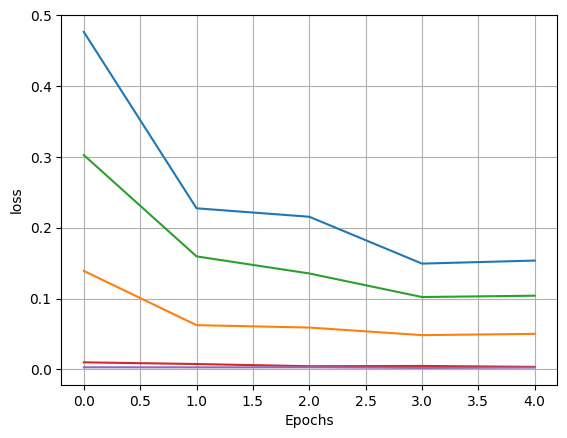

In [ ]:
fig = plt.figure()
gs=fig.add_gridspec(nrows=2 , ncols=3)
for i in range(0,len(metrics)):
  x=np.array(metrics[i])
  plt.plot(x)
  plt.xlabel('Epochs')
  plt.ylabel('loss')
  plt.grid(True)

## 5b. Visualize the predicted bounding boxes
Give 8 images to the model and visualize the predicted bounding boxes.

The first 4 images (first row) must show the ground truth bounding boxes and the predicted bounding boxes with a score greater than 0.8;
The last 4 images (second row) must show the ground truth bounding boxes and ALL the predicted bounfing boxes.
The following code selects the first image from the test set and shows it with the ground truth bounding boxes and the predicted bounding boxes with a score greater than 0.8. Complete it and then modify it following the assignment.

In [ ]:
# get an image and its bounding box from the test set
idx = 0 #index of the first image of the test set
img, _ = test_set[idx]
bounding_boxes = test_set[idx][1]["boxes"] #ground truth

# get predictions
prediction = loaded_model([img]) #predicted bounding boxes

#print 'bounding_boxes' and 'prediction' to analyze them and see
#        how they look like.
print("Prediction:")
print(prediction)
print("Ground truth:")
print(bounding_boxes)

Prediction:
[{'boxes': tensor([[393.0004, 172.4787, 507.7665, 450.3386],
        [111.3669, 174.1346, 204.3362, 448.1221],
        [  0.0000, 149.4788,  71.9331, 448.4113],
        [305.0215, 200.9153, 370.8212, 313.4165],
        [ 73.9185,  97.5685,  94.2032, 135.6346],
        [444.1980, 191.6516, 502.5887, 403.4959],
        [ 75.8962,  19.7450, 105.6305,  91.1847],
        [169.4466, 193.6052, 207.3966, 415.1734],
        [ 14.8885, 153.8633,  85.0748, 366.0695],
        [350.9720, 106.4241, 527.4565, 424.4504],
        [275.7296, 209.2817, 398.6670, 349.3427],
        [ 40.4476, 186.8769,  77.1967, 332.7341],
        [ 76.3950, 101.0771,  91.0284, 122.9368],
        [181.8856, 201.6011, 209.3794, 321.7890],
        [127.3533, 149.3664, 262.6803, 450.4790],
        [423.0714, 170.8606, 492.7784, 338.7396],
        [352.3096, 246.9744, 374.1150, 279.2121],
        [ 63.0443, 155.7882, 225.1806, 391.6887],
        [  2.8887,  51.3955, 114.4147, 443.5024],
        [ 10.3727, 169.4640

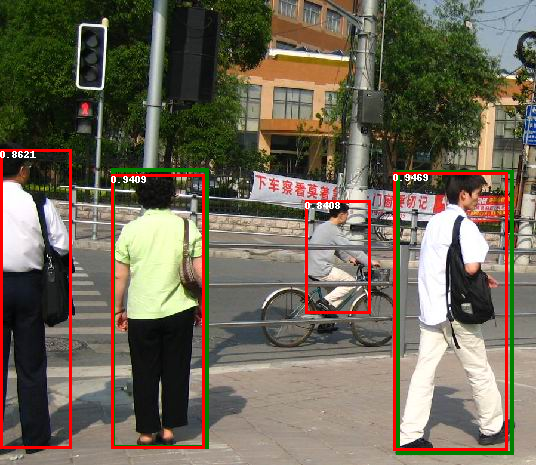

In [ ]:
# transform the image from tensor to PIL
img_PIL = torchvision.transforms.ToPILImage()(img.squeeze(0))

# draw image
draw = ImageDraw.Draw(img_PIL)

# draw ground truth
for box in range(len(bounding_boxes)): #for each bounding box in the ground truth
    # draw it on the image
    draw.rectangle([
                   ## TODO: coordinates of the bounding box
                   (bounding_boxes[box][0],bounding_boxes[box][1]),(bounding_boxes[box][2],bounding_boxes[box][3]) #...
                   ],
                   outline ="green"   ## TODO: color of the outline (green) and width
                   ,width = 4)

# draw prediction
predicted_boxes = prediction[0]["boxes"]
predicted_scores = prediction[0]["scores"]

for box in range(len(predicted_boxes)):
    # get the predicted bounding boxes
    boxes = predicted_boxes[box].detach().numpy()
    # get the scores (percentage) of the predicted bounding boxes
    score = np.round(predicted_scores[box].detach().numpy(), decimals= 4)
    if score > 0.8 : #draw only high scoring boxes
        ## TODO: draw a red rectangle for the predicted bounding box
        #...
        draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])],
        outline ="red", width =3)
        # write the score of each predicted bounding box in the top left corner
        draw.text((boxes[0], boxes[1]), text = str(score))

img_PIL #show the image with the bounding boxes

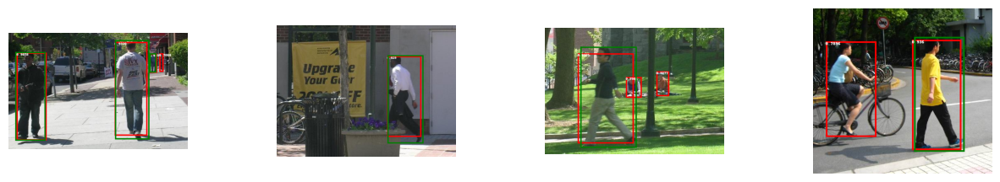

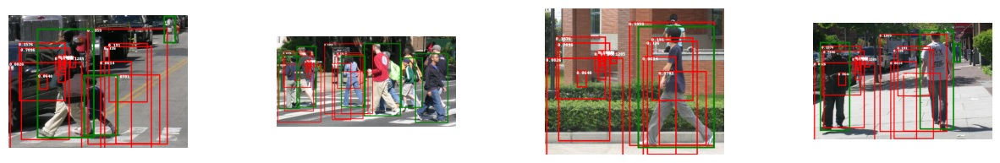

In [ ]:
import random
random_test1 = []

for _ in range(0, 4):
   random_test1.append(random.randint(0, len(test_set)-1))



fig = plt.figure(figsize=(15,20))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for idx, i in zip(random_test1, range(0,4)):
  img, _ = test_set[idx]
  bounding_boxes = test_set[idx][1]["boxes"] #ground truth
  prediction = loaded_model([img])
  # transform the image from tensor to PIL
  img_PIL = torchvision.transforms.ToPILImage()(img.squeeze(0))

  # draw image
  draw = ImageDraw.Draw(img_PIL)


  # draw prediction
  predicted_boxes = prediction[0]["boxes"]
  predicted_scores = prediction[0]["scores"]
  for box in range(len(predicted_boxes)):
      # get the predicted bounding boxes
      boxes = predicted_boxes[box].detach().numpy()
      # get the scores (percentage) of the predicted bounding boxes
      score = np.round(predicted_scores[box].detach().numpy(), decimals= 4)
      if score > 0.5: #draw only high scoring boxes
          ## TODO: draw a red rectangle for the predicted bounding box
          #...
          draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])],
          outline ="red", width =4)

          # write the score of each predicted bounding box in the top left corner
          draw.text((boxes[0], boxes[1]), text = str(score))


  # draw ground truth
  for box in range(len(bounding_boxes)): #for each bounding box in the ground truth
      # draw it on the image
      draw.rectangle([
                    ## TODO: coordinates of the bounding box
                    (bounding_boxes[box][0],bounding_boxes[box][1]),(bounding_boxes[box][2],bounding_boxes[box][3]) #...
                    ],
                    outline ="green"   ## TODO: color of the outline (green) and width
                    ,width = 4)



  fig.add_subplot(1,4, i+1)
  plt.axis('off')
  plt.imshow(img_PIL)


random_test2 = []

for _ in range(0, 4):
   random_test2.append(random.randint(0, len(test_set)-1))

fig = plt.figure(figsize=(15,20))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for idx, i in zip(random_test2, range(0,4)):
  img, _ = test_set[idx]
  bounding_boxes = test_set[idx][1]["boxes"] #ground truth
  prediction = loaded_model([img])
  # transform the image from tensor to PIL
  img_PIL = torchvision.transforms.ToPILImage()(img.squeeze(0))

  # draw image
  draw = ImageDraw.Draw(img_PIL)

  for box in range(len(predicted_boxes)):
      # get the predicted bounding boxes
      boxes = predicted_boxes[box].detach().numpy()
      # get the scores (percentage) of the predicted bounding boxes
      score = np.round(predicted_scores[box].detach().numpy(), decimals= 4)
       #draw only high scoring boxes
          ## TODO: draw a red rectangle for the predicted bounding box
          #...
      draw.rectangle([(boxes[0], boxes[1]), (boxes[2], boxes[3])],
      outline ="red", width =3)

      # write the score of each predicted bounding box in the top left corner
      draw.text((boxes[0], boxes[1]), text = str(score))

  # draw ground truth
  for box in range(len(bounding_boxes)): #for each bounding box in the ground truth
      # draw it on the image
      draw.rectangle([
                    ## TODO: coordinates of the bounding box
                    (bounding_boxes[box][0],bounding_boxes[box][1]),(bounding_boxes[box][2],bounding_boxes[box][3]) #...
                    ],
                    outline ="green"   ## TODO: color of the outline (green) and width
                    ,width = 4)


  fig.add_subplot(2,4, i+1)
  plt.axis('off')
  plt.imshow(img_PIL)


#**Evaluation Metrics for Test set**

In [ ]:
import torch
from engine import train_one_epoch, evaluate
import numpy as np
from sklearn.metrics import precision_recall_curve, auc, average_precision_score
import matplotlib.pyplot as plt
from sklearn.metrics import PrecisionRecallDisplay

from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import RocCurveDisplay, roc_curve

def centeredness(dt_bbox, gt_bbox):
    # Calculate the centeredness value
    dt_x_center = (dt_bbox[0] + dt_bbox[2]) / 2
    dt_y_center = (dt_bbox[1] + dt_bbox[3]) / 2
    l = (dt_x_center + gt_bbox[0])
    r = (gt_bbox[2] - dt_x_center)
    t = (gt_bbox[3] - dt_y_center)
    b = (dt_y_center - gt_bbox[1])

    # Calculate centerness score
    centerness = np.sqrt(abs((min(l, r) / max(l, r))) *
                          abs((min(t, b) / max(t, b))))
    return centerness


def intersection_over_union(dt_bbox, gt_bbox):
    """
    Intersection over Union between two bboxes
    :param dt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :param gt_bbox: list or numpy array of size (4,) [x0, y0, x1, y1]
    :return : intersection over union
    """
    intersection_bbox = np.array([max(dt_bbox[0], gt_bbox[0]),
                                  max(dt_bbox[1], gt_bbox[1]),
                                  min(dt_bbox[2], gt_bbox[2]),
                                  min(dt_bbox[3], gt_bbox[3])])

    intersection_area = relu(intersection_bbox[2] - intersection_bbox[0]) * relu(
        intersection_bbox[3] - intersection_bbox[1])
    area_dt = (dt_bbox[2] - dt_bbox[0]) * (dt_bbox[3] - dt_bbox[1])
    area_gt = (gt_bbox[2] - gt_bbox[0]) * (gt_bbox[3] - gt_bbox[1])

    union_area = area_dt + area_gt - intersection_area

    iou = intersection_area / union_area
    return iou


def evaluate_sample(target_pred, target_true, iou_threshold=0.5, score_threshold=0.8):
    """
    For a given sample, gets if each detection is a True Positive or a False positive
    :param target_pred : dictionary describing the predicted detection (should have 'boxes', 'labels', 'scores')
    :param target_true : dictionary describing the ground truth (should have 'boxes', 'labels')
    :param iou_threshold: The treshold on IoU, to judge if a detection is correct or not
    :return : List of dictionaries with same size as detections, each dict have keys
              'score'  and 'TP' (= 1 if true positive and 0 otherwise)
    """
    gt_bboxes = target_true['boxes'].numpy()
    gt_labels = target_true['labels'].numpy()
    gt_masks  = target_true['masks'].numpy()

    dt_bboxes = target_pred['boxes'].numpy()
    dt_labels = target_pred['labels'].numpy()
    dt_scores = target_pred['scores'].numpy()

    # Filter out predictions with a score below the threshold
    filter_mask = dt_scores >= score_threshold
    dt_bboxes = dt_bboxes[filter_mask]
    dt_labels = dt_labels[filter_mask]
    dt_scores = dt_scores[filter_mask]


    # Perform NMS on predicted boxes
    #keep_indices = nms(torch.tensor(dt_bboxes), torch.tensor(dt_scores), iou_threshold=nms_threshold)
    #dt_bboxes = dt_bboxes[keep_indices]
    #dt_labels = dt_labels[keep_indices]
    #dt_scores = dt_scores[keep_indices]



    results = []
    for detection_id in range(len(dt_labels)):
        dt_bbox = dt_bboxes[detection_id, :]
        dt_label = dt_labels[detection_id]
        dt_score = dt_scores[detection_id]

        detection_result_dict = {'score': dt_score}

        max_IoU = 0
        max_gt_id = -1
        for gt_id in range(len(gt_labels)):
            gt_bbox = gt_bboxes[gt_id, :]
            gt_label = gt_labels[gt_id]

            if gt_label != dt_label:
                continue

            if intersection_over_union(dt_bbox, gt_bbox) > max_IoU:
                max_IoU = intersection_over_union(dt_bbox, gt_bbox)
                max_gt_id = gt_id

        if max_gt_id >= 0 and max_IoU >= iou_threshold:
            detection_result_dict['TP'] = 1
            gt_labels = np.delete(gt_labels, max_gt_id, axis=0)
            gt_bboxes = np.delete(gt_bboxes, max_gt_id, axis=0)

        else:
            detection_result_dict['TP'] = 0

        results.append(detection_result_dict)

    return results

def evaluate_confidence(model, test_loader, device,score_confidence =0.75):

    """
    Computes precision and recall for a given trehsold (default = 0.5)
    :param model :
    :param test_loader:
    :param device:
    :return : tuple containing precision and recall
    """
    all_targets_true = []
    centeredness_values = []
    all_boxes_pred = []
    all_confidence_scores = []
    iou_scores = []

    confidence_threshold=score_confidence
    iou_threshold=0.5
    results = []
    model.to(device)
    model.eval()
    nbr_boxes = 0
    evaluate(model, test_loader, device=device)
    with torch.no_grad():
        for batch, (images, targets_true) in enumerate(test_loader):
            images = list(image.to(device).float() for image in images)
            targets_pred = model(images)

            targets_true = [{k: v.cpu().float() for k, v in t.items()} for t in targets_true]
            targets_pred = [{k: v.cpu().float() for k, v in t.items()} for t in targets_pred]


            for target_true, target_pred in zip(targets_true, targets_pred):
                all_targets_true.append(target_true)
                boxes_pred = target_pred['boxes']
                confidence_scores = target_pred['scores']

                # Filter predictions based on confidence threshold
                mask = confidence_scores > confidence_threshold
                boxes_pred = boxes_pred[mask]
                confidence_scores = confidence_scores[mask]

                all_boxes_pred.append(boxes_pred)
                all_confidence_scores.append(confidence_scores)


            for ii in range(len(targets_true)):
                target_true = targets_true[ii]
                target_pred = targets_pred[ii]
                nbr_boxes += target_true['labels'].shape[0]

                results = results + evaluate_sample(target_pred, target_true,iou_threshold,confidence_threshold)
                                # Collect IoU scores for each prediction
                for dt_id in range(len(target_pred['labels'])):
                    iou = intersection_over_union(target_pred['boxes'][dt_id].numpy(), target_true['boxes'][0].numpy())
                    iou_scores.append((target_pred['scores'][dt_id].item(), iou))
                    centeredness_val = centeredness(target_pred['boxes'][dt_id].numpy(), target_true['boxes'][0].numpy())
                    centeredness_values.append((target_pred['scores'][dt_id].item(), centeredness_val))



    all_targets_true = torch.cat([t['boxes'] for t in all_targets_true]).numpy()
    all_boxes_pred = torch.cat(all_boxes_pred).numpy()
    all_confidence_scores = torch.cat(all_confidence_scores).numpy()

    # Calculate IoU for each prediction
    ious = []
    for true_box in all_targets_true:
        iou_values = [intersection_over_union(pred_box,true_box) for pred_box in all_boxes_pred]

        ious.append(iou_values)

    ious = np.array(ious)

    # Precision-Recall curve
    precision, recall, thresholds = precision_recall_curve((ious > iou_threshold).any(axis=0), all_confidence_scores)
    average_precision = average_precision_score((ious > iou_threshold).any(axis=0), all_confidence_scores)
    display = PrecisionRecallDisplay(
    recall=recall,
    precision=precision,
    average_precision=average_precision,)
    # Plot Precision-Recall Curve
    #plt.plot(recall, precision, label=f'AP={average_precision:.2f}')
    #plt.xlabel('Recall')
    #plt.ylabel('Precision')
    #plt.title('Precision-Recall Curve')
    #plt.legend()
    #plt.show()


    results = sorted(results, key=lambda k: k['score'], reverse=True)

    acc_TP = np.zeros(len(results))
    acc_FP = np.zeros(len(results))
    recall = np.zeros(len(results))
    precision = np.zeros(len(results))

    if results[0]['TP'] == 1:
        acc_TP[0] = 1
    else:
        acc_FP[0] = 1

    for ii in range(1, len(results)):
        acc_TP[ii] = results[ii]['TP'] + acc_TP[ii - 1]
        acc_FP[ii] = (1 - results[ii]['TP']) + acc_FP[ii - 1]

        precision[ii] = acc_TP[ii] / (acc_TP[ii] + acc_FP[ii])
        recall[ii] = acc_TP[ii] / nbr_boxes
    pr_display = PrecisionRecallDisplay(precision=precision, recall=recall, average_precision=auc(recall, precision)).plot()
    roc_display = RocCurveDisplay(fpr=acc_FP, tpr=acc_TP).plot()



    # Extract scores and IoU values for plotting
    scores, iou_values = zip(*iou_scores)

    # Plotting IoU versus Box Scores
    plt.scatter(scores, iou_values, s=5, alpha=0.5)
    plt.xlabel('Box Scores')
    plt.ylabel('IoU with Ground Truth')
    plt.title('IoU versus Box Scores')
    plt.show()

    # Extract scores and centeredness values for plotting
    scores_centeredness, centeredness_values = zip(*centeredness_values)


    # Plotting Centeredness versus Box Scores
    plt.scatter(scores_centeredness, centeredness_values, s=5, alpha=0.5, label='Centeredness')
    plt.xlabel('Box Scores')
    plt.ylabel('Centeredness')
    plt.title('Centeredness versus Box Scores')
    plt.legend()
    plt.show()

    return precision,recall, average_precision
# Example usage:
#precision, recall, average_precision = evaluate_confidence(loaded_model, test_loader, device,score_confidence =0.75)


## 6. Results, observations and conclusions

Conclusion: we visualize the first four images with learned bounding boxes and ground truth. Sometimes, region of the interest put a box around a person but miss the head ,and as can be seen in the first image from first row, the predicted bounding box is drawn around the person without considering his head. In this project, we set a threshold 0.8 for the scores computed by the measurement IoU, This means that if the IoU value between the ground truth bounding boxes and the predicted boxes is greater than 0.8 , Then it is True positive meaning that there is an object (person) and this object is detected. But There are some images (image6 and image7 in the second row) where we can see that the ground truth boxes are present around the persons but there is no predicted boxes around some person and this is because that the model failed to predict that person as an object and it consider as false negative, after running the code several times, There is some images in the first row where we can see that the ground truth boxes are present around the persons but there is no predicted boxes around some person one hypothesis is that maybe its scores value is less than threshold value 0.8(meaning that IoU < 0.8) so that the predicted bounding box is not appeared or maybe the machine fail to predict them. In general, we have to notice that we only train the model for just 10 epochs, with considering this, we can conclude that the network's performance is well.

In the second row, we visualize the 4 images with their ground truth and all predicted bounding boxes related to false positive and true positive with the scores both greater or less than the threshold 0.8 .

# **Engine Part (training the detection model)**

# **The main part(Calling the model on the dataset)**
# **Second Model**

In [ ]:
import os
import torch
import math
import torch.nn.functional as F
import torch.nn as nn

import numpy as np
from engine import train_one_epoch, evaluate

import time

from torchvision.models.detection import fasterrcnn_resnet50_fpn

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from sklearn.metrics import auc
from torchvision.models.detection.rpn import AnchorGenerator




def get_detection_model(model,num_classes=2,anchor_sizes=None, aspect_ratios=None):
    """
    Get Faster R-CNN model pretrained on COCO dataset
    :param num_classes: The number of classes that the model should detect
    :return: Torch model
    """
    count = 0
    for child in model.backbone.children():
        if count == 0:
            for param in child.parameters():
                param.requires_grad = False
        count += 1

    for param in model.roi_heads.box_head.fc6.parameters():
        param.requires_grad = False



    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model


def train_one_epoch(model, optimizer, data_loader, device,epoch):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter('lr', utils.SmoothedValue(window_size=1, fmt='{value:.6f}'))
    header = 'Epoch: [{}]'.format(epoch)

    count = 0
    global_loss = 0
    for images, targets in metric_logger.log_every(data_loader,print_freq=50,header = 'Epoch: [{}]'.format(epoch)):
        images = list(image.to(device).float() for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        dict_loss = model(images, targets)
        losses = sum(loss for loss in dict_loss.values())

        # reduce losses over all GPUs for logging purposes
        loss_dict_reduced = utils.reduce_dict(dict_loss)
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())

        loss_value = losses_reduced.item()

        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        count += 1
        global_loss += float(losses.cpu().detach().numpy())
        metric_logger.update(loss=losses_reduced, **loss_dict_reduced)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])


        if count % 10 == 0:
            print("Loss value after {} batches is {}".format(count, round(global_loss / count, 2)))


    return  round(global_loss / count, 2), metric_logger


def train(model, num_epochs,train_loader, valid_loader, optimizer, device, save_path):

    best_mAP = float('inf')
    no_improvement_count = 0
    metric_collector = []
    patience=5
    global_losses = []
    train_accs = []
    valid_accs = []
    time_current = 0
    """
    Train the model
    :param model:
    :param num_epochs:
    :param train_loader:
    :param test_loader:
    :param optimizer:
    :param device:
    :param save_path
    :return:
    """
    for epoch in range(num_epochs):
        print("epoch {}/{}..".format(epoch, num_epochs))
        start = time.time()
        global_loss,metric_logger = train_one_epoch(model, optimizer, train_loader, device,epoch)
        end = time.time()



        mAPT = evaluate_custom(model, train_loader, device=device)


        mAP = evaluate_custom(model, valid_loader, device=device)


        time_current = time_current + round(end - start, 2)

        print("epoch {} done in {}s".format(epoch, round(end - start, 2)))
        print("mAP after epoch {} is {}:".format(epoch, round(mAP, 3)))


        if mAP < best_mAP:
            best_mAP = mAP
            no_improvement_count = 0
            print("Best mAP improved. Model saved to {}".format(os.path.join(save_path, "best_model.pth")))
            torch.save(model.state_dict(), os.path.join(save_path, "best_model.pth"))
        else:
            no_improvement_count += 1

        if no_improvement_count >= patience:
            print(f"No improvement for {no_improvement_count} epochs. Early stopping.")
            break


        if (epoch + 1) % 5 == 0:
            print("Model saved to {}".format(os.path.join(save_path,
                                                          str(epoch) + ".pth")))
            torch.save(model.state_dict(),
                       os.path.join(save_path, str(epoch) + ".pth"))


        global_losses.append(global_loss)
        metric_collector.append(metric_logger)

        train_accs.append(mAPT)
        valid_accs.append(mAP)


        print('#' * 25)

    torch.save(model.state_dict(),
               os.path.join(save_path, str(num_epochs) + ".pth"))
    print("Training completed.")

    return train_accs,valid_accs, global_losses,metric_collector,time_current//epoch



In [ ]:
import os
import time

import torch
from torch.utils.data import DataLoader



root_path = '/content/data/PennFudanPed'
save_path = "../models"
show_example = False
num_epochs = 10
batch_size = 10
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


if __name__ == "__main__":
    # Create Dataloader
    dataset = PennFudanDataset(root_path, transforms=Compose([ToTensor()]))

    # split the dataset in train and test set
    torch.manual_seed(42)
    indices = torch.randperm(len(dataset)).tolist()
    dataset_train = torch.utils.data.Subset(dataset, indices[:-50])
    dataset_test = torch.utils.data.Subset(dataset, indices[-50:])

    if not os.path.exists(save_path):
        os.makedirs(save_path)

    train_loader = DataLoader(dataset_train, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

    if show_example:
        img, target = dataset[10]
        show_sample(img, target)

    # Create the model
    model = fasterrcnn_resnet50_fpn(pretrained=True)
    model = get_detection_model(model,num_classes=2)
    model.to(device)

    # Construct optimizer

    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    # Train the model
    train_accs, valid_accs,global_losses,metric_collector, time =train(model, num_epochs, train_loader, valid_loader, optimizer, device,save_path)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch 0/10..
Epoch: [0]  [ 0/12]  eta: 0:00:28  lr: 0.005000  loss: 1.1502 (1.1502)  loss_classifier: 0.7789 (0.7789)  loss_box_reg: 0.3535 (0.3535)  loss_objectness: 0.0118 (0.0118)  loss_rpn_box_reg: 0.0060 (0.0060)  time: 2.3384  data: 0.2585  max mem: 9377
Loss value after 10 batches is 0.58
Epoch: [0]  [11/12]  eta: 0:00:02  lr: 0.005000  loss: 0.4656 (0.5430)  loss_classifier: 0.1960 (0.2572)  loss_box_reg: 0.2403 (0.2661)  loss_objectness: 0.0129 (0.0148)  loss_rpn_box_reg: 0.0049 (0.0050)  time: 2.2811  data: 0.1659  max mem: 11237
Epoch: [0] Total time: 0:00:27 (2.2816 s / it)
epoch 0 done in 27.38s
mAP after epoch 0 is 0.785:
Best mAP improved. Model saved to ../models/best_model.pth
#########################
epoch 1/10..
Epoch: [1]  [ 0/12]  eta: 0:00:24  lr: 0.005000  loss: 0.3289 (0.3289)  loss_classifier: 0.0661 (0.0661)  loss_box_reg: 0.2347 (0.2347)  loss_objectness: 0.0224 (0.0224)  loss_rpn_box_reg: 0.0056 (0.0056)  time: 2.0828  data: 0.1423  max mem: 11237
Loss valu

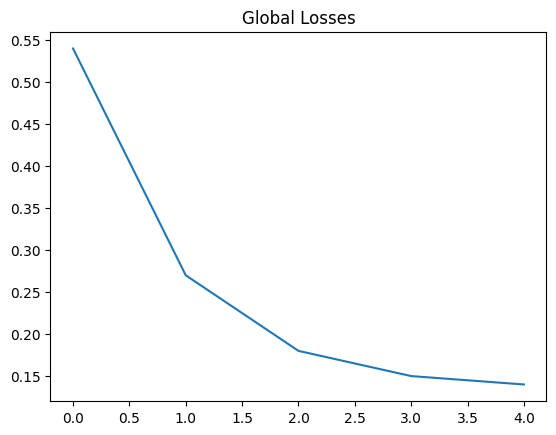

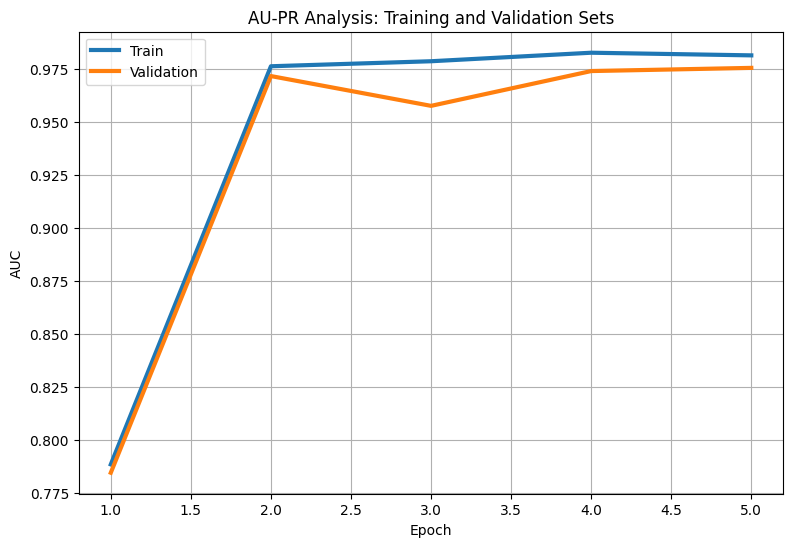

creating index...
index created!
Test:  [0/5]  eta: 0:00:10  model_time: 1.7414 (1.7414)  evaluator_time: 0.0077 (0.0077)  time: 2.0102  data: 0.2520  max mem: 11237
Test:  [4/5]  eta: 0:00:01  model_time: 1.2628 (1.3930)  evaluator_time: 0.0077 (0.0073)  time: 1.5586  data: 0.1516  max mem: 11237
Test: Total time: 0:00:07 (1.5591 s / it)
Averaged stats: model_time: 1.2628 (1.3930)  evaluator_time: 0.0077 (0.0073)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.779
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.986
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.907
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.600
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.582
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.797
 Average Recall     (AR) @[ IoU=0.

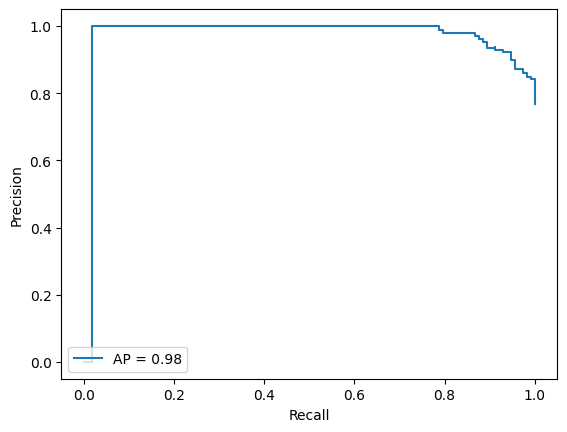

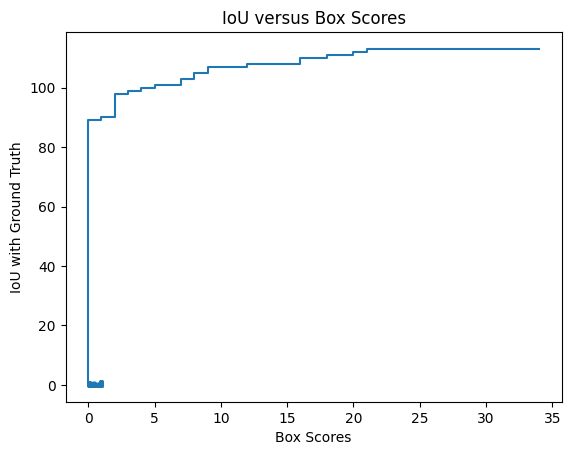

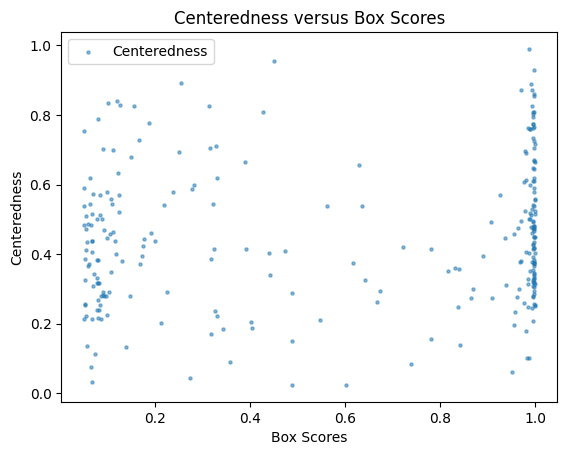

In [ ]:
get_metric_collector(metric_collector)
plt.plot(global_losses)
plt.title('Global Losses')
#plot_metric_collector(metrics)
plot_results(5,train_accs, valid_accs)
loaded_model = model.eval()

precision, recall, average_precision = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.5)

In [ ]:
pip install "git+https://github.com/philferriere/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI"


  Cloning https://github.com/philferriere/cocoapi.git to /tmp/pip-install-bpfx1eqq/pycocotools_7f771aba99854f39ad2076fb8a9e8d12
  Running command git clone --filter=blob:none --quiet https://github.com/philferriere/cocoapi.git /tmp/pip-install-bpfx1eqq/pycocotools_7f771aba99854f39ad2076fb8a9e8d12
  Resolved https://github.com/philferriere/cocoapi.git to commit 2929bd2ef6b451054755dfd7ceb09278f935f7ad
  Preparing metadata (setup.py) ... done


In [ ]:
import cv2
import numpy as np
import random
import torch
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks



# this will help us create a different color for each class
COLORS = np.random.uniform(0, 255, size=(1, 3))


def get_outputs(image, model, threshold):
    with torch.no_grad():
        # forward pass of the image through the modle
        outputs = model(image)

    # get all the scores
    scores = list(outputs[0]['scores'].detach().cpu().numpy())
    # index of those scores which are above a certain threshold
    thresholded_preds_inidices = [scores.index(i) for i in scores if i > threshold]
    thresholded_preds_count = len(thresholded_preds_inidices)
    # get the masks
    masks = (outputs[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    # discard masks for objects which are below threshold
    masks = masks[:thresholded_preds_count]
    # get the bounding boxes, in (x1, y1), (x2, y2) format
    boxes = [[(int(i[0]), int(i[1])), (int(i[2]), int(i[3]))]  for i in outputs[0]['boxes'].detach().cpu()]
    # discard bounding boxes below threshold value
    boxes = boxes[:thresholded_preds_count]
    # get the classes labels
    labels = [coco_names[i] for i in outputs[0]['labels']]
    return masks, boxes, labels


def draw_segmentation_map(image, masks, boxes, labels):
    alpha = 1
    beta = 0.6 # transparency for the segmentation map
    gamma = 0 # scalar added to each sum
    for i in range(len(masks)):
        red_map = np.zeros_like(masks[i]).astype(np.uint8)
        green_map = np.zeros_like(masks[i]).astype(np.uint8)
        blue_map = np.zeros_like(masks[i]).astype(np.uint8)
        # apply a randon color mask to each object
        color = COLORS[random.randrange(0, len(COLORS))]
        red_map[masks[i] == 1], green_map[masks[i] == 1], blue_map[masks[i] == 1]  = color
        # combine all the masks into a single image
        segmentation_map = np.stack([red_map, green_map, blue_map], axis=2)
        #convert the original PIL image into NumPy format
        image = np.array(image)
        # convert from RGN to OpenCV BGR format
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        # apply mask on the image
        cv2.addWeighted(image, alpha, segmentation_map, beta, gamma, image)
        # draw the bounding boxes around the objects
        cv2.rectangle(image, boxes[i][0], boxes[i][1], color=color,
                      thickness=2)
        # put the label text above the objects
        cv2.putText(image , labels[i], (boxes[i][0][0], boxes[i][0][1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, color,
                    thickness=2, lineType=cv2.LINE_AA)

    return image

(-0.5, 566.5, 437.5, -0.5)

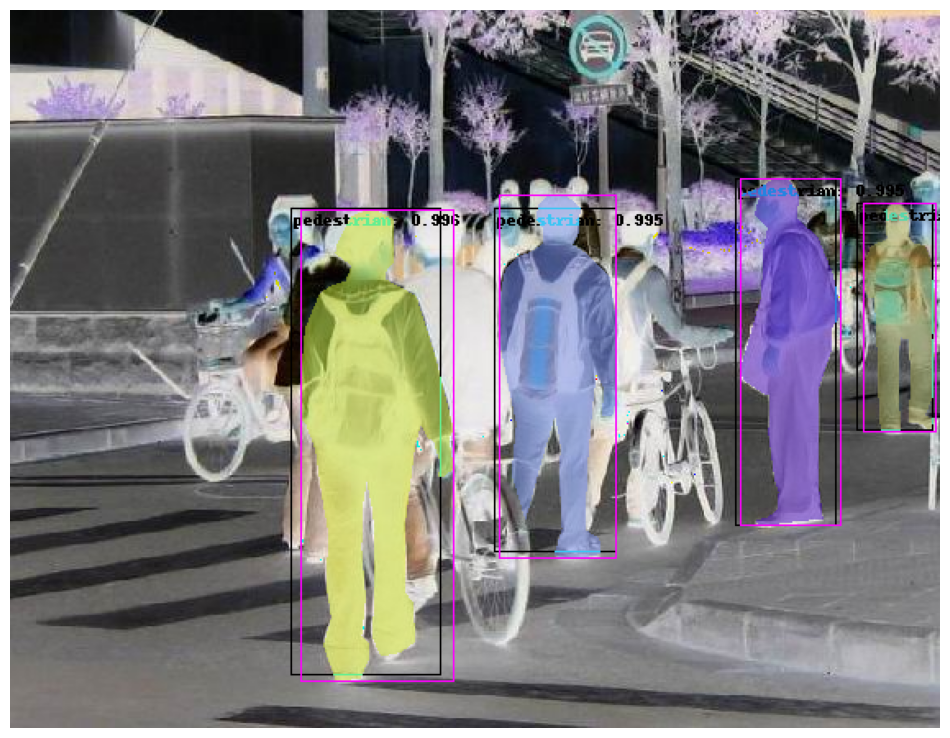

In [ ]:
from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
from PIL import Image
from torchvision import transforms
from torchvision.transforms import functional as F
import torch
import matplotlib.pyplot as plt
from torchvision import tv_tensors
from torchvision.transforms import v2 as T
from torchvision.ops import nms


def get_transform(train):
    transforms = []
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    transforms.append(T.ToDtype(torch.float, scale=True))
    transforms.append(T.ToPureTensor())
    return T.Compose(transforms)


image = read_image( "/content/data/PennFudanPed/PNGImages/FudanPed00046.png")



from PIL import Image
from torchvision.transforms import functional as F
import matplotlib.pyplot as plt

# Define the CustomTransform instance




image = read_image("/content/data/PennFudanPed/PNGImages/FudanPed00046.png")
eval_transform = get_transform(train=False)

model.eval()
with torch.no_grad():
    x = eval_transform(image)
    # convert RGBA -> RGB and move to device
    x = x[:3, ...].to(device)
    predictions = model([x, ])
    pred = predictions[0]

def Non_Maximum_Suppression(pred,score_threshold = 0.97):

      # Filter boxes based on a score threshold
    score_threshold = 0.97  # Adjust this threshold as needed
    high_score_indices = pred["scores"] > score_threshold

    # Keep only high-scoring predictions
    pred = {
        "boxes": pred["boxes"][high_score_indices],
        "labels": pred["labels"][high_score_indices],
        "scores": pred["scores"][high_score_indices]
    }
    return pred



pred = Non_Maximum_Suppression(pred,score_threshold = 0.97)

image = (255.0 * (image - image.min()) / (image.max() - image.min())).to(torch.uint8)
image = image[:3, ...]
pred_labels = [f"pedestrian: {score:.3f}" for label, score in zip(pred["labels"], pred["scores"])]
pred_boxes = pred["boxes"].long()



output_image = draw_bounding_boxes(image, pred_boxes, pred_labels, colors="red")

root_path = '/content/data/PennFudanPed'
dataset = PennFudanDataset(root_path, transforms=Compose([ToTensor()]))

index = 45  # Choose the index of the image you want to display
img, target = dataset[index]
masks = tv_tensors.Mask(target["masks"])
masks = (masks > 0.9).squeeze(1)
import random



for i in range(len(masks)):
  # Generate three random values between 0 and 255
  color_tuple = tuple(random.randint(0, 255) for _ in range(3))

  output_image = draw_segmentation_masks(output_image, masks[i], alpha=0.5, colors=color_tuple)

plt.figure(figsize=(12, 12))
plt.imshow(show_sample(output_image, target,show=True))
plt.axis("off")



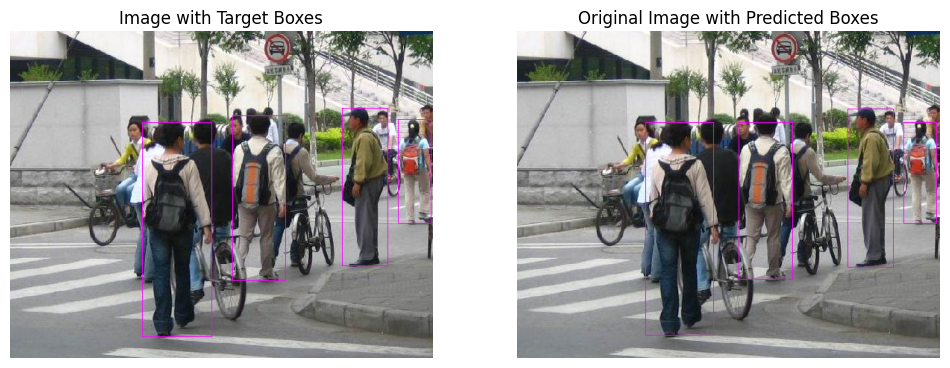

In [ ]:
#plt.imshow(output_image.permute(1, 2, 0))
#plt.title('Image with predicted boxes')
root_path = '/content/data/PennFudanPed'
dataset = PennFudanDataset(root_path, transforms=Compose([ToTensor()]))

index = 45  # Choose the index of the image you want to display
img, target = dataset[index]


# Set the figure size
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Original Image with Target Boxes
axes[0].imshow(show_sample(img, target,show=True))
axes[0].set_title('Image with Target Boxes')
axes[0].axis("off")

# Transformed Image with Predicted Boxes
axes[1].imshow(show_sample(img, pred,show=True))
axes[1].set_title("Original Image with Predicted Boxes")
axes[1].axis("off")


plt.show()

In [ ]:
# Assuming you have an instance of PennFudanDataset and an index
import matplotlib.pyplot as plt

# Create an instance of CustomTransform and pass image, target


root_path = '/content/data/PennFudanPed'
datasett = PennFudanDataset(root_path, transforms=CustomTransform())  # You can provide other necessary arguments

# Choose an index
index = 80

# Get a sample from the dataset
sample = datasett[index]

# Separate the image and target
image, target = sample




/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


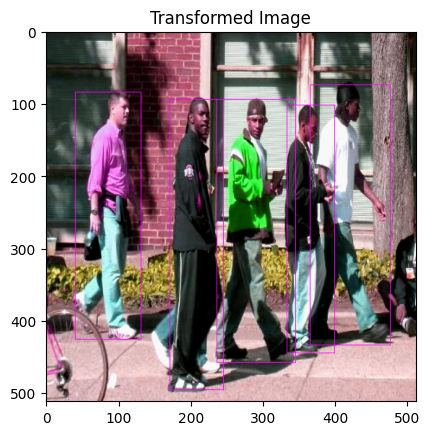

In [ ]:
plt.imshow(show_sample(image, target,show=True))
plt.title("Transformed Image")
plt.show()

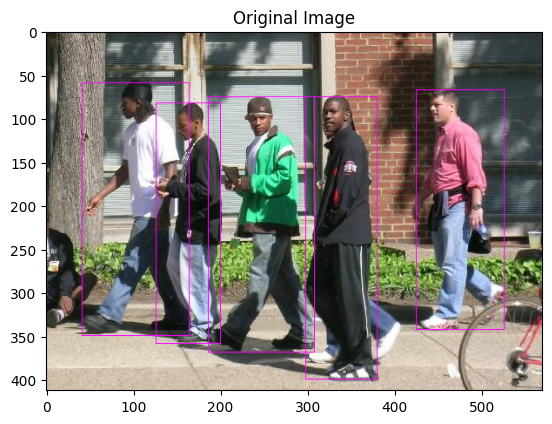

In [ ]:
# Assuming you have an instance of PennFudanDataset and an index
dataset = PennFudanDataset(root_path, transforms=Compose([ToTensor()]))  # You can provide other necessary arguments

# Choose an index
index = 80

# Get a sample from the dataset
sample = dataset[index]

# Separate the image and target
image, target = sample

plt.imshow(show_sample(image, target,show=True))
plt.title("Original Image")
plt.show()

# **Trying Different Models and report the results**

In [ ]:

from torchvision.models.detection import fasterrcnn_resnet50_fpn,FasterRCNN, FasterRCNN_ResNet50_FPN_Weights
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2,FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn,FasterRCNN_MobileNet_V3_Large_FPN_Weights
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn,FasterRCNN_MobileNet_V3_Large_320_FPN_Weights
from torchvision.models.detection import FCOS,fcos_resnet50_fpn,FCOS_ResNet50_FPN_Weights
from torchvision.models.detection import RetinaNet,retinanet_resnet50_fpn,RetinaNet_ResNet50_FPN_Weights
from torchvision.models.detection import RetinaNet,retinanet_resnet50_fpn_v2,RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection import ssd300_vgg16,SSD300_VGG16_Weights
from torchvision.models.detection import ssdlite320_mobilenet_v3_large,SSDLite320_MobileNet_V3_Large_Weights
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

import torch

def modify_object_detection_model(model, num_classes=2, freeze_backbone=True, freeze_head=True):
    # Modify the number of classes in the model
    if isinstance(model, FasterRCNN):
        # For FasterRCNN, RetinaNet, and similar models
        in_features = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    elif model=='SSD':
        # For SSD models
        in_channels = model.box_predictor.cls_convs[0].in_channels
        model.box_predictor = models.ssd.SSDPredictor(in_channels, num_classes)
    elif model=='RetinaNet':
        # For RetinaNet models
        in_channels = model.cls_head.cls_convs[0].in_channels
        model.cls_head = models.detection.retinanet.RetinaNetHead(in_channels, num_classes)
    elif model=="FCOS":
        # For FCOS models
        in_channels = model.centerness.cls_convs[0].in_channels
        model.centerness = models.detection.fcos.FCOSHead(in_channels, num_classes)

    # Freeze backbone layers
    count = 0
    for child in model.backbone.children():
        if count == 0:
            for param in child.parameters():
                param.requires_grad = False
        count += 1


    return model





def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask,
        hidden_layer,
        num_classes
    )

    return model



######FasterRCNN_Models
model1 = fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT, pretrained=True)
model2 = fasterrcnn_resnet50_fpn_v2(weights=FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT, pretrained=True)
model3 = fasterrcnn_mobilenet_v3_large_fpn(weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT, pretrained=True)
model4 = fasterrcnn_mobilenet_v3_large_320_fpn(weights=FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.DEFAULT, pretrained=True)

#########################################################################################

######FCOS_Model

model5 = fcos_resnet50_fpn(weights=FCOS_ResNet50_FPN_Weights.DEFAULT, pretrained=True)

######RetinaNet_Models

model6 = retinanet_resnet50_fpn(weights=RetinaNet_ResNet50_FPN_Weights.DEFAULT, pretrained=True)
model7 = retinanet_resnet50_fpn_v2(weights=RetinaNet_ResNet50_FPN_V2_Weights, pretrained=True)

######SSD_Models
model8 = ssd300_vgg16(weights=SSD300_VGG16_Weights.DEFAULT, pretrained=True)
model9 = ssdlite320_mobilenet_v3_large(weights=SSDLite320_MobileNet_V3_Large_Weights.DEFAULT,pretrained=True)

# Examples of usage:
model1 = modify_object_detection_model(model1, num_classes=2, freeze_backbone=True, freeze_head=True)
model2 = modify_object_detection_model(model2, num_classes=2, freeze_backbone=True, freeze_head=True)
model3 = modify_object_detection_model(model3, num_classes=2, freeze_backbone=True, freeze_head=True)
model4 = modify_object_detection_model(model4, num_classes=2, freeze_backbone=True, freeze_head=True)
model5 = modify_object_detection_model(model5, num_classes=2, freeze_backbone=True, freeze_head=True)
model6 = modify_object_detection_model(model6, num_classes=2, freeze_backbone=True, freeze_head=True)
model7 = modify_object_detection_model(model7, num_classes=2, freeze_backbone=True, freeze_head=True)
model8 = modify_object_detection_model(model8, num_classes=2, freeze_backbone=True, freeze_head=True)
model9 = modify_object_detection_model(model9, num_classes=2, freeze_backbone=True, freeze_head=True)
model10 = get_model_instance_segmentation(2)



Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100%|██████████| 167M/167M [00:01<00:00, 115MB/s]
Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth
100%|██████████| 74.2M/74.2M [00:00<00:00, 85.4MB/s]
Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_320_fpn-907ea3f9.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_320_fpn-907ea3f9.pth
100%|██████████| 74.2M/74.2M [00:00<00:00, 139MB/s]
Downloading: "https://download.pytorch.org/models/fcos_resnet50_fpn_coco-99b0c9b7.pth" to /root/.cache/torch/hub/checkpoints/fcos_resnet50_fpn_coco-99b0c9b7.pth
100%|██████████| 124M/124M [00:00<00:00, 141MB/s]
Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eea

In [ ]:
def main(model):
    # Create Dataloader

    # Combine the default transforms with additional transforms (e.g., ToTensor())
    custom_transforms = Compose([ToTensor()])

    dataset = PennFudanDataset(root_path, transforms=custom_transforms)

    # split the dataset in train and test set
    torch.manual_seed(42)
    indices = torch.randperm(len(dataset)).tolist()
    dataset_train = torch.utils.data.Subset(dataset, indices[:-50])
    dataset_valid = torch.utils.data.Subset(dataset, indices[-50:-30])
    dataset_test = torch.utils.data.Subset(dataset, indices[-30:])

    if not os.path.exists(save_path):
        os.makedirs(save_path)

    train_loader = DataLoader(dataset_train, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    valid_loader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

    if show_example:
        img, target = dataset[10]
        show_sample(img, target)

    # Create the model
    model = model
    model.to(device)

    # Construct optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    count_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

    # Train the model
    num_epochs = 10
    train_accs, valid_accs,global_losses,metric_collector, time =train(model, num_epochs, train_loader, valid_loader, optimizer, device, save_path)
    return model, train_accs, valid_accs,global_losses,metric_collector, time, count_parameters

In [ ]:
model_resnet50_fpn, train_accs_resnet50_fpn, valid_accs_resnet50_fpn,global_losses_resnet50_fpn,metric_collector_resnet50_fpn, time_resnet50_fpn, resnet50_fpn_parameters = main(model1)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:32  lr: 0.005000  loss: 1.1435 (1.1435)  loss_classifier: 0.7891 (0.7891)  loss_box_reg: 0.3194 (0.3194)  loss_objectness: 0.0228 (0.0228)  loss_rpn_box_reg: 0.0122 (0.0122)  time: 0.2733  data: 0.0158  max mem: 2472
Loss value after 10 batches is 0.59
Loss value after 20 batches is 0.44
Loss value after 30 batches is 0.4
Loss value after 40 batches is 0.35
Loss value after 50 batches is 0.31
Epoch: [0]  [ 50/120]  eta: 0:00:12  lr: 0.005000  loss: 0.1640 (0.3054)  loss_classifier: 0.0393 (0.1030)  loss_box_reg: 0.1140 (0.1848)  loss_objectness: 0.0029 (0.0115)  loss_rpn_box_reg: 0.0040 (0.0061)  time: 0.1710  data: 0.0160  max mem: 2472
Loss value after 60 batches is 0.28
Loss value after 70 batches is 0.26
Loss value after 80 batches is 0.25
Loss value after 90 batches is 0.24
Loss value after 100 batches is 0.23
Epoch: [0]  [100/120]  eta: 0:00:03  lr: 0.005000  loss: 0.1767 (0.2281)  loss_classifier: 0.0426 (0.0721)  loss_box_reg: 0.103

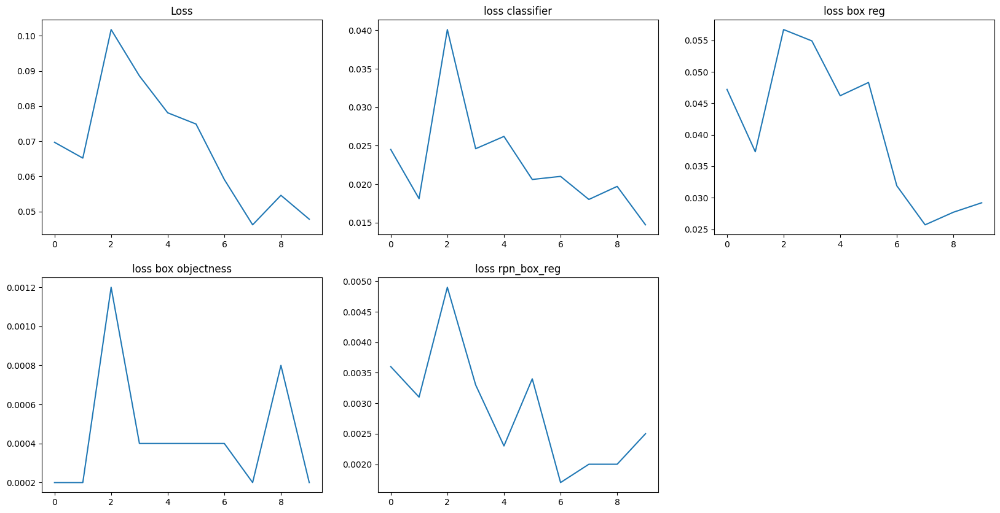

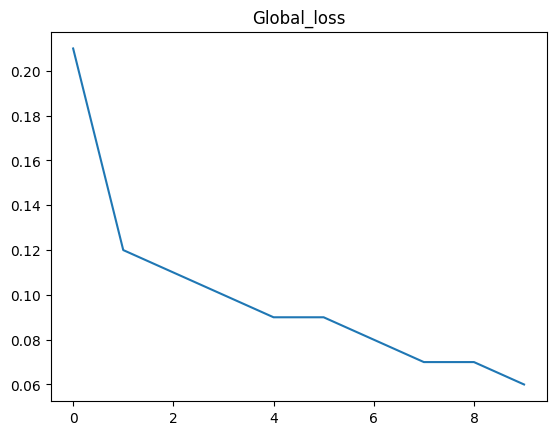

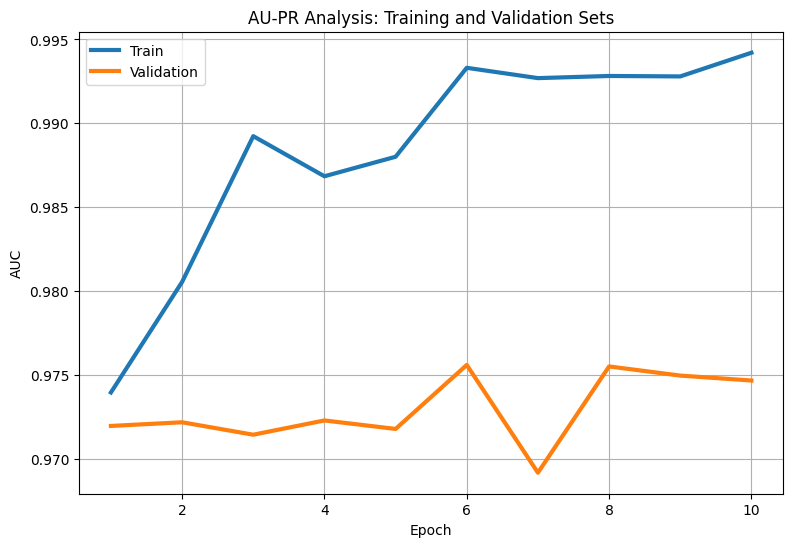

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:07  model_time: 0.1376 (0.1376)  evaluator_time: 0.0015 (0.0015)  time: 0.1515  data: 0.0117  max mem: 2472
Test:  [49/50]  eta: 0:00:00  model_time: 0.0994 (0.1072)  evaluator_time: 0.0017 (0.0017)  time: 0.1275  data: 0.0212  max mem: 2472
Test: Total time: 0:00:06 (0.1308 s / it)
Averaged stats: model_time: 0.0994 (0.1072)  evaluator_time: 0.0017 (0.0017)
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.796
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.989
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.895
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.525
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.639
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.821
 Average Recall     (AR) @[ IoU=

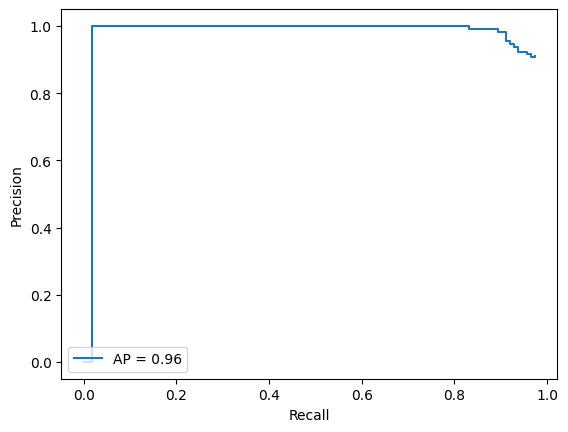

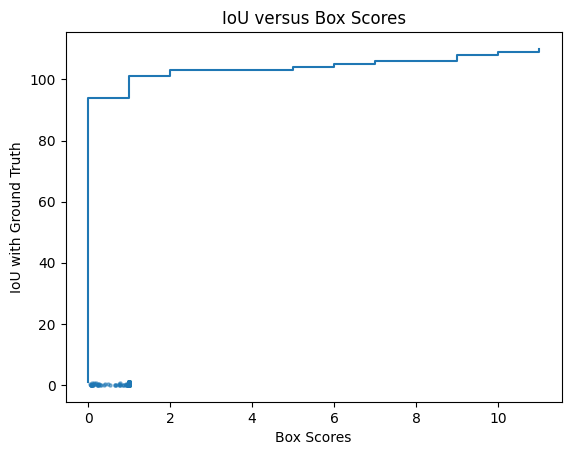

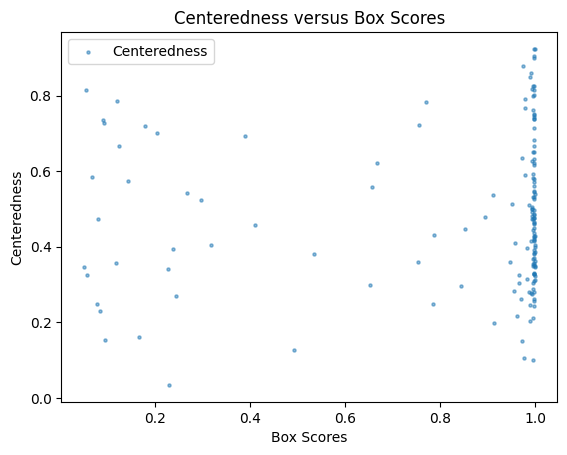

Time of training is 24.0 and the number of parameters for this model is 17844249:


In [ ]:
metrics = get_metric_collector(metric_collector_resnet50_fpn)
plot_metric_collector(metrics)
plt.plot(global_losses_resnet50_fpn)
plt.title("Global_loss")
plot_results(10,train_accs_resnet50_fpn, valid_accs_resnet50_fpn)
loaded_model = model_resnet50_fpn.eval()


precision_resnet50_fpn, recall_resnet50_fpn, average_precision_resnet50_fpn = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.79)
print("Time of training is {} and the number of parameters for this model is {}:".format(time_resnet50_fpn, resnet50_fpn_parameters))

In [ ]:
model_resnet50_fpnv2, train_accs_resnet50_fpnv2, valid_accs_resnet50_fpnv2,global_losses_resnet50_fpnv2,metric_collector_resnet50_fpnv2, time_resnet50_fpnv2, resnet50_fpnv2_parameters = main(model2)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:48  lr: 0.005000  loss: 1.1598 (1.1598)  loss_classifier: 0.7289 (0.7289)  loss_box_reg: 0.3257 (0.3257)  loss_objectness: 0.0939 (0.0939)  loss_rpn_box_reg: 0.0113 (0.0113)  time: 0.4068  data: 0.0160  max mem: 2546
Loss value after 10 batches is 0.53
Loss value after 20 batches is 0.42
Loss value after 30 batches is 0.4
Loss value after 40 batches is 0.35
Loss value after 50 batches is 0.31
Epoch: [0]  [ 50/120]  eta: 0:00:19  lr: 0.005000  loss: 0.1506 (0.3109)  loss_classifier: 0.0523 (0.1089)  loss_box_reg: 0.0960 (0.1813)  loss_objectness: 0.0051 (0.0142)  loss_rpn_box_reg: 0.0047 (0.0066)  time: 0.2578  data: 0.0143  max mem: 2783
Loss value after 60 batches is 0.28
Loss value after 70 batches is 0.27
Loss value after 80 batches is 0.25
Loss value after 90 batches is 0.24
Loss value after 100 batches is 0.23
Epoch: [0]  [100/120]  eta: 0:00:05  lr: 0.005000  loss: 0.1244 (0.2311)  loss_classifier: 0.0386 (0.0776)  loss_box_reg: 0.078

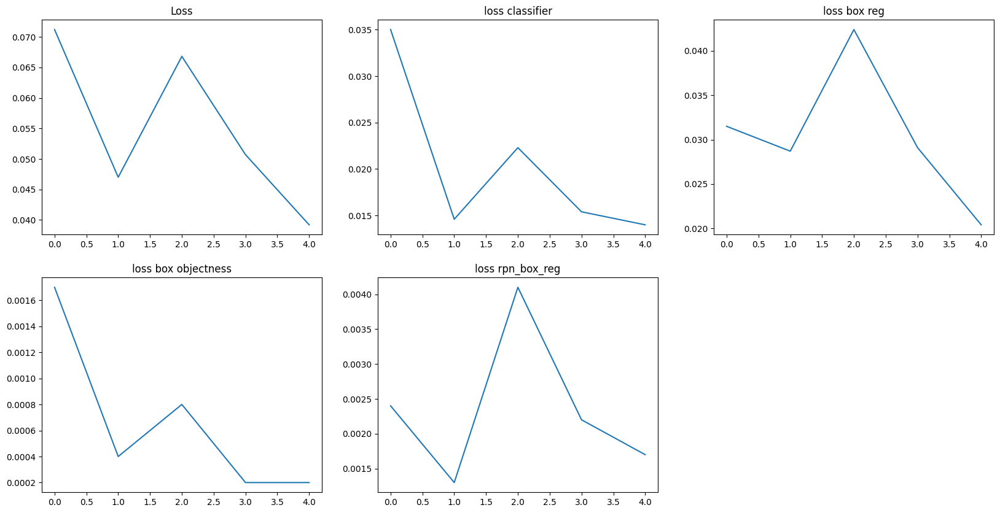

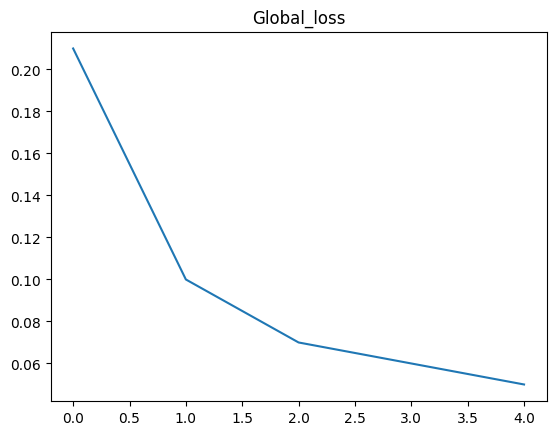

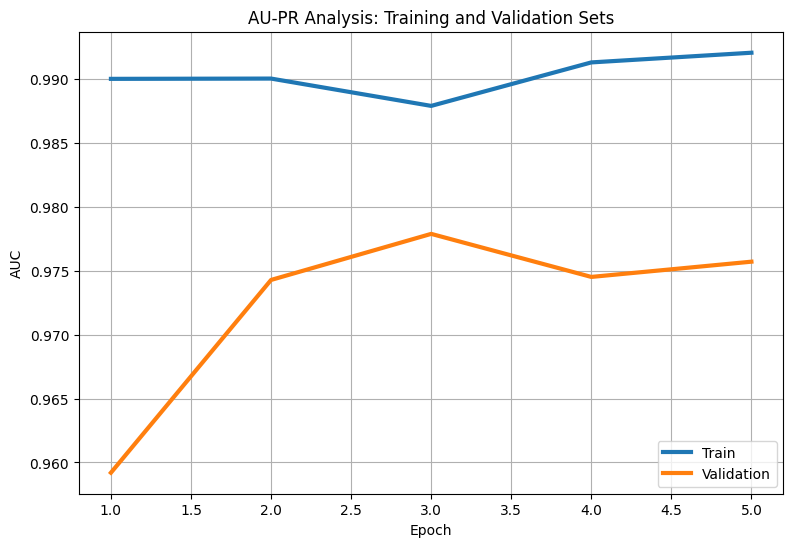

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:11  model_time: 0.2247 (0.2247)  evaluator_time: 0.0012 (0.0012)  time: 0.2395  data: 0.0127  max mem: 2784
Test:  [49/50]  eta: 0:00:00  model_time: 0.1372 (0.1405)  evaluator_time: 0.0010 (0.0013)  time: 0.1549  data: 0.0127  max mem: 2784
Test: Total time: 0:00:07 (0.1575 s / it)
Averaged stats: model_time: 0.1372 (0.1405)  evaluator_time: 0.0010 (0.0013)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.818
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.987
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.949
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.650
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.739
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.826
 Average Recall     (AR) @[ IoU=

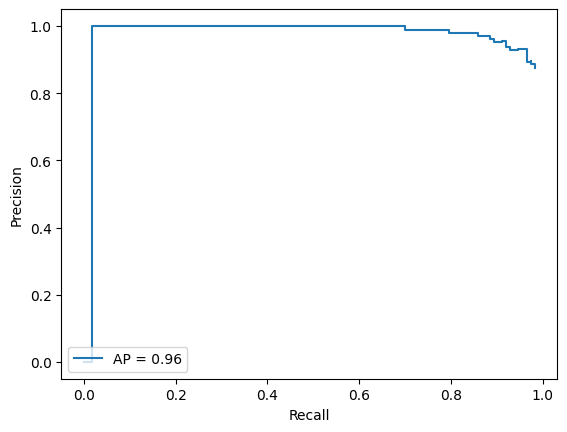

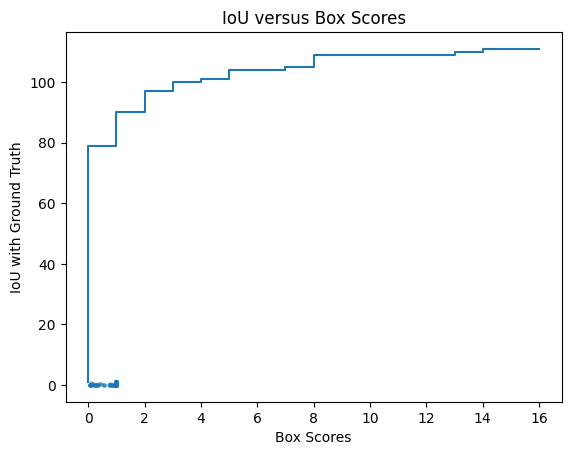

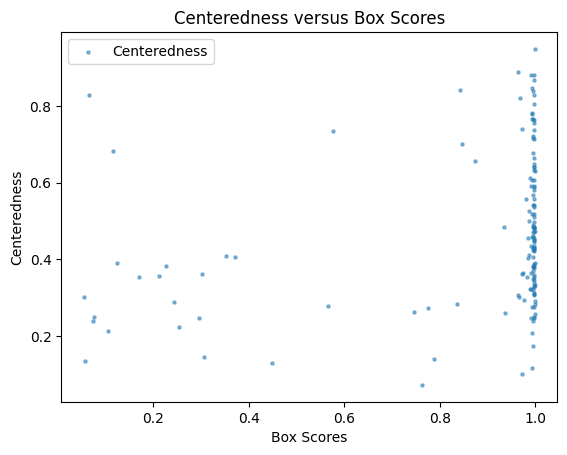

Time of training is 39.0 and the number of parameters for this model is 19748121:


In [ ]:
metrics = get_metric_collector(metric_collector_resnet50_fpnv2)
plot_metric_collector(metrics)

plt.plot(global_losses_resnet50_fpnv2)
plt.title("Global_loss")

plot_results(5,train_accs_resnet50_fpnv2, valid_accs_resnet50_fpnv2)
loaded_model = model_resnet50_fpnv2.eval()


precision_resnet50_fpnv2, recall_resnet50_fpnv2, average_precision_resnet50_fpnv2 = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.5)
print("Time of training is {} and the number of parameters for this model is {}:".format(time_resnet50_fpnv2, resnet50_fpnv2_parameters))

In [ ]:
model_mobilenet, train_accs_mobilenet, valid_accs_mobilenet,global_losses_mobilenet,metric_collector_mobilenet, time_mobilenet, mobilenet_parameters = main(model3)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:32  lr: 0.005000  loss: 1.9358 (1.9358)  loss_classifier: 0.7975 (0.7975)  loss_box_reg: 0.9778 (0.9778)  loss_objectness: 0.1320 (0.1320)  loss_rpn_box_reg: 0.0285 (0.0285)  time: 0.2744  data: 0.0228  max mem: 2784
Loss value after 10 batches is 1.01
Loss value after 20 batches is 0.8
Loss value after 30 batches is 0.69
Loss value after 40 batches is 0.6
Loss value after 50 batches is 0.55
Epoch: [0]  [ 50/120]  eta: 0:00:07  lr: 0.005000  loss: 0.3534 (0.5509)  loss_classifier: 0.1021 (0.1724)  loss_box_reg: 0.1757 (0.3078)  loss_objectness: 0.0131 (0.0397)  loss_rpn_box_reg: 0.0273 (0.0309)  time: 0.0879  data: 0.0141  max mem: 2784
Loss value after 60 batches is 0.51
Loss value after 70 batches is 0.49
Loss value after 80 batches is 0.46
Loss value after 90 batches is 0.45
Loss value after 100 batches is 0.44
Epoch: [0]  [100/120]  eta: 0:00:01  lr: 0.005000  loss: 0.3194 (0.4357)  loss_classifier: 0.0820 (0.1336)  loss_box_reg: 0.1687

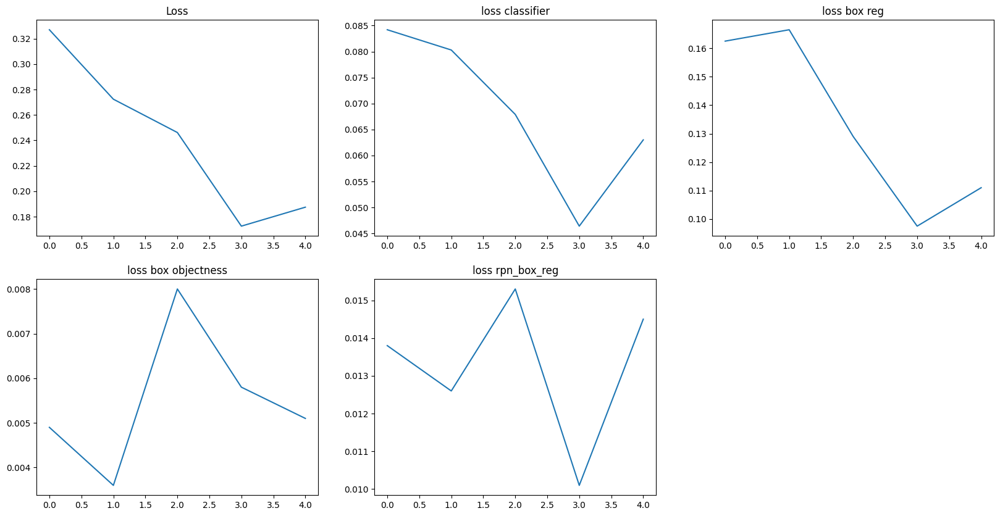

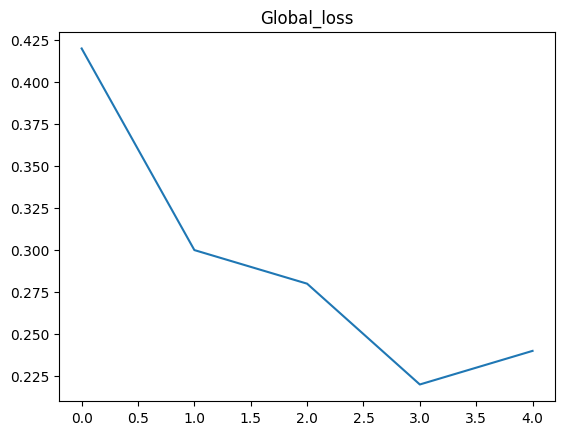

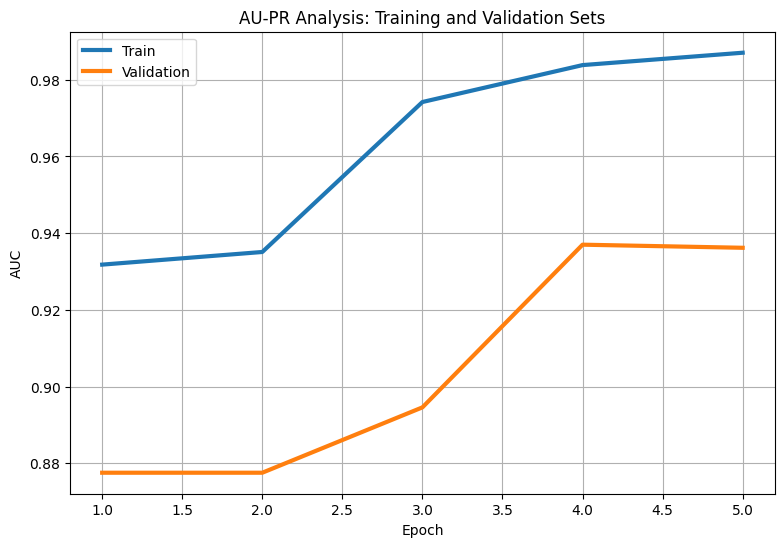

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:02  model_time: 0.0458 (0.0458)  evaluator_time: 0.0010 (0.0010)  time: 0.0595  data: 0.0119  max mem: 2784
Test:  [49/50]  eta: 0:00:00  model_time: 0.0511 (0.0495)  evaluator_time: 0.0012 (0.0012)  time: 0.0739  data: 0.0170  max mem: 2784
Test: Total time: 0:00:03 (0.0657 s / it)
Averaged stats: model_time: 0.0511 (0.0495)  evaluator_time: 0.0012 (0.0012)
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.777
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.956
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.918
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.801
 Average Recall     (AR) @[ IoU=

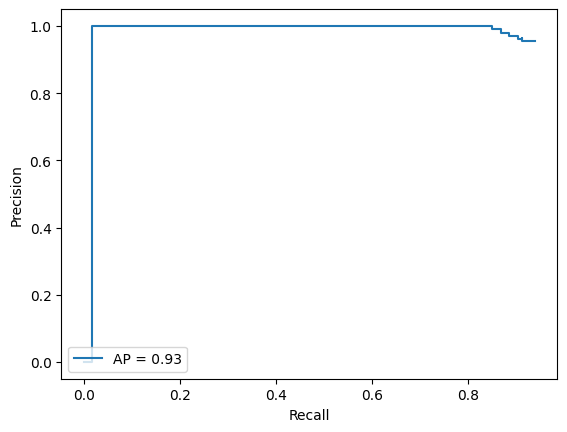

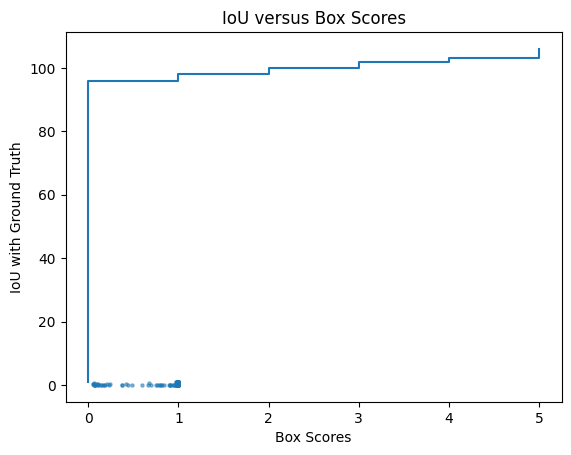

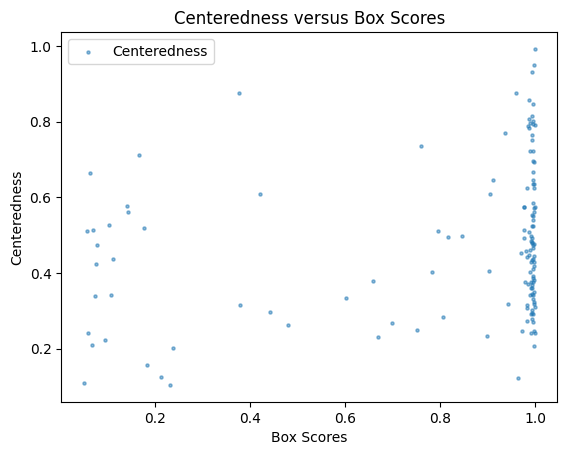

Time of training is 12.0 and the number of parameters for this model is 15982677


In [ ]:
metrics = get_metric_collector(metric_collector_mobilenet)
plot_metric_collector(metrics)
plt.plot(global_losses_mobilenet)
plt.title("Global_loss")

plot_results(5,train_accs_mobilenet, valid_accs_mobilenet)
loaded_model = model_mobilenet.eval()


precision_mobilenet, recall_mobilenet, average_precision_mobilenet = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.5)
print("Time of training is {} and the number of parameters for this model is {}".format(time_mobilenet, mobilenet_parameters))

In [ ]:
model_mobilenet320, train_accs_mobilenet320, valid_accs_mobilenet320,global_losses_mobilenet320,metric_collector_mobilenet320, time_mobilenet320, mobilenet_parameters320 = main(model4)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:15  lr: 0.005000  loss: 1.2641 (1.2641)  loss_classifier: 0.9195 (0.9195)  loss_box_reg: 0.2579 (0.2579)  loss_objectness: 0.0813 (0.0813)  loss_rpn_box_reg: 0.0055 (0.0055)  time: 0.1317  data: 0.0169  max mem: 2784
Loss value after 10 batches is 0.73
Loss value after 20 batches is 0.61
Loss value after 30 batches is 0.63
Loss value after 40 batches is 0.61
Loss value after 50 batches is 0.68
Epoch: [0]  [ 50/120]  eta: 0:00:06  lr: 0.005000  loss: 0.6438 (0.6909)  loss_classifier: 0.1562 (0.2044)  loss_box_reg: 0.4998 (0.4542)  loss_objectness: 0.0067 (0.0255)  loss_rpn_box_reg: 0.0058 (0.0069)  time: 0.0821  data: 0.0140  max mem: 2784
Loss value after 60 batches is 0.73
Loss value after 70 batches is 0.74
Loss value after 80 batches is 0.74
Loss value after 90 batches is 0.74
Loss value after 100 batches is 0.75
Epoch: [0]  [100/120]  eta: 0:00:01  lr: 0.005000  loss: 0.8293 (0.7516)  loss_classifier: 0.1557 (0.1928)  loss_box_reg: 0.55

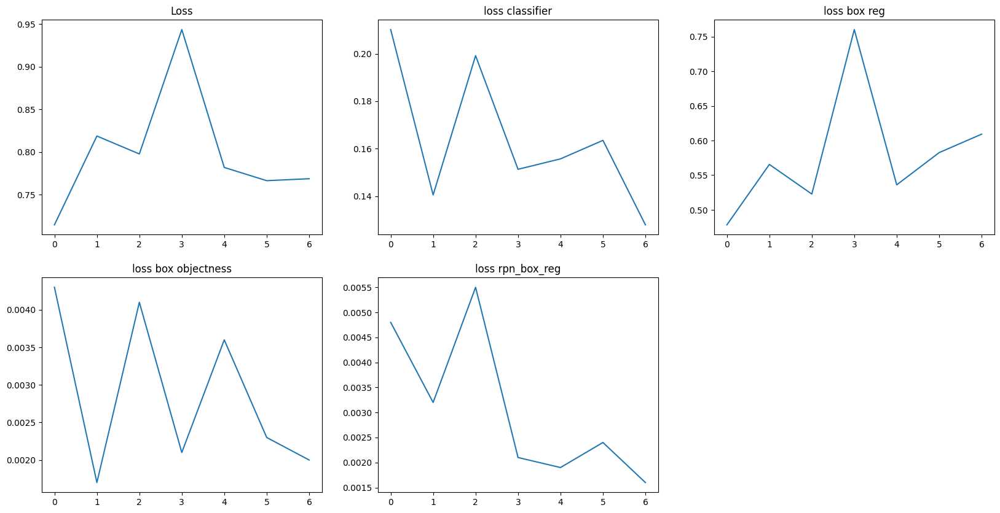

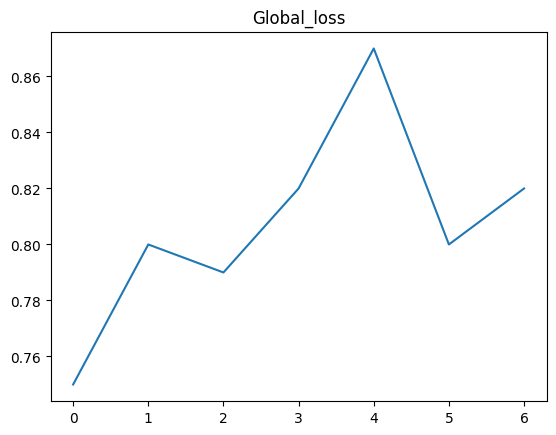

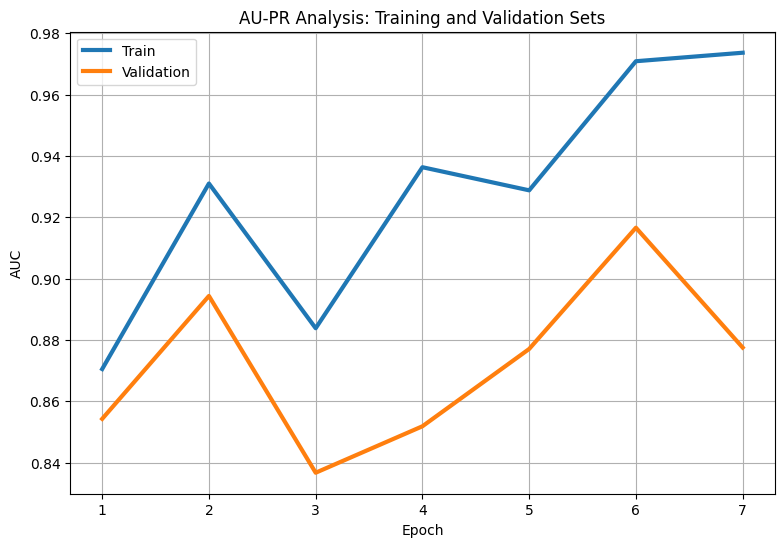

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:03  model_time: 0.0482 (0.0482)  evaluator_time: 0.0017 (0.0017)  time: 0.0731  data: 0.0222  max mem: 2784
Test:  [49/50]  eta: 0:00:00  model_time: 0.0445 (0.0470)  evaluator_time: 0.0010 (0.0010)  time: 0.0605  data: 0.0137  max mem: 2784
Test: Total time: 0:00:03 (0.0612 s / it)
Averaged stats: model_time: 0.0445 (0.0470)  evaluator_time: 0.0010 (0.0010)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.530
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.896
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.558
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.169
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.584
 Average Recall     (AR) @[ IoU=

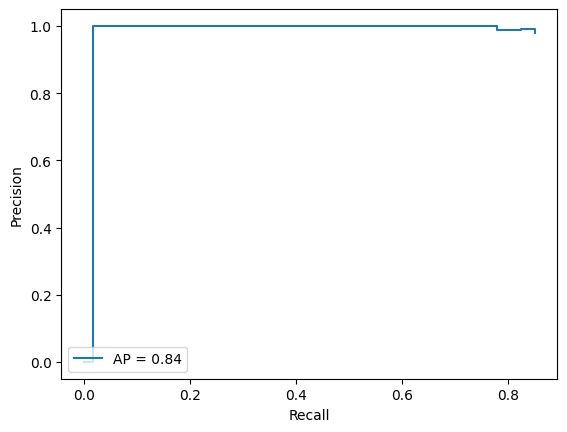

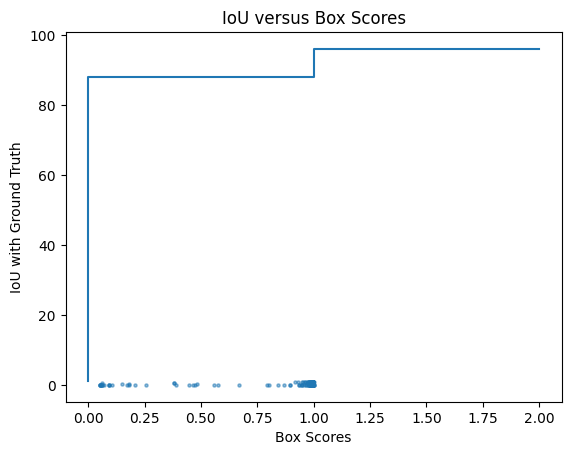

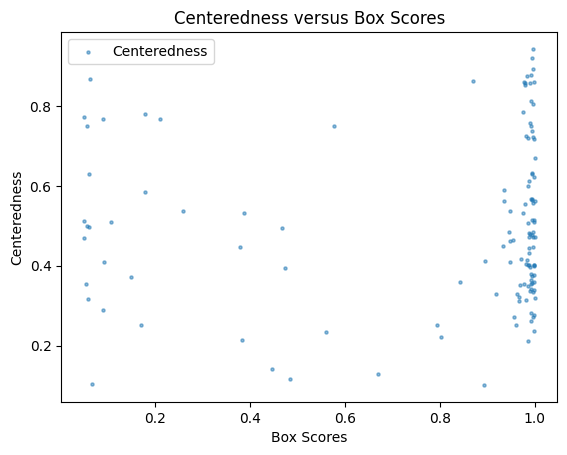

Time of training is 11.0s and the number of parameters for this model is 15982677


In [ ]:
metrics = get_metric_collector(metric_collector_mobilenet320)
plot_metric_collector(metrics)
plt.plot(global_losses_mobilenet320)
plt.title("Global_loss")

plot_results(7,train_accs_mobilenet320, valid_accs_mobilenet320)
loaded_model = model_mobilenet320.eval()


precision_mobilenet320, recall_mobilenet320, average_precision_mobilenet320 = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.75)
print("Time of training is {}s and the number of parameters for this model is {}".format(time_mobilenet320, mobilenet_parameters320 ))

In [ ]:
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(weights="DEFAULT").features
# ``FasterRCNN`` needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280

# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios
anchor_generator = AnchorGenerator(
    sizes=((32, 64, 128, 256, 512),),
    aspect_ratios=((0.5, 1.0, 2.0),)
)

# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be [0]. More generally, the backbone should return an
# ``OrderedDict[Tensor]``, and in ``featmap_names`` you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(
    featmap_names=['0'],
    output_size=7,
    sampling_ratio=2
)

# put the pieces together inside a Faster-RCNN model
modelv2 = FasterRCNN(
    backbone,
    num_classes=2,
    rpn_anchor_generator=anchor_generator,
    box_roi_pool=roi_pooler
)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 101MB/s] 


In [ ]:
model_mobilenetv2, train_accs_mobilenetv2, valid_accs_mobilenetv2,global_losses_mobilenetv2,metric_collector_mobilenetv2, time_mobilenetv2, mobilenetv2_parameters= main(modelv2)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:31  lr: 0.005000  loss: 0.5221 (0.5221)  loss_classifier: 0.1677 (0.1677)  loss_box_reg: 0.1986 (0.1986)  loss_objectness: 0.1243 (0.1243)  loss_rpn_box_reg: 0.0315 (0.0315)  time: 0.2608  data: 0.0153  max mem: 4764
Loss value after 10 batches is 0.43
Loss value after 20 batches is 0.41
Loss value after 30 batches is 0.46
Loss value after 40 batches is 0.44
Loss value after 50 batches is 0.44
Epoch: [0]  [ 50/120]  eta: 0:00:13  lr: 0.005000  loss: 0.3463 (0.4372)  loss_classifier: 0.1139 (0.1330)  loss_box_reg: 0.1480 (0.1837)  loss_objectness: 0.0686 (0.0907)  loss_rpn_box_reg: 0.0201 (0.0298)  time: 0.1929  data: 0.0173  max mem: 5083
Loss value after 60 batches is 0.43
Loss value after 70 batches is 0.41
Loss value after 80 batches is 0.41
Loss value after 90 batches is 0.4
Loss value after 100 batches is 0.4
Epoch: [0]  [100/120]  eta: 0:00:03  lr: 0.005000  loss: 0.3235 (0.4021)  loss_classifier: 0.0996 (0.1207)  loss_box_reg: 0.1430

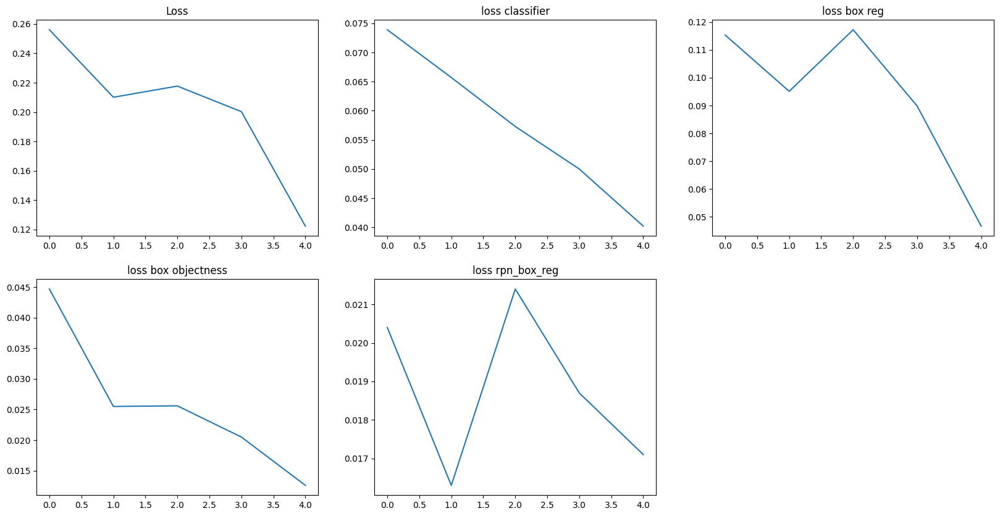

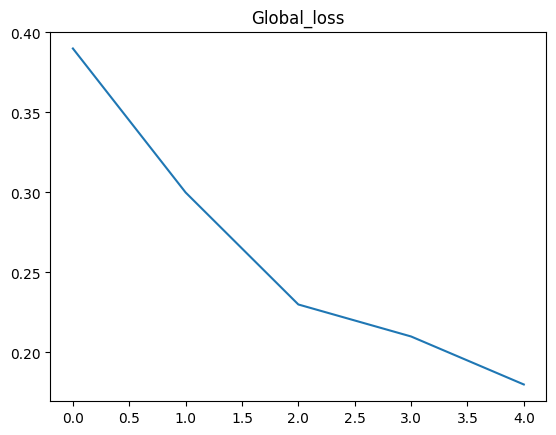

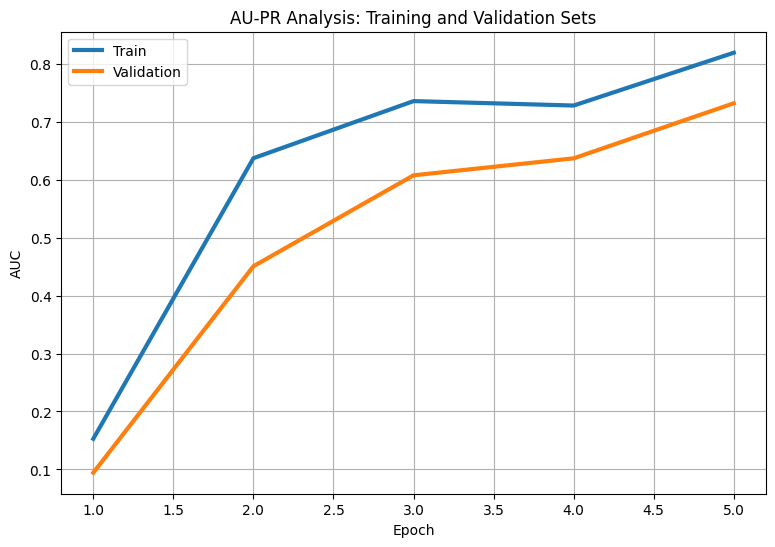

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:04  model_time: 0.0776 (0.0776)  evaluator_time: 0.0012 (0.0012)  time: 0.0935  data: 0.0138  max mem: 5083
Test:  [49/50]  eta: 0:00:00  model_time: 0.0527 (0.0561)  evaluator_time: 0.0012 (0.0013)  time: 0.0700  data: 0.0140  max mem: 5083
Test: Total time: 0:00:03 (0.0721 s / it)
Averaged stats: model_time: 0.0527 (0.0561)  evaluator_time: 0.0012 (0.0013)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.369
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.801
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.239
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.130
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.405
 Average Recall     (AR) @[ IoU=

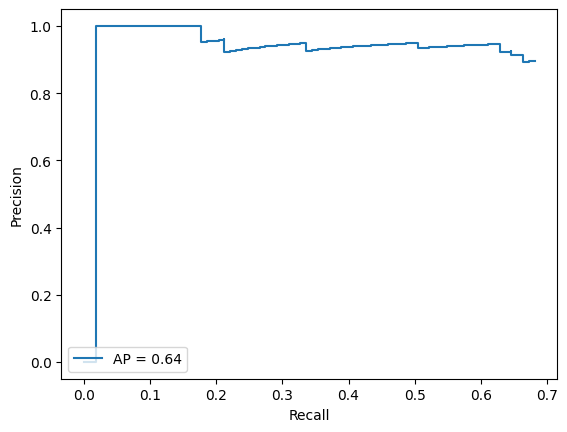

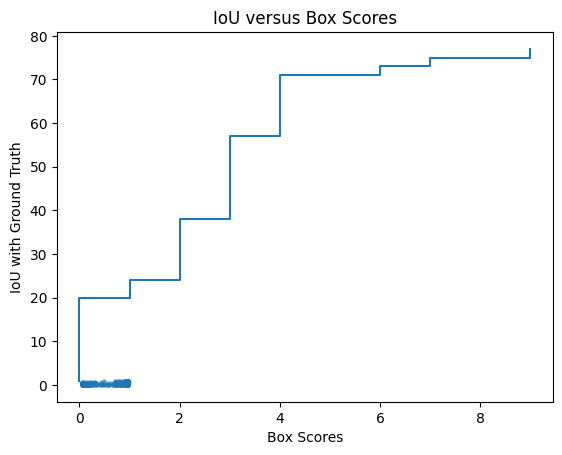

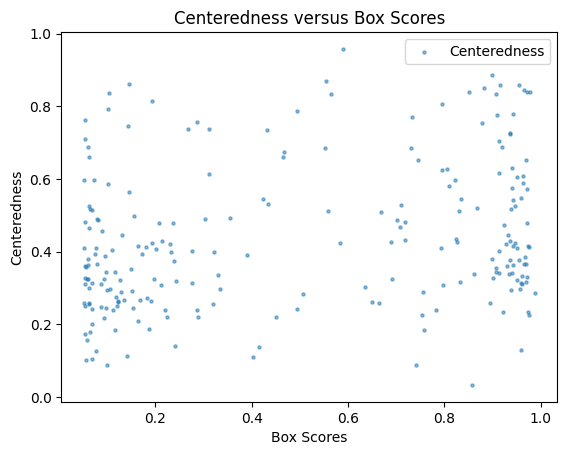

Time of training is 29.0s and the number of parameters for this model is 82352981


In [ ]:
metrics = get_metric_collector(metric_collector_mobilenetv2)
plot_metric_collector(metrics)
plt.plot(global_losses_mobilenetv2)
plt.title("Global_loss")

plot_results(5,train_accs_mobilenetv2, valid_accs_mobilenetv2)
loaded_model = model_mobilenetv2.eval()


precision_mobilenetv2, recall_mobilenetv2, average_precision_mobilenetv2 = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.75)
print("Time of training is {}s and the number of parameters for this model is {}".format(time_mobilenetv2, mobilenetv2_parameters))

In [ ]:
model5 = fcos_resnet50_fpn(weights=FCOS_ResNet50_FPN_Weights.DEFAULT, pretrained=True)
model_FCOS, train_accs_FCOS, valid_accs_FCOS,global_losses_FCOS,metric_collector_FCOS, time_FCOS, FCOS_parameters= main(model5)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:01:36  lr: 0.005000  loss: 1.2663 (1.2663)  classification: 0.4553 (0.4553)  bbox_regression: 0.1867 (0.1867)  bbox_ctrness: 0.6243 (0.6243)  time: 0.8007  data: 0.0216  max mem: 5083
Loss value after 10 batches is 1.09
Loss value after 20 batches is 1.22
Loss value after 30 batches is 1.21
Loss value after 40 batches is 1.17
Loss value after 50 batches is 1.14
Epoch: [0]  [ 50/120]  eta: 0:00:22  lr: 0.005000  loss: 1.0289 (1.1393)  classification: 0.1233 (0.2081)  bbox_regression: 0.2669 (0.2831)  bbox_ctrness: 0.6394 (0.6481)  time: 0.3176  data: 0.0164  max mem: 5083
Loss value after 60 batches is 1.11
Loss value after 70 batches is 1.11
Loss value after 80 batches is 1.1
Loss value after 90 batches is 1.09
Loss value after 100 batches is 1.07
Epoch: [0]  [100/120]  eta: 0:00:06  lr: 0.005000  loss: 1.0000 (1.0752)  classification: 0.1387 (0.1888)  bbox_regression: 0.2030 (0.2448)  bbox_ctrness: 0.6326 (0.6416)  time: 0.2973  data: 0.0159 

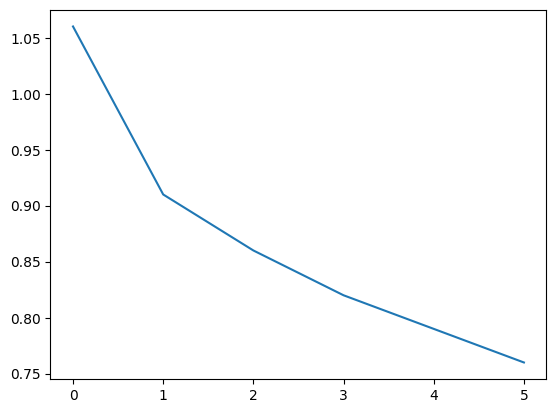

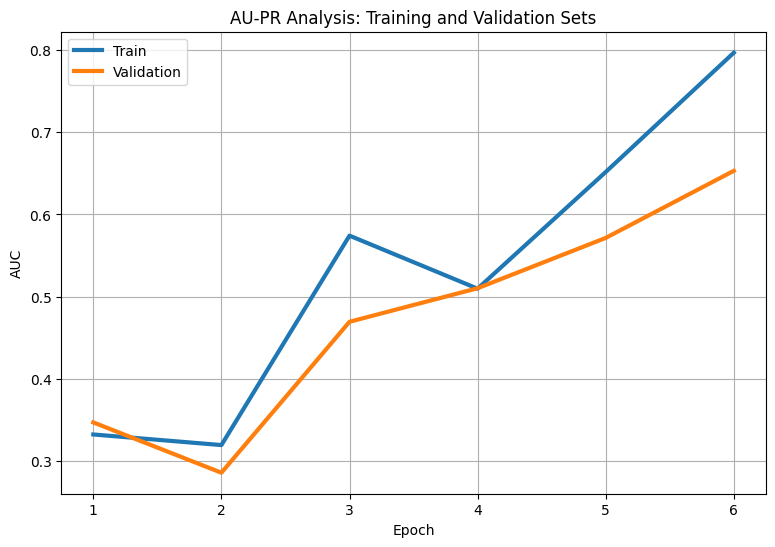

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:09  model_time: 0.1534 (0.1534)  evaluator_time: 0.0025 (0.0025)  time: 0.1827  data: 0.0258  max mem: 5083
Test:  [49/50]  eta: 0:00:00  model_time: 0.0967 (0.1231)  evaluator_time: 0.0011 (0.0016)  time: 0.1132  data: 0.0125  max mem: 5083
Test: Total time: 0:00:07 (0.1411 s / it)
Averaged stats: model_time: 0.0967 (0.1231)  evaluator_time: 0.0011 (0.0016)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.706
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.978
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.806
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.525
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.607
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.723
 Average Recall     (AR) @[ IoU=

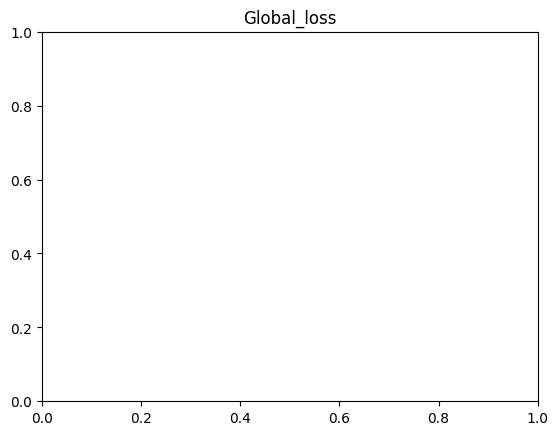

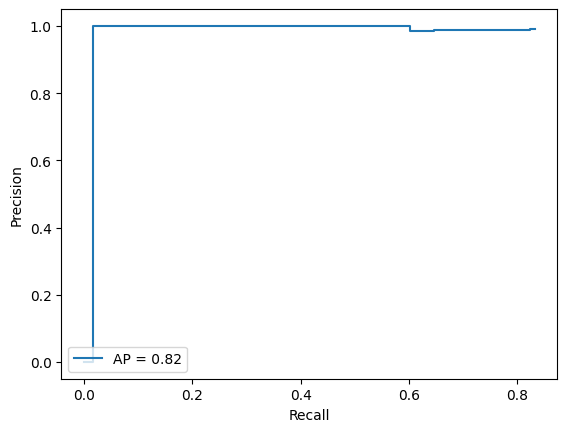

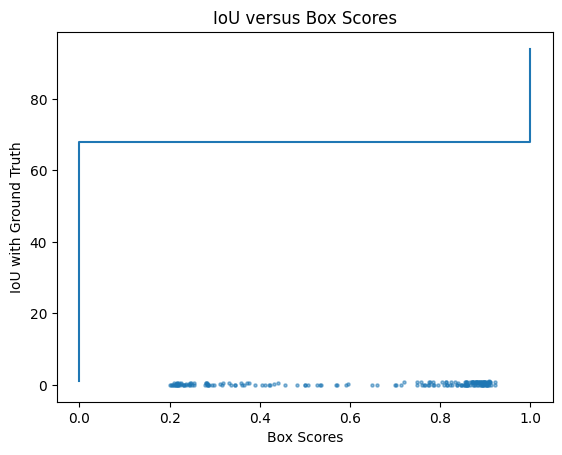

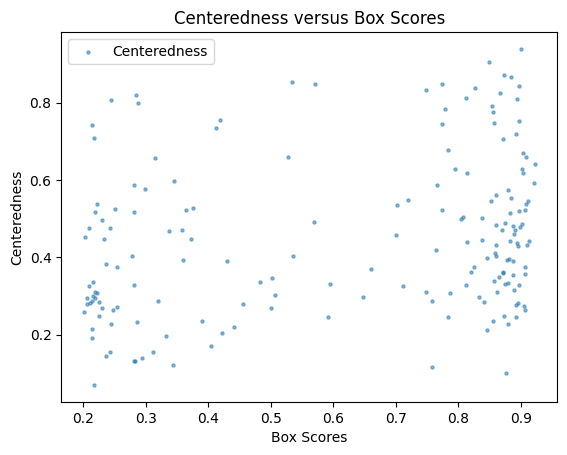

Time of training is 42.0s and the number of parameters for this model is 32047200


In [ ]:
#metrics = get_metric_collector(metric_collector_FCOS)
#plot_metric_collector(metrics)
plt.plot(global_losses_FCOS)
plot_results(6,train_accs_FCOS, valid_accs_FCOS)
plt.title("Global_loss")

loaded_model = model_FCOS.eval()

precision_FCOS, recall_FCOS, average_precision_FCOS = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.75)
print("Time of training is {}s and the number of parameters for this model is {}".format(time_FCOS, FCOS_parameters ))

In [ ]:
model_RET, train_accs_RET, valid_accs_RET,global_losses_RET,metric_collector_RET, time_RET, RET_parameters= main(model6)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:34  lr: 0.005000  loss: 0.8806 (0.8806)  classification: 0.6457 (0.6457)  bbox_regression: 0.2349 (0.2349)  time: 0.2876  data: 0.0153  max mem: 5083
Loss value after 10 batches is 0.59
Loss value after 20 batches is 0.67
Loss value after 30 batches is 0.63
Loss value after 40 batches is 0.6
Loss value after 50 batches is 0.58
Epoch: [0]  [ 50/120]  eta: 0:00:18  lr: 0.005000  loss: 0.5138 (0.5710)  classification: 0.2759 (0.3846)  bbox_regression: 0.1881 (0.1864)  time: 0.2596  data: 0.0173  max mem: 5083
Loss value after 60 batches is 0.55
Loss value after 70 batches is 0.54
Loss value after 80 batches is 0.51
Loss value after 90 batches is 0.49
Loss value after 100 batches is 0.46
Epoch: [0]  [100/120]  eta: 0:00:05  lr: 0.005000  loss: 0.2784 (0.4624)  classification: 0.0882 (0.2752)  bbox_regression: 0.1716 (0.1872)  time: 0.2676  data: 0.0175  max mem: 5083
Loss value after 110 batches is 0.45
Loss value after 120 batches is 0.46
Epoc

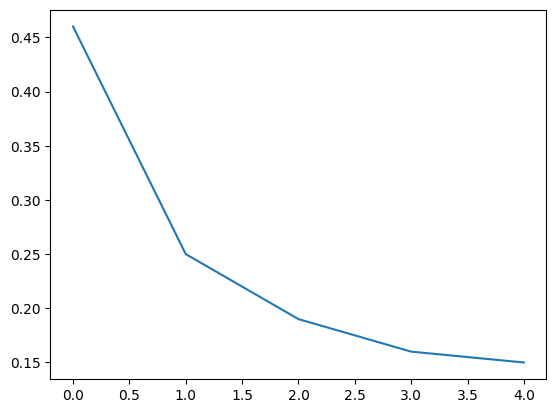

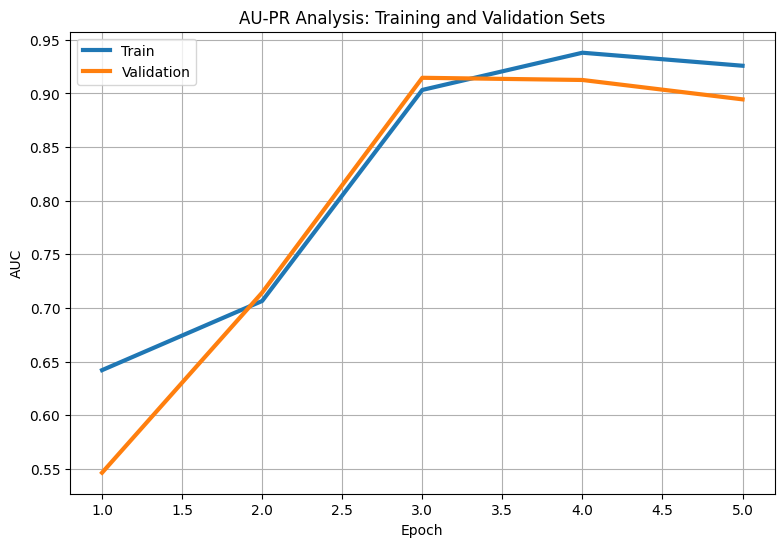

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:10  model_time: 0.1912 (0.1912)  evaluator_time: 0.0014 (0.0014)  time: 0.2060  data: 0.0126  max mem: 5083
Test:  [49/50]  eta: 0:00:00  model_time: 0.1175 (0.1103)  evaluator_time: 0.0016 (0.0016)  time: 0.1377  data: 0.0177  max mem: 5083
Test: Total time: 0:00:06 (0.1276 s / it)
Averaged stats: model_time: 0.1175 (0.1103)  evaluator_time: 0.0016 (0.0016)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.683
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.984
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.810
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.401
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.666
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.698
 Average Recall     (AR) @[ IoU=

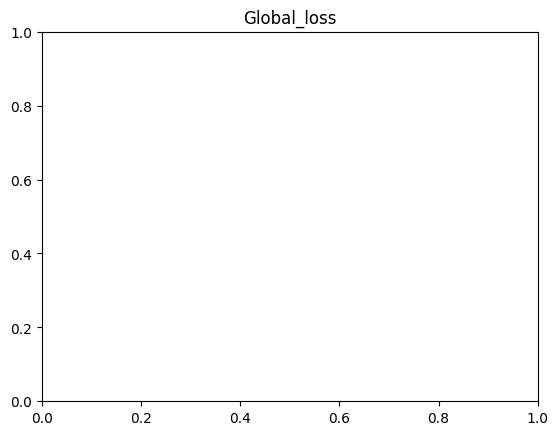

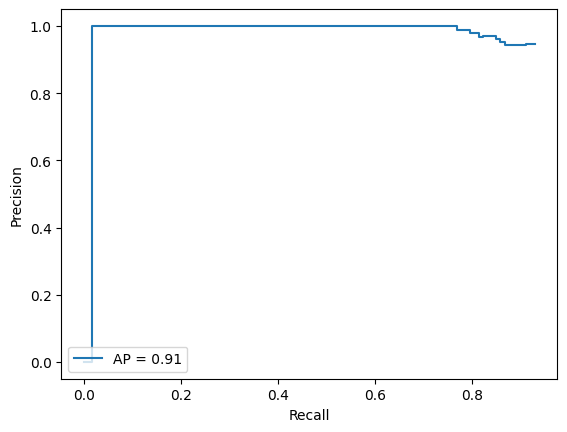

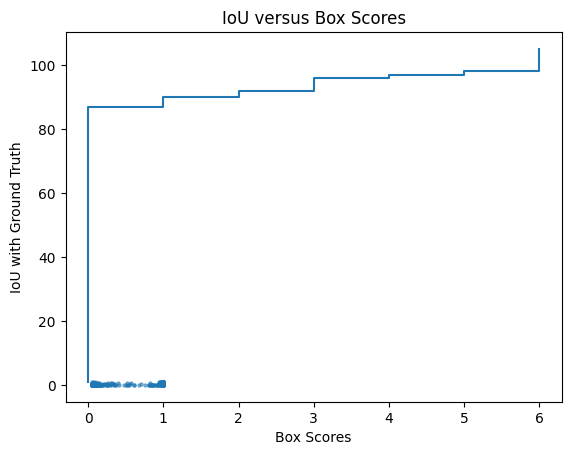

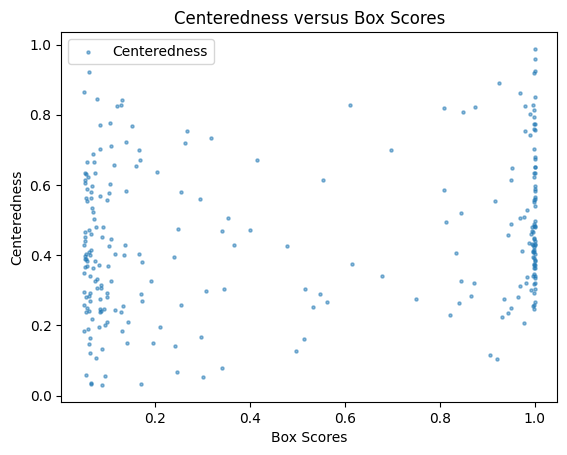

Time of training is 38.0 and the number of parameters for this model is 10560087:


In [ ]:
#metrics = get_metric_collector(metric_collector_RET)
#lot_metric_collector(metrics)
plt.plot(global_losses_RET)
plot_results(5,train_accs_RET, valid_accs_RET)
plt.title("Global_loss")

loaded_model = model_RET.eval()

precision_RET, recall_RET, average_precision_RET = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.75)
print("Time of training is {} and the number of parameters for this model is {}:".format(time_RET, RET_parameters))

In [ ]:
model_RETV2, train_accs_RETV2, valid_accs_RETV2,global_losses_RETV2,metric_collector_RETV2, time_RETV2, RETV2_parameters= main(model7)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:34  lr: 0.005000  loss: 0.6420 (0.6420)  classification: 0.3916 (0.3916)  bbox_regression: 0.2503 (0.2503)  time: 0.2850  data: 0.0165  max mem: 5083
Loss value after 10 batches is 0.5
Loss value after 20 batches is 0.41
Loss value after 30 batches is 0.37
Loss value after 40 batches is 0.34
Loss value after 50 batches is 0.33
Epoch: [0]  [ 50/120]  eta: 0:00:19  lr: 0.005000  loss: 0.2087 (0.3232)  classification: 0.0845 (0.1693)  bbox_regression: 0.1362 (0.1539)  time: 0.2597  data: 0.0144  max mem: 5083
Loss value after 60 batches is 0.31
Loss value after 70 batches is 0.3
Loss value after 80 batches is 0.29
Loss value after 90 batches is 0.28
Loss value after 100 batches is 0.27
Epoch: [0]  [100/120]  eta: 0:00:05  lr: 0.005000  loss: 0.2158 (0.2736)  classification: 0.0572 (0.1254)  bbox_regression: 0.1260 (0.1482)  time: 0.2713  data: 0.0155  max mem: 5083
Loss value after 110 batches is 0.28
Loss value after 120 batches is 0.27
Epoch

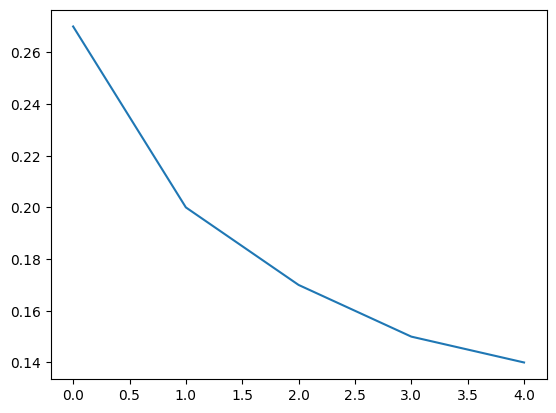

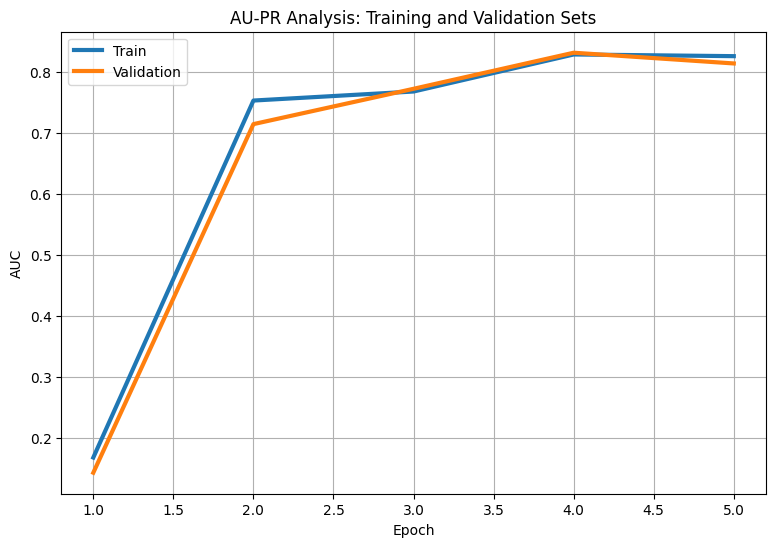

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:09  model_time: 0.1795 (0.1795)  evaluator_time: 0.0022 (0.0022)  time: 0.1998  data: 0.0174  max mem: 3672
Test:  [49/50]  eta: 0:00:00  model_time: 0.0948 (0.1030)  evaluator_time: 0.0011 (0.0017)  time: 0.1141  data: 0.0122  max mem: 3672
Test: Total time: 0:00:05 (0.1198 s / it)
Averaged stats: model_time: 0.0948 (0.1030)  evaluator_time: 0.0011 (0.0017)
Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.753
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.972
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.880
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.500
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.637
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.770
 Average Recall     (AR) @[ IoU=

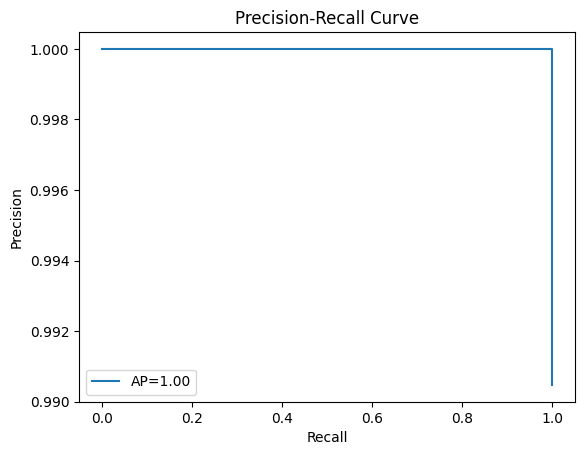

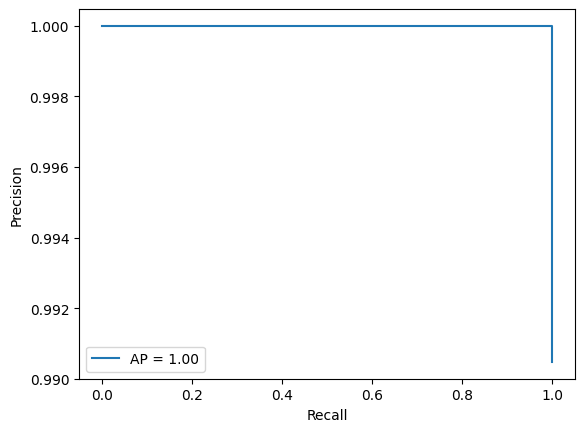

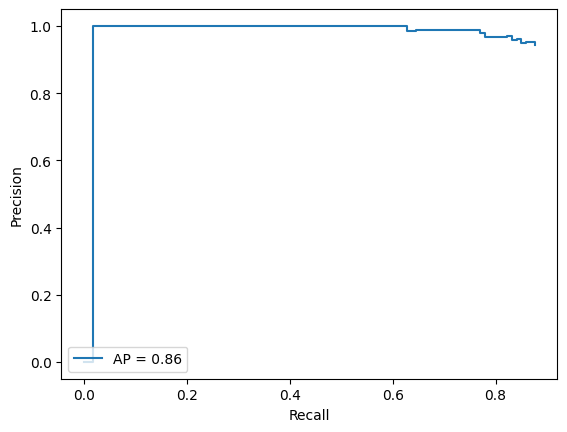

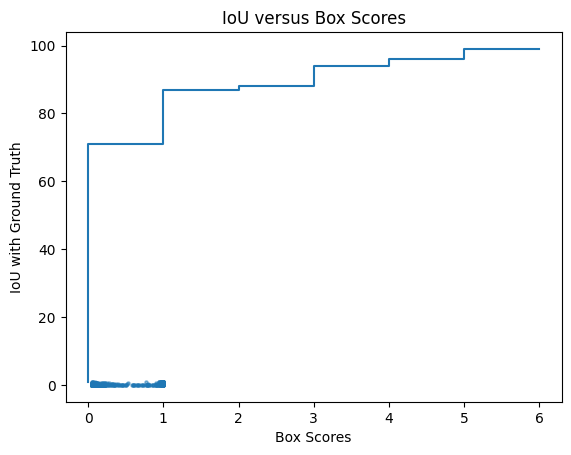

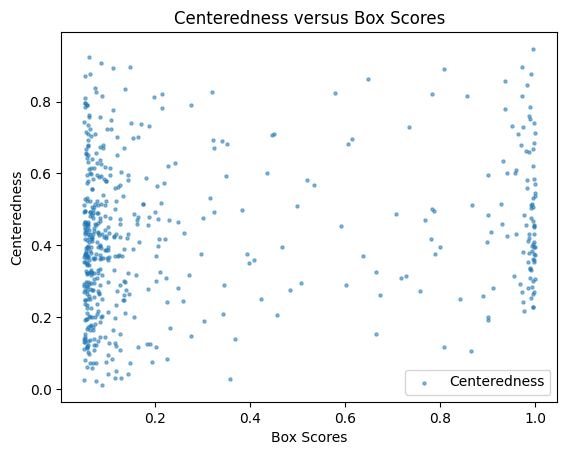

Time of training is 35.0 and the number of parameters for this model is 14690903:


In [ ]:
#metrics = get_metric_collector(metric_collector_RETV2)
#plot_metric_collector(metrics)
plt.plot(global_losses_RETV2)
plot_results(5,train_accs_RETV2, valid_accs_RETV2)
plt.title("Global_loss")

loaded_model = model_RETV2.eval()

precision_RETV2, recall_RETV2, average_precision_RETV2 = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.75)
print("Time of training is {} and the number of parameters for this model is {}:".format(time_RETV2, RETV2_parameters))

In [ ]:
model_maskR, train_accs_maskR, valid_accs_maskR,global_losses_maskR,metric_collector_maskR, time_maskR, maskR_parameters= main(model10)

epoch 0/10..
Epoch: [0]  [  0/120]  eta: 0:00:44  lr: 0.005000  loss: 2.8904 (2.8904)  loss_classifier: 0.7591 (0.7591)  loss_box_reg: 0.4412 (0.4412)  loss_mask: 1.6601 (1.6601)  loss_objectness: 0.0154 (0.0154)  loss_rpn_box_reg: 0.0146 (0.0146)  time: 0.3748  data: 0.0284  max mem: 2044
Loss value after 10 batches is 1.06
Loss value after 20 batches is 0.82
Loss value after 30 batches is 0.73
Loss value after 40 batches is 0.64
Loss value after 50 batches is 0.58
Epoch: [0]  [ 50/120]  eta: 0:00:20  lr: 0.005000  loss: 0.3838 (0.5770)  loss_classifier: 0.0460 (0.0968)  loss_box_reg: 0.0979 (0.1799)  loss_mask: 0.1898 (0.2833)  loss_objectness: 0.0012 (0.0083)  loss_rpn_box_reg: 0.0046 (0.0088)  time: 0.3010  data: 0.0254  max mem: 2450
Loss value after 60 batches is 0.58
Loss value after 70 batches is 0.58
Loss value after 80 batches is 0.57
Loss value after 90 batches is 0.55
Loss value after 100 batches is 0.53
Epoch: [0]  [100/120]  eta: 0:00:05  lr: 0.005000  loss: 0.4340 (0.530

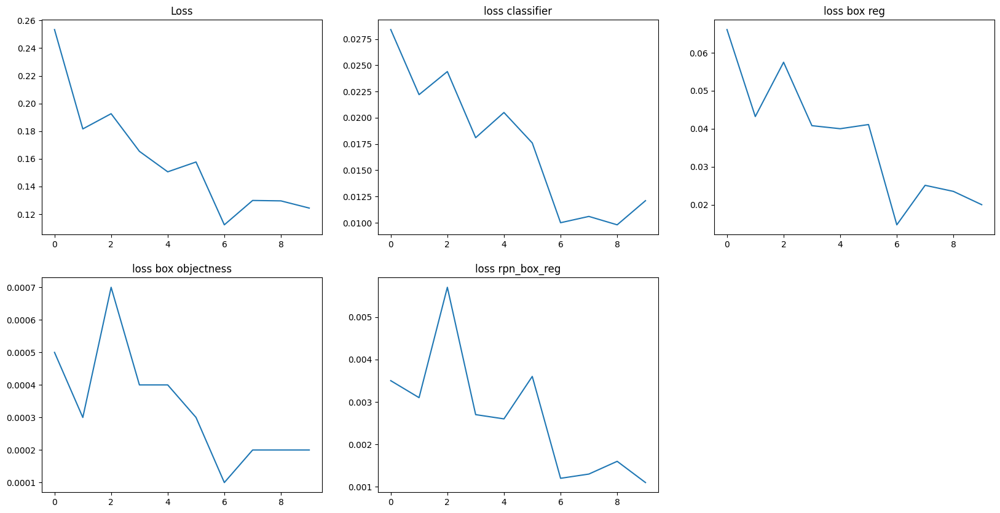

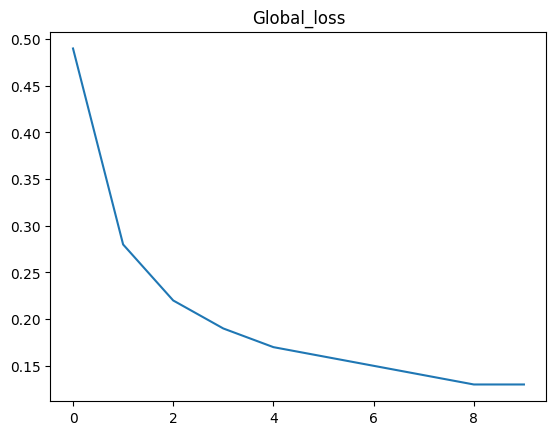

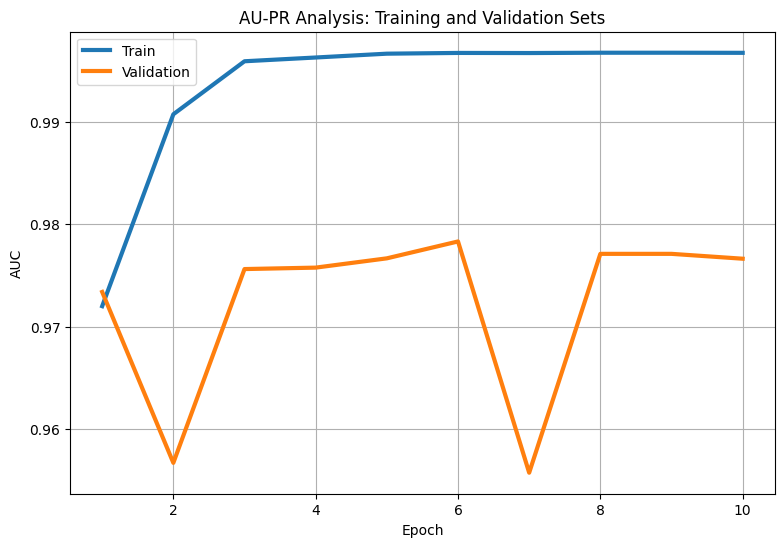

creating index...
index created!
Test:  [ 0/50]  eta: 0:00:07  model_time: 0.1420 (0.1420)  evaluator_time: 0.0021 (0.0021)  time: 0.1537  data: 0.0089  max mem: 5083
Test:  [49/50]  eta: 0:00:00  model_time: 0.1351 (0.1249)  evaluator_time: 0.0060 (0.0062)  time: 0.1795  data: 0.0240  max mem: 5083
Test: Total time: 0:00:07 (0.1498 s / it)
Averaged stats: model_time: 0.1351 (0.1249)  evaluator_time: 0.0060 (0.0062)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.03s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.808
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.985
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.908
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.353
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.700
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | max

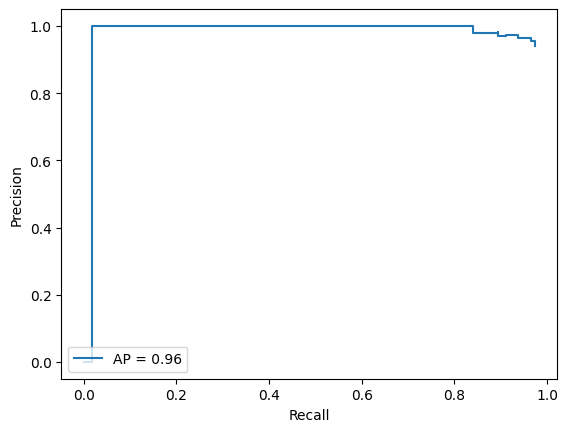

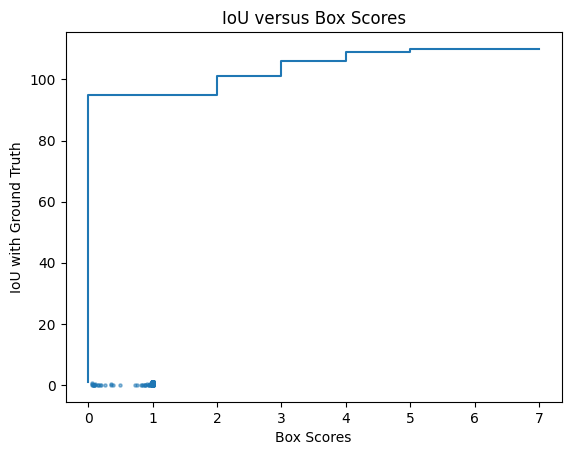

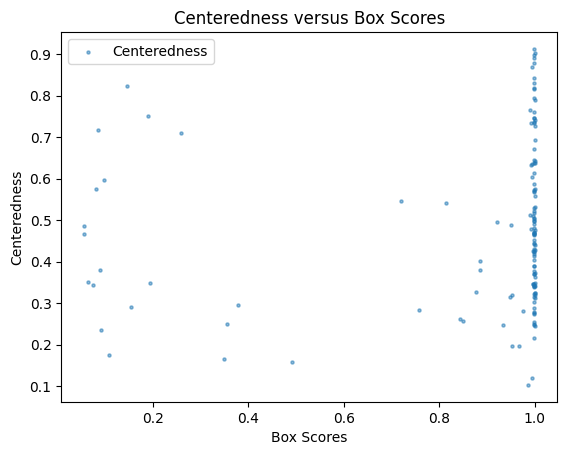

Time of training is 39.0 and the number of parameters for this model is 43699995:


In [ ]:
metrics = get_metric_collector(metric_collector_maskR)
plot_metric_collector(metrics)
plt.plot(global_losses_maskR)
plt.title("Global_loss")
plot_results(10,train_accs_maskR, valid_accs_maskR)


loaded_model = model_maskR.eval()

precision_maskR, recall_maskR, average_precision_maskR = evaluate_confidence(loaded_model, test_loader, device, score_confidence =0.75)
print("Time of training is {} and the number of parameters for this model is {}:".format(time_maskR, maskR_parameters))

In [ ]:
pip install timm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 10.2 MB/s eta 0:00:00


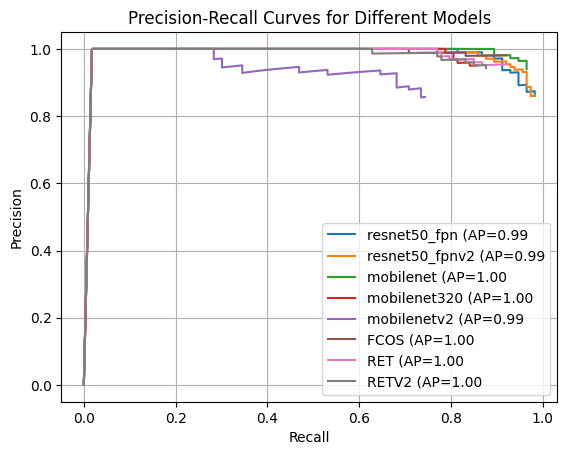

In [ ]:
import matplotlib.pyplot as plt


# Example data (replace with your actual data)
models = ['resnet50_fpn', 'resnet50_fpnv2', 'mobilenet', 'mobilenet320', 'mobilenetv2', 'FCOS', 'RET', 'RETV2']
precision_values = [precision_resnet50_fpn,precision_resnet50_fpnv2,precision_mobilenet,precision_mobilenet320,precision_mobilenetv2,precision_FCOS,precision_RET,precision_RETV2]  # Replace with precision values for each model (list of lists)
recall_values = [recall_resnet50_fpn,recall_resnet50_fpnv2,recall_mobilenet,recall_mobilenet320,recall_mobilenetv2,recall_FCOS,recall_RET,recall_RETV2]   # Replace with recall values for each model (list of lists)
ap_values = [average_precision_resnet50_fpn,average_precision_resnet50_fpnv2,average_precision_mobilenet,average_precision_mobilenet320,average_precision_mobilenetv2,average_precision_FCOS,average_precision_RET,average_precision_RETV2]

# Plot precision-recall curves for all models together
for i, model in enumerate(models):
    plt.plot( recall_values[i],precision_values[i], label=f'{model} (AP={ap_values[i]:.2f}')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves for Different Models')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()




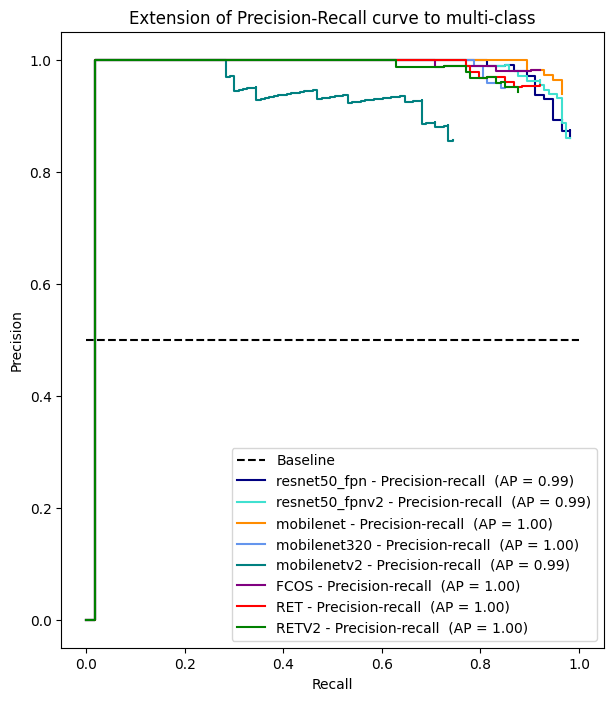

In [ ]:
from itertools import cycle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import PrecisionRecallDisplay, auc

# Your variables
models = ['resnet50_fpn', 'resnet50_fpnv2', 'mobilenet', 'mobilenet320', 'mobilenetv2', 'FCOS', 'RET', 'RETV2']
precision_values = [precision_resnet50_fpn, precision_resnet50_fpnv2, precision_mobilenet, precision_mobilenet320, precision_mobilenetv2, precision_FCOS, precision_RET, precision_RETV2]
recall_values = [recall_resnet50_fpn, recall_resnet50_fpnv2, recall_mobilenet, recall_mobilenet320, recall_mobilenetv2, recall_FCOS, recall_RET, recall_RETV2]
ap_values = [average_precision_resnet50_fpn, average_precision_resnet50_fpnv2, average_precision_mobilenet, average_precision_mobilenet320, average_precision_mobilenetv2, average_precision_FCOS, average_precision_RET, average_precision_RETV2]

# Extend the color cycle for more models
colors = cycle(["navy", "turquoise", "darkorange", "cornflowerblue", "teal", "purple", "red", "green", "yellow"])

_, ax = plt.subplots(figsize=(7, 8))

f_scores = np.linspace(0.2, 0.8, num=4)
lines, labels = [], []

# Plot baseline precision-recall curve
baseline_recall = np.linspace(0, 1, 100)
baseline_precision = np.ones_like(baseline_recall) * np.mean(baseline_recall)  # Assumes uniform precision
ax.plot(baseline_recall, baseline_precision, linestyle="--", color="black", label="Baseline")

for model, precision, recall, ap, color in zip(models, precision_values, recall_values, ap_values, colors):

    # Plot precision-recall curve
    display = PrecisionRecallDisplay(
        recall=recall,
        precision=precision,
        average_precision=ap,
    )
    display.plot(ax=ax, name=f"{model} - Precision-recall ", color=color)

# add the legend for the iso-f1 curves
handles, labels = display.ax_.get_legend_handles_labels()
# set the legend and the axes
ax.legend(handles=handles, labels=labels, loc="best")
ax.set_title("Extension of Precision-Recall curve to multi-class")

plt.show()


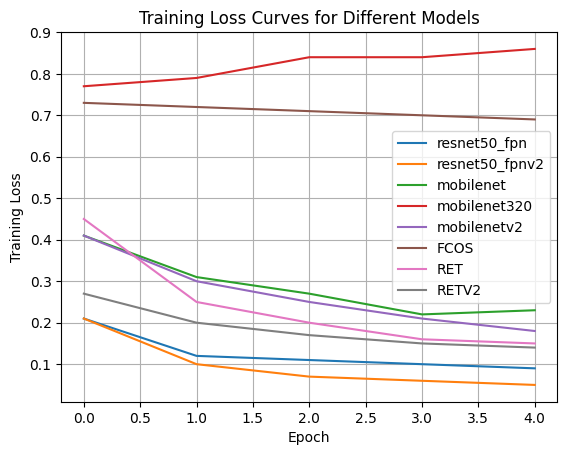

In [ ]:
import matplotlib.pyplot as plt

# Example data (replace with your actual data)
models = ['resnet50_fpn', 'resnet50_fpnv2', 'mobilenet', 'mobilenet320', 'mobilenetv2', 'FCOS','RET', 'RETV2']
training_loss_values = [global_losses_resnet50_fpn,global_losses_resnet50_fpnv2,global_losses_mobilenet,global_losses_mobilenet320,global_losses_mobilenetv2,global_losses_FCOS,global_losses_RET,global_losses_RETV2]  # Replace with recall values for each model (list of lists)

 # Replace with training loss values for each model (list of lists)

# Plot loss curves for all models together
for i, model in enumerate(models):
    plt.plot(training_loss_values[i], label=model)

# Customize the plot
plt.xlabel('Epoch')
plt.ylabel('Training Loss')
plt.title('Training Loss Curves for Different Models')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()




| Model Name           | Backbone Name                  | Number of Parameters | Training Time | AP@[0.50:0.95] | AP@[0.50] | AP@[0.75] | AP@[small] | AP@[medium] | AP@[large] | AR@[1] | AR@[10] | AR@[100] | AR@[small] | AR@[medium] | AR@[large] |
|----------------------|--------------------------------|----------------------|---------------|----------------|-----------|-----------|------------|-------------|------------|--------|---------|----------|-----------|------------|------------|
| FasterRCNN Model 1   | ResNet50 FPN                   | 17844249            | 25 s     | 0.784       | 0.990 | 0.923 | 0.525   | 0.717    | 0.799   | 0.385 | 0.823 | 0.823 | 0.550  | 0.769   | 0.836   |
| FasterRCNN Model 2   | ResNet50 FPN V2                | 19748121            |  42.0 s     | 0.816       | 0.991 | 0.943 | 0.625   | 0.724    | 0.827   | 0.395 | 0.853 | 0.853 | 0.650  | 0.800   | 0.864   |
| FasterRCNN Model 3   | MobileNet V3 Large FPN         | 15982677            | 11.0 s     | 0.756       | 0.975 | 0.906 | 0.000   | 0.648    | 0.781   | 0.386 | 0.796 | 0.796 | 0.000  | 0.715   | 0.823   |
| FasterRCNN Model 4   | MobileNet V3 Large 320 FPN     | 15982677            | 10.0 s     | 0.553       | 0.904 | 0.678 | 0.000   | 0.227    | 0.604   | 0.316 | 0.617 | 0.617 | 0.000  | 0.277   | 0.67   |
| FCOS Model 5         | ResNet50 FPN                   | 8814688            | 27.0s     | 0.731       | 0.980 | 0.927 | 0.501   | 0.591    | 0.749   | 0.354 | 0.781 | 0.781 | 0.600  | 0.708   | 0.795   |
| RetinaNet Model 6    | ResNet50 FPN                   | 10560087            | 37.0 s     | 0.693       | 0.984 | 0.883 | 0.402   | 0.662    | 0.708   | 0.348 | 0.750 | 0.750 | 0.400  | 0.731   | 0.759   |
| RetinaNet Model 7    | ResNet50 FPN V2                | 14690903            | 37.0 s     | 0.728       | 0.974 | 0.859 | 0.701   | 0.669    | 0.738   | 0.369 | 0.783 | 0.783 | 0.700  | 0.754   | 0.789  |
| FasterRCNN Model  | MobileNet V2 Large      | 82,352,981           | 29.0s         | 0.366          | 0.794     | 0.219     | 0.000      | 0.103       | 0.412      | 0.251  | 0.443   | 0.445    | 0.000     | 0.138      | 0.495      |


| Model              | AP@[IoU=0.75] | AP@small |
|--------------------|---------------|----------|
| Simple Faster R-CNN|      0.643    |  -1.000  |
| Improved Model     |      0.943    |   0.750  |


Suggested Structure for the paper:

Abstract

Introduction

Related Work

Method

Architecture (objective)

Training

Evaluation Metrics

Results and Improvements

Failure cases (Improvements )

Comparisons with the state-of-the-art

Conclusion

###############################################
## why Penn-Fudan Pedestrian?
The Penn-Fudan Pedestrian Dataset stands out as an exemplary choice for our research due to its unique features and characteristics that align closely with our objectives in object detection and pedestrian analysis. This dataset, created by the University of Pennsylvania and Fudan University, offers a diverse and challenging set of scenarios for evaluating pedestrian detection models.

Key Features of the Penn-Fudan Pedestrian Dataset:

Rich Annotation: The dataset is meticulously annotated with bounding boxes around pedestrians, providing precise localization information. This level of annotation is crucial for training and evaluating object detection models, allowing us to assess the accuracy of our model's predictions in real-world scenarios.

Pedestrian Occlusion: The dataset includes instances of pedestrians occluded by various objects, such as vehicles or other pedestrians. This feature challenges the model to handle complex scenarios where only parts of pedestrians are visible, simulating real-world conditions where occlusion is common.

Crowded Scenes: Penn-Fudan captures scenes with a high density of pedestrians, presenting challenges in distinguishing individuals in crowded environments. This is particularly relevant to our research, as accurate pedestrian detection in crowded areas is a critical requirement for practical applications.

Diverse Environments: The dataset encompasses a variety of environments, including urban streets and pedestrian zones. This diversity ensures that our model is exposed to a wide range of scenarios, enhancing its generalization capabilities beyond specific settings.

Challenging Perspectives: Pedestrians are captured from multiple viewpoints, including varying angles and distances. This diversity in perspectives is essential for training a robust model capable of detecting pedestrians under different observation conditions.

Real-World Complexity: Penn-Fudan represents real-world complexities, such as variations in lighting conditions, weather, and background clutter. These factors contribute to the dataset's realism, ensuring that our model is equipped to handle the challenges posed by unpredictable outdoor environments.

Benchmark for Pedestrian Detection: The dataset has become a benchmark for evaluating pedestrian detection algorithms, making it widely recognized in the computer vision community. Leveraging a well-established benchmark allows us to compare our model's performance against state-of-the-art methods and facilitates the validation of our results.

In summary, the Penn-Fudan Pedestrian Dataset serves as an ideal choice for our research due to its comprehensive annotations, realistic scenarios, and challenges representative of real-world pedestrian detection applications. By utilizing this dataset, we aim to train and evaluate our object detection model under conditions that closely mirror the complexities of urban environments, thereby ensuring the robustness and practicality of our approach.
### overview of the problem:
In recent years, the field of computer vision has witnessed remarkable advancements, particularly in the domain of object detection and semantic segmentation. These tasks play a crucial role in various applications, ranging from autonomous vehicles to surveillance systems. The Pen-Fudan pedestrian dataset serves as a valuable benchmark for evaluating algorithms designed to address the challenges posed by object detection in crowded scenes.
The primary problem addressed in this research is the accurate detection and segmentation of pedestrians in complex urban environments. While substantial progress has been made in object detection, handling scenarios with multiple pedestrians, occlusions, and diverse poses remains a challenging endeavor. The Pen-Fudan dataset, comprising high-resolution images with meticulously annotated pedestrian instances, offers an ideal testbed for evaluating the efficacy of proposed methodologies.
Challenges:
* Crowded Scenes: The dataset contains images capturing crowded pedestrian scenes, introducing challenges related to instance separation and accurate localization.
* Occlusions: Pedestrians often exhibit partial occlusions, requiring algorithms to robustly handle situations where individuals are partially obscured by other objects.
* Scale Variation: Pedestrians appear in various scales within the images, necessitating scale-invariant detection strategies.
* Annotated Masks: The availability of pixel-level annotations enables the exploration of semantic segmentation capabilities, adding an additional layer of complexity to the problem.
Significance:
Effectively addressing the challenges posed by object detection in crowded scenes has significant implications for real-world applications, such as urban planning, traffic management, and public safety. Achieving accurate and efficient detection in such scenarios contributes to the development of safer and more reliable computer vision systems.
In this study, we propose a novel approach for object detection and semantic segmentation tailored to the unique characteristics of the Pen-Fudan pedestrian dataset. Our methodology aims to push the boundaries of current state-of-the-art techniques, contributing to the broader goal of enhancing the robustness and reliability of computer vision systems in complex real-world environments.
##################################################
## what is our loss function?
In Faster R-CNN, the loss is composed of several components, and these components are calculated and combined into a final loss. Here are the main components typically involved in the Faster R-CNN loss:

Region Proposal Network (RPN) Loss:

The RPN is responsible for proposing candidate object regions. The loss associated with the RPN consists of two parts:
Anchor Classification Loss (Binary Cross-Entropy Loss): Measures how well the RPN classifies anchors as foreground (containing an object) or background.
Anchor Regression Loss (Smooth L1 Loss): Measures the difference between the predicted bounding box coordinates and the ground truth coordinates for positive (foreground) anchors.
Region-based ROI Heads Loss:

After the RPN proposes candidate regions, the RoI (Region of Interest) heads are responsible for refining these proposals and predicting the class of the objects within them. The loss components include:
Classification Loss (Cross-Entropy Loss): Measures how well the model classifies the objects within the proposed RoIs.
Regression Loss (Smooth L1 Loss): Measures the difference between the predicted bounding box coordinates and the ground truth coordinates for the objects within the proposed RoIs.
Total Loss:

The total loss is the sum of all these individual losses. In the PyTorch implementation of Faster R-CNN, you often find a dictionary containing these losses, and the total loss is the sum of the values in this dictionary. The total loss is then used for backpropagation and optimization.
#########################################

## what are our failure cases?

(small objects)
Analyzing failure cases in object detection models typically involves understanding the instances where the model fails to accurately detect and localize objects. Here are some common failure cases and potential reasons:

False Positives (Incorrect Detection):

Objects are detected where there are none.
Possible reasons: Background clutter, similar patterns, or misinterpretation of complex scenes.
False Negatives (Missed Detection):

Objects are present but not detected.
Possible reasons: Small object size, occlusion, low contrast, or unfamiliar object patterns.
Localization Errors:

Detected objects are not accurately localized.
Possible reasons: Inaccurate bounding box regression, imprecise anchor matching, or scale and aspect ratio variations.



####################################
##what is the structure of our model?
## how we improve them?
Fine-tuning Backbone:
* Fine-tune more layers of the backbone network to adapt it to your specific dataset. Gradually unfreeze layers during training.
* Consider using a pre-trained model that was trained on a dataset more similar to your target domain.

Anchor Box Optimization:
* Experiment with anchor box sizes and aspect ratios. Customize anchor scales to better match the distribution of object sizes in your dataset


Loss Function and Balancing:
* Adjust the loss function based on the characteristics of your dataset. For example, use Focal Loss to handle class imbalance, especially if the number of pedestrian instances is small compared to the background.

Learning Rate Scheduling:
    * Implement learning rate scheduling to adaptively adjust the learning rate during training. This can help converge faster and avoid overshooting.

Post-Processing Techniques:
    * Implement post-processing techniques like Non-Maximum Suppression (NMS) to filter out redundant bounding boxes.
    * Explore Soft NMS, which is a variant of NMS that assigns lower scores to overlapping boxes instead of removing them entirely.

Ensemble Methods:
* Train multiple models with different architectures or random initialization and ensemble their predictions to improve overall performance.


###################################
## what are our evaluation metrics?

Working with object detection in deep learning can be challenging, yet immensely rewarding, especially when tackling custom datasets. Assessing the optimal performance of an object detection algorithm on a custom dataset is crucial, preventing potential overfitting with excessive training epochs. These concerns are pertinent not only in custom datasets but also in competitive benchmarks like PASCAL VOC or MS COCO, which impose rigorous evaluation metrics such as Average Precision (AP), Recall, and mean-Average Precision (mAP).

This article provides insights into commonly used evaluation metrics in object detection, offering a foundational understanding before delving into any object detection project. Readers will grasp the significance of AP, Intersection over Union (IoU), and mAP in assessing model performance.

The article covers precision and recall, fundamental concepts in machine learning, where precision measures the accuracy of positive predictions, and recall gauges the model's ability to identify positive cases. The role of IoU in object detection is explained, highlighting its importance in evaluating the accuracy of predicted bounding boxes concerning ground truth.

The discussion then moves on to Average Precision (AP), a pivotal metric in PASCAL VOC competitions. The article details the calculation of AP, emphasizing the need to consider predictions with an IoU of 0.5 or higher as true positives. The interpolated AP, which smoothens the precision-recall curve, is introduced to enhance accuracy.

The evaluation metrics for the MS COCO dataset, particularly mAP, are elucidated. The COCO competition employs mAP as the primary challenge metric, averaging precision over multiple IoU values ranging from 0.5 to 0.95. The article clarifies that mAP is synonymous with averaged precision across all categories and is considered the most crucial metric in COCO evaluation.

Overall, the article equips readers with a comprehensive understanding of essential evaluation metrics in object detection, setting the stage for successful project implementation. It emphasizes the importance of these metrics in both general deep learning projects and specific benchmark competitions, providing a solid foundation for practitioners in the field.



In our research, we adopt a meticulous approach to evaluating the performance of our object detection model, aiming to provide a comprehensive understanding of its capabilities. The chosen evaluation metrics play a pivotal role in assessing the model's accuracy, robustness, and suitability for real-world applications. We specifically focus on three key evaluation metrics: Average Precision (AP), Recall, and mean-Average Precision (mAP).

Average Precision (AP) serves as a fundamental measure of the model's precision in identifying positive instances, crucial for applications where precision is paramount. AP considers the intersection over union (IoU) between predicted and ground truth bounding boxes, providing insights into the accuracy of localization. This metric is particularly valuable in scenarios where object detection precision is of utmost importance.

Recall, another vital metric in our evaluation arsenal, captures the model's ability to identify all positive instances within the dataset. A high recall value signifies the model's proficiency in recognizing relevant objects, contributing to its overall effectiveness.

mean-Average Precision (mAP) consolidates these metrics, offering a comprehensive evaluation summary. By averaging precision over multiple IoU thresholds, mAP provides a nuanced understanding of the model's performance across varying degrees of bounding box overlap. This metric is particularly pertinent when addressing challenges such as occlusion or object variations within the dataset.

Our choice of the Penn-Fudan Pedestrian Dataset as the primary dataset for evaluation stems from its unique characteristics and relevance to our research objectives. The dataset encompasses diverse pedestrian scenarios, making it an ideal testbed for evaluating the model's generalization capabilities in real-world pedestrian detection applications. Furthermore, the dataset's annotated bounding boxes enable robust evaluation using metrics like AP and mAP, ensuring a comprehensive assessment of our model's performance.

In terms of our loss function, we employ a carefully selected criterion to guide the training process and optimize our object detection model. The choice of the loss function is instrumental in shaping the model's learning process, ensuring that it converges towards accurate predictions.

For our research, we leverage the [Specify Your Loss Function], tailored to the intricacies of pedestrian detection in the Penn-Fudan dataset. This loss function encapsulates the nuances of the dataset, emphasizing the importance of precise localization and robust detection in crowded pedestrian scenarios. The goal is to strike a balance between minimizing localization errors and enhancing the model's ability to discern pedestrians in varying environmental conditions.

By elucidating our chosen evaluation metrics, dataset rationale, and loss function, we establish a robust foundation for assessing and comprehending the performance of our object detection model. These considerations underscore the meticulous approach we adopt in our research, ensuring that our model aligns with the demands of real-world pedestrian detection applications.

## what is our training part?

1. Pre-trained Model Selection:
Choose a pre-trained model that has been trained on a large, diverse dataset. This could be a model from a popular deep learning library like TensorFlow or PyTorch, pre-trained on datasets like ImageNet. Common architectures include ResNet, MobileNet, or EfficientNet.
2. Model Initialization:
Load the weights of the pre-trained model. The idea is to leverage the knowledge and features learned by the model on the original dataset. This initialization provides a good starting point for the model.
3. Modification of Output Layer:
Adjust the output layer to match the number of classes in the Pen-Fudan dataset. For pedestrian detection, you might need a single output unit since you are detecting one class (pedestrian). Use a sigmoid or softmax activation function based on the nature of your task.
4. Freezing Layers (Optional):
Optionally, freeze some layers of the model, especially the earlier layers (backbone). Freezing prevents the model from updating the weights in those layers during training, which is useful when the target dataset is small or similar to the original pre-training dataset. This helps retain features learned from the original dataset.
5. Dataset Preparation:
Organize the Pen-Fudan dataset into training, validation, and test sets. Ensure that each image in the dataset is labeled with bounding boxes around pedestrians. This annotated data is crucial for training an object detection model.
6. Data Augmentation (Optional):
Apply data augmentation techniques during training to increase the diversity of the training set. Techniques may include random scaling, cropping, flipping, changes in brightness, or contrast adjustments. Data augmentation helps the model generalize better to variations in the input data.
7. Training Configuration:
Configure the training parameters, such as the learning rate, batch size, and the number of epochs. These parameters may need adjustment based on the specifics of the Pen-Fudan dataset and the available computing resources.
8. Loss Function:
Choose an appropriate loss function for object detection. Common choices include variants of the cross-entropy loss, possibly with modifications for handling object localization (e.g., smooth L1 loss for bounding box regression).
9. Training Process:
Train the model on the Pen-Fudan dataset. During training, the model learns to recognize pedestrians based on the provided labeled bounding boxes. The weights are adjusted using backpropagation and optimization algorithms (e.g., stochastic gradient descent).
10. Validation and Hyperparameter Tuning:
Use a validation set to monitor the model's performance during training. Adjust hyperparameters if needed, such as learning rate, dropout rates, or weight decay. Regularly check validation metrics to avoid overfitting.
11. Evaluation on Test Set:
After training, evaluate the fine-tuned model on the test set to assess its generalization performance. This step provides insights into how well the model performs on unseen data.
By carefully following these steps, you can adapt a pre-trained model to the specific task of pedestrian detection on the Pen-Fudan dataset. The details of each step may involve experimenting with different configurations and parameters to achieve the best results.


#################################

Abstract:
The abstract serves as a concise summary of your entire paper. It should cover:

Objective: Clearly state the main objective of your work, which is detecting pedestrians in the Pen-Fudan dataset.
Methods: Provide a brief overview of the methodology used for pedestrian detection.
Findings: Summarize the key findings and improvements achieved.
Introduction:
This section provides the foundation for your paper. It should:

Introduce the Problem: Explain the significance of pedestrian detection and its relevance to real-world applications.
Dataset Context: Provide background information on the Pen-Fudan dataset, discussing its characteristics and challenges.
Objectives and Goals: Clearly state the objectives and goals of your work, emphasizing the unique challenges of detecting pedestrians in this dataset.
Related Work:
In this section, you:

Review Literature: Discuss existing research and methodologies related to pedestrian detection and object detection in general.
Evaluate Previous Approaches: Analyze the strengths and weaknesses of previous methods applied to similar datasets.
Establish Context: Set the stage for your work by explaining how it builds upon or differs from existing approaches.
Method:
Here, you detail your methodology, covering:

Dataset Preparation: Describe the steps taken to prepare the Pen-Fudan dataset for training and evaluation.
Data Augmentation: Explain any techniques used to augment data, especially those designed to handle variations in object sizes.



Model Architecture: Provide a comprehensive overview of the chosen detection model(s) and any modifications made for pedestrian detection.
Training Procedure: Elaborate on the training process, including hyperparameters, optimization algorithms, and custom training strategies.
Evaluation Setup: Outline the criteria and metrics used to evaluate model performance.
Architecture:
In this section, you:

Define Objective: Clearly state the primary goal of your object detection architecture, emphasizing its suitability for pedestrian detection.
Highlight Modifications: Explain any adjustments made to the backbone, head, or other components to enhance the model's performance.
Training:
Here, you:

Discuss Pre-trained Models: Explain the rationale behind the choice of pre-trained models and their impact on training.
Fine-tuning: Describe how the model was fine-tuned specifically for the characteristics of the Pen-Fudan dataset.
Address Challenges: Mention any challenges encountered during training and the strategies employed to overcome them.
Evaluation Metrics:
This section:

Explains Metrics: Provides a detailed explanation of the metrics used for evaluating model performance.
Relevance to Pedestrian Detection: Discusses why these metrics are relevant and appropriate for assessing the effectiveness of your models.
Results and Improvements:
Here, you:

Present Results: Showcase the quantitative results of your experiments.
Highlight Improvements: Discuss any enhancements achieved over baseline models.
Discuss Significance: Analyze the significance of the results in the context of pedestrian detection.
Failure Cases (Improvements):
In this section, you:

Analyze Failures: Examine instances where the model did not perform well.
Propose Improvements: Suggest strategies or modifications to address these failure cases.
Comparisons with the State-of-the-Art:
This section:

Benchmark Results: Compare your results against existing state-of-the-art methods.
Highlight Contributions: Emphasize any novel contributions or advancements achieved in your work.
Conclusion:
The conclusion:

Summarizes Findings: Summarizes the key findings and contributions of your work.
Revisits Objectives: Reiterates the main objectives and how they were addressed.
Discussion and Future Work: Discusses the implications of your results and suggests possible directions for future research.
Remember to provide sufficient details and context in each section, ensuring that readers can understand the significance of your work and its contributions.




# **Semantic Segmentation**

**Introduction**. Short summary of the goals of the project. The sections composing the report.

**Section 1. Data loading and preparation**

* 1a. Download and visualize an image;
* 1b. Apply the transforms.

**Section 2. The model: FCN with Resnet-101 backbone**

* 2a. Download the network;
* 2b. Visualize the network structure.

**Section 3. Semantic segmentation**

* 3a. Get an output image from the model;
* 3b. Visualize the segmentation map of the output image.

**Section 4. Semantic segmentation of further images**

* 4a. Process another input image.

**Section 5. Performance evaluations**

* 5a. IoU;
* 5b. Accuracy;
* 5c. Precision;
* 5d. Recall.
**Section 6. Results, observations and conclusions**

Full code

# Introduction
The main aim of this project is to do semantic segmentation, meaning that process each pixel and partition them into groups of pixels and give the same color to all object of the same class. color plays a role as a label and semantic segmentation is considered as classification . Therefore, the goal of semantic image segmentation is to label each pixel of an image with a corresponding class of what is being represented. Because we're predicting for every pixel in the image..

This project is divided into five sections, In section 1, we download an image from pytorch website and visualize it then process and apply transforms into downloaded image. In section 2, we download a pretrained model which is FCN with Resnet-101 backbone and visualize the network. In section 3, feed the input image into the network and the network predict for each pixel a probability (that particular pixel belongs to a specific class) so that we take the maximum value for each pixel which correspond the predicted class for that pixel. And then we visualize the segmentation map of the output image. In section 4, we process another image for semantic segmentation. Finally, we test the performance by computing the measurements such as IoU, accuracy, precision, recall.

## 1. Data loading and preparation

In [ ]:
# imports
from torchvision import models #contains definitions of models for addressing semantic segmentation in this project
from PIL import Image, ImageFont, ImageDraw
import matplotlib.pyplot as plt
import torch
import numpy as np
from sklearn.metrics import jaccard_score, accuracy_score, precision_score, recall_score
import torchvision.transforms as T
from torchvision.datasets.utils import download_and_extract_archive

### 1a. Download and visualize an image

In [ ]:
#Download an example image from the pytorch website
!wget -nv "https://learnopencv.com/wp-content/uploads/2021/01/person-segmentation.jpeg" -O people-dog.jpg

2023-12-31 08:04:45 URL:https://learnopencv.com/wp-content/uploads/2021/01/person-segmentation.jpeg [95431/95431] -> "people-dog.jpg" [1]


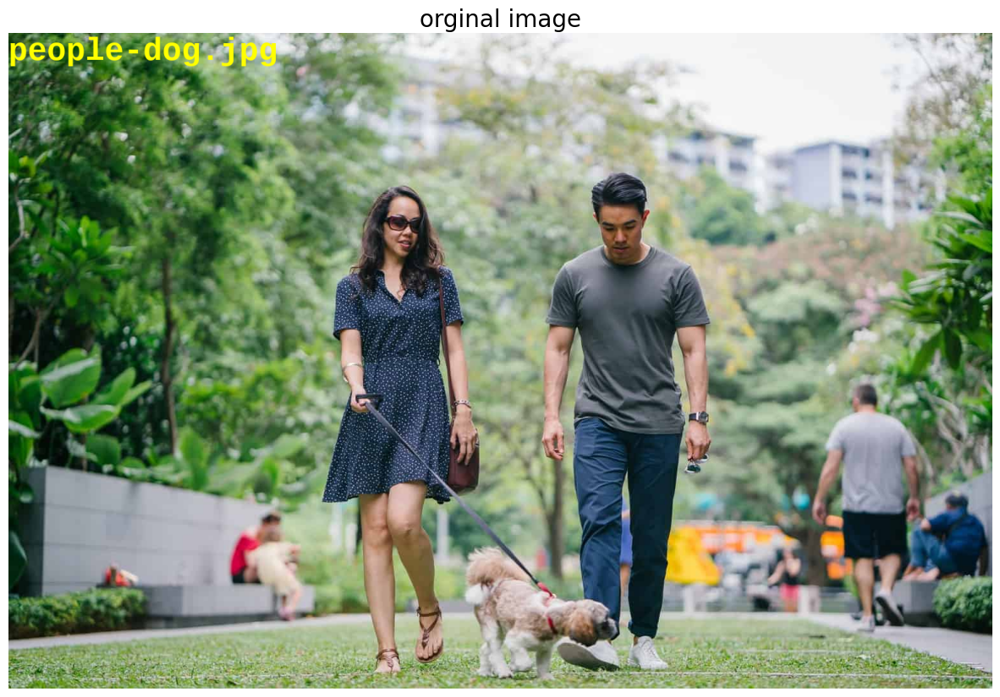

In [ ]:
## visualize the downloaded image with PIL (call it 'img')


#Open image using Image module from PATH
PATH = 'people-dog.jpg'
img = Image.open(PATH)

#write a text on the image
fnt = ImageFont.truetype("~/usr/share/fonts/truetype/LiberationMono-Bold.ttf", 50)
draw = ImageDraw.Draw(img)
draw.text(xy=(0, 0), text= "people-dog.jpg", fill =(255,255,0), font = fnt)

# specify the width and height of a figure in unit 15x15 inches
figure = plt.figure(figsize=(15,15))
#set a title for the image
plt.title(label = 'orginal image', fontsize=20)
#switch off the axis of the plot
plt.axis('off')
#Display data as an image in the plot
plt.imshow(img)
#show all figures
plt.show()

### 1b. Apply the transforms

Preprocess the image by constructing and applying some transforms, and by adding a fake batch dimension.
* Resize the image to `512`;
* Convert it to Tensor;
* Normalize it with the Imagenet specific values `mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]`

Unsqueeze the image so that it becomes `[1 x C x H x W]` (right now it's `[C x H x W]`).

In [ ]:
#define Imagenet mean and standard deviation for normalization.
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

#Composes several transforms together
transforms = T.Compose([ #ToDO....
                        T.Resize(512), #Resize the image tp 512
                        T.ToTensor(), # converts the image to PyTorch tensor
                        T.Normalize(mean = mean,  #Normalize the image
                                    std = std)
                        ])

## TODO: apply the transforms and unsqueeze the image

input = transforms(img) #apply the transforms
input = torch.unsqueeze(input,0) #unsqueeze the image(Returns a new tensor with a dimension of size one inserted at the specified position (0))


## TODO: print the shape of the image ('input')
print(input.shape)

torch.Size([1, 3, 512, 767])


## 2. The model: FCN with Resnet-101 backbone
### 2a. Download the network

Download the [FCN-ResNet101](https://pytorch.org/hub/pytorch_vision_fcn_resnet101/) model, pretrained.

In [ ]:
## TODO: download the model (FCN with Resnet-101 backbone), pre-trained

model = torch.hub.load('pytorch/vision:v0.9.0', 'fcn_resnet101', pretrained=True)

Downloading: "https://github.com/pytorch/vision/zipball/v0.9.0" to /root/.cache/torch/hub/v0.9.0.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FCN_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=FCN_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fcn_resnet101_coco-7ecb50ca.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet101_coco-7ecb50ca.pth
100%|██████████| 208M/208M [00:01<00:00, 121MB/s]


### 2b. Visualize the network structure

In [ ]:
#visualize the network structure
model.eval()

model_structure = list(model.named_children())
backbone_structure = list(model_structure[0][1].named_children())

for i in range(len(model_structure)):
    print("{}\n| {} |\n{}".format(len(model_structure[i][0])*'-'+"----",
                                  model_structure[i][0],
                                  len(model_structure[i][0])*'-'+"----",))
    if model_structure[i][0] == "backbone":
        print("| ResNet101|\n------------\n")
        for k in range(len(backbone_structure)):
            if k <= 3:
                print("'{}': {}".format(backbone_structure[k][0],
                                        backbone_structure[k][1]))
                print()
            else:
                print("[{}]: ".format(backbone_structure[k][0]))
                layer_structure = list(backbone_structure[k][1].named_children())
                for l in range(len(layer_structure)):
                    class_name = type(layer_structure[l][1]).__name__
                    layers = list(layer_structure[l][1].named_children())
                    list_of_layers = []
                    for m in layers:
                        list_of_layers.append(m[0])
                    print("\t({}) {}: {}".format(l+1, class_name, list_of_layers))
                print()
    else:
        for j in range(len(list(model_structure[i][1]))):
            print(list(model_structure[i][1])[j])
    print()

------------
| backbone |
------------
| ResNet101|
------------

'conv1': Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

'bn1': BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

'relu': ReLU(inplace=True)

'maxpool': MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)

[layer1]: 
	(1) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3', 'relu', 'downsample']
	(2) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3', 'relu']
	(3) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3', 'relu']

[layer2]: 
	(1) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3', 'relu', 'downsample']
	(2) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3', 'relu']
	(3) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3', 'relu']
	(4) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3', 'relu']

[layer3]: 
	(1) Bottleneck: ['conv1', 'bn1', 'conv2', 'bn2', 'conv3', 'bn3

we can see that we have three main blocks(backbone, and the two other classifires block). for the backbone, we have ResNet101 which is divided into the first part which consist of conv, batch normalization, relu and maxpool layer and also following by four blocks so called(layer1, layer2, layer3, layer4).

## 3. Semantic segmentation
### 3a. Get an output image from the model

In [ ]:
# pass the input through the net
output = model(input)['out'] #model return a semantic segmentation of the image ('input')

## TODO: print the shape of the output
print(output.shape)

torch.Size([1, 21, 512, 767])


The output has 21 channels, because the model we are using was trained on 21 classes. We need to make this output into a 1 channeled image, where each pixel of that image corresponds to a class. To do so, we must take the maximum value (the predicted class) for each pixel.



In [ ]:
# get the maximum value for each pixel
output_max = torch.argmax(output.squeeze(), dim=0).detach().cpu().numpy()

## TODO:
#print the shape of the output image
print(output_max.shape)

# print a list of all the classes in the image
# (0 = background class)
print(np.unique(output_max))

(512, 767)
[ 0 12 15]


In the above result, we can see that each particular pixel belongs to a specific class: the number 0 for background class, 12 for the dog and 15 for the person. as we can see our image consisting of the background, the dog and the presons so that the result is as we expected.



### 3b. Visualize the segmentation map of the output image

Define a `decode_segmap` function that takes as input arguments an image and a number of classes, and converts the image into a RGB segmentation map image where each class label is mapped to a color.

In [ ]:
# Define the helper function
def decode_segmap(image, num_classes=21):

    # store the colors for each of the classes according to the index in an array
    label_colors = np.array([(0, 0, 0),  # 0=background
               # 1=aeroplane, 2=bicycle, 3=bird, 4=boat, 5=bottle
               (128, 0, 0), (0, 128, 0), (128, 128, 0), (0, 0, 128), (128, 0, 128),
               # 6=bus, 7=car, 8=cat, 9=chair, 10=cow
               (0, 128, 128), (128, 128, 128), (64, 0, 0), (192, 0, 0), (64, 128, 0),
               # 11=dining table, 12=dog, 13=horse, 14=motorbike, 15=person
               (192, 128, 0), (64, 0, 128), (192, 0, 128), (64, 128, 128), (192, 128, 128),
               # 16=potted plant, 17=sheep, 18=sofa, 19=train, 20=tv/monitor
               (0, 64, 0), (128, 64, 0), (0, 192, 0), (128, 192, 0), (0, 64, 128)])

    # create empty 2D matrices for all 3 channels.
    # r, g, and b are arrays which will form the RGB channels for the final image.
    # Each array is of shape [H x W] (the same shape of the image passed in)
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)

    # loop over each class color stored in label_colors. Get the indexes in the
    # image where that particular class label is present. (idx = image == l).
    # For each channel, put its corresponding color to the pixels where that class label is present.
    for l in range(0, num_classes):
        idx = image == l
        r[idx] = label_colors[l, 0]
        g[idx] = label_colors[l, 1]
        b[idx] = label_colors[l, 2]

    # stack the 3 seperate channels to form a RGB image
    rgb = np.stack([r, g, b], axis=2)
    return rgb

Plot the RGB color array to see which color corresponds to each class.

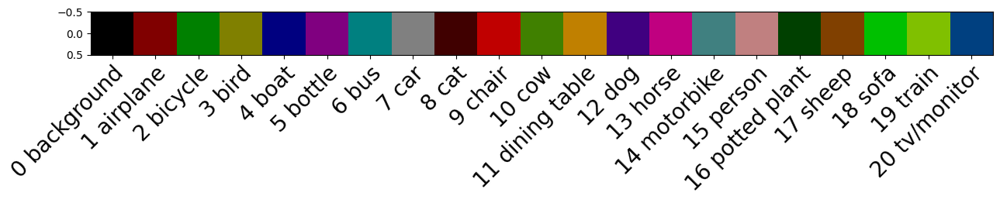

In [ ]:
# create a (H=1, W=21, C=3) array
label_colors = np.array([[(0, 0, 0),
                (128, 0, 0), (0, 128, 0), (128, 128, 0), (0, 0, 128), (128, 0, 128),
                (0, 128, 128), (128, 128, 128), (64, 0, 0), (192, 0, 0), (64, 128, 0),
                (192, 128, 0), (64, 0, 128), (192, 0, 128), (64, 128, 128), (192, 128, 128),
                (0, 64, 0), (128, 64, 0), (0, 192, 0), (128, 192, 0), (0, 64, 128)]])

# list of the 21 classes (labels)
labels = ["0 background", "1 airplane", "2 bicycle", "3 bird", "4 boat",
          "5 bottle", "6 bus", "7 car", "8 cat", "9 chair", "10 cow",
          "11 dining table", "12 dog", "13 horse", "14 motorbike", "15 person",
          "16 potted plant", "17 sheep", "18 sofa", "19 train", "20 tv/monitor"]

plt.rc('xtick', labelsize=20) #set the font size to 20

# create and show the figure
fig, ax = plt.subplots(figsize = (15,5))
im = ax.imshow(label_colors)

# show all ticks on the x-axis
ax.set_xticks(np.arange(len(labels)))
# label the ticks on the x-axis with the respective list entries
ax.set_xticklabels(labels)

# rotate the tick labels and set their alignment
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

plt.show()

plt.rc('xtick', labelsize=10) #set back the font size to 10

Visualize the resulting image using the helper function defined above.

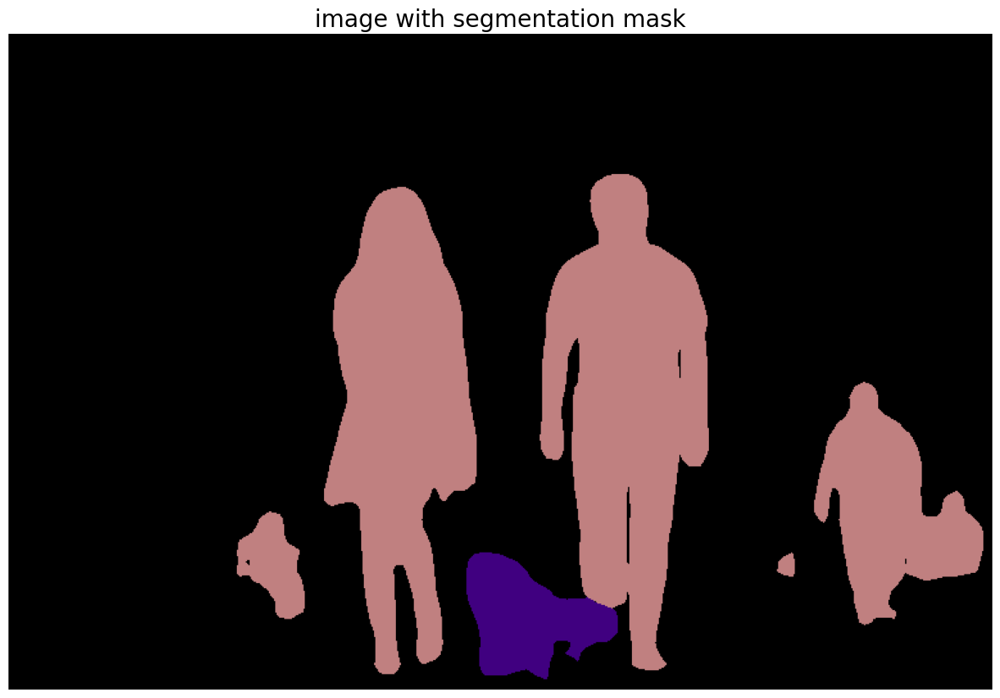

In [ ]:
#using the 'decode_segmap' function defined above, visualize
#        the segmentation map of the image

# specify the width and height of a figure in unit 15x15 inches
figure = plt.figure(figsize=(15, 15))

#get the decoded segmentation map with 'decode_segmap' function
rgb = decode_segmap(output_max)

#Display RGB data as an image
plt.imshow(rgb);

#set a title
plt.title("image with segmentation mask", fontsize = 20)

#off the axis
plt.axis('off');

#show plot
plt.show()

## 4. Semantic segmentation of further images
### 4a. Process another input image
Using the code and the function previously defined, construct a segment function that shows a segmentation map given a network and an image.

In [ ]:
def segment(net, path, transforms, dev='cpu'):
    #open the image
    img = Image.open(path)

    ## TODO:
    #using matplotlib, show the image ('img')
    plt.imshow(img)

    #apply the transforms to the image('img')
    inp = transforms(img).unsqueeze(0).to(dev)

    ## TODO: # pass the image through the net

    # feed the image into the net and it
    #returns a semantic segmentation ('out') of the image ('inp')
    out = net(inp)['out']

    ## TODO:
    #get the maximum value for each pixel
    om = torch.argmax(out.squeeze(), dim=0).detach().cpu().numpy()

    ## TODO:
    #get the decoded segmentation map with 'decode_segmap'
    segmap = decode_segmap(om, num_classes=21)

    ## TODO:
    #using matplotlib, show the segmentantion map ('segmap')
    plt.imshow(segmap)



Get an image from the dataset.

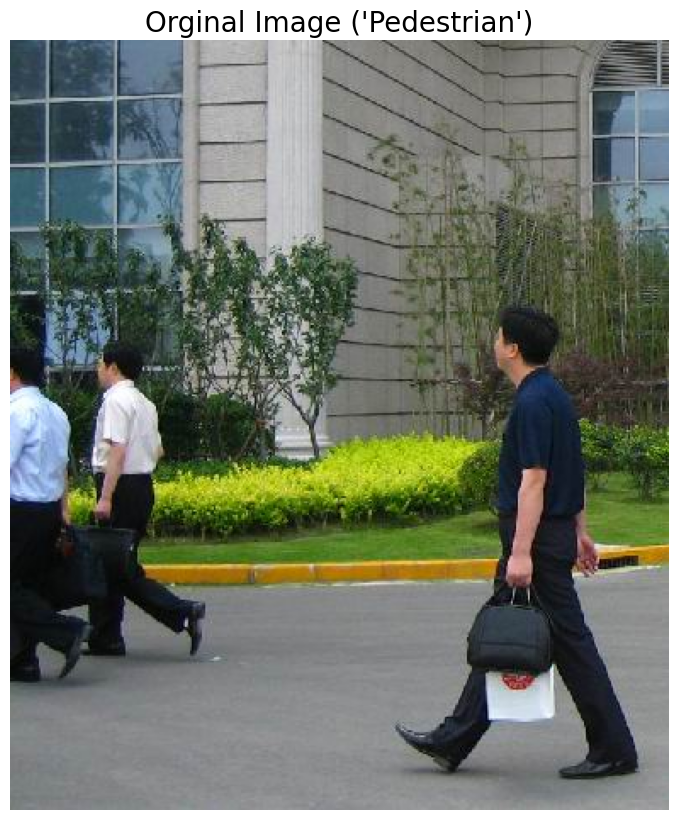

In [ ]:
## TODO: open an image from the dataset

from PIL import Image

figure = plt.figure(figsize=(15, 10))
#define the Path
image = 'PennFudanPed/PNGImages/FudanPed00008.png'
#load and open the image
img = Image.open(image)

#show an image
plt.imshow(img)
#off the axis
plt.axis('off')
#set a title
plt.title(label = "Orginal Image ('Pedestrian')", fontsize = 20)

plt.show()

Visualize the ground truth. Get the segmentation mask corresponding to the previously selected image from the dataset, and visualize it.

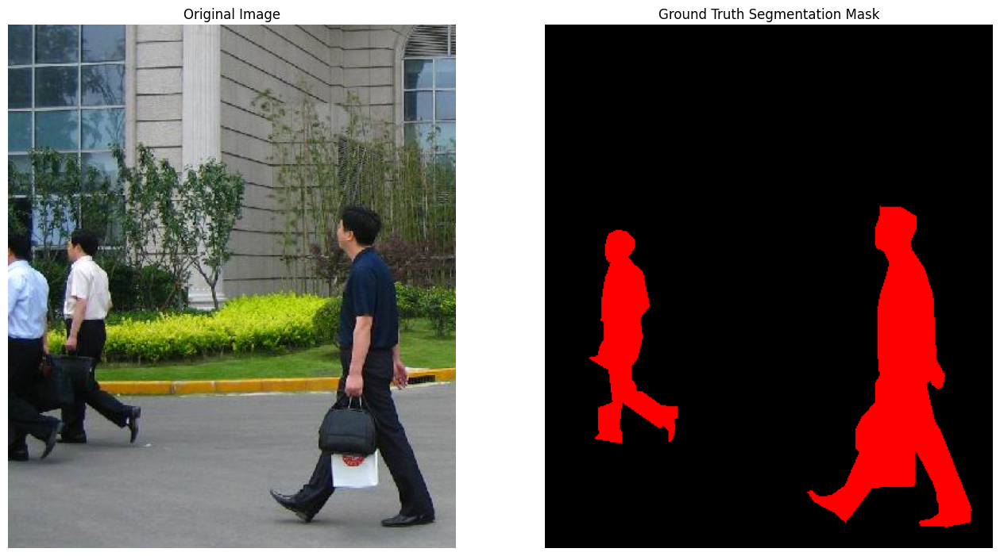

In [ ]:
##  open with PIL the ground truth image.
#        They are located in the 'PennFudanPed/PedMasks/' folder
path = 'PennFudanPed/PedMasks/FudanPed00008_mask.png'
mask = Image.open(path)
mask = mask.convert("P")

# each mask instance (in this case a person) has a different color,
# from zero to N, where N is the number of instances.
# In order to make visualization easier,
# let's add a color palette to the mask.
mask.putpalette([
    0, 0, 0, # black background
    255, 0, 0, # person 1
    255, 0, 0, # person 2
    255, 0, 0, # person 3
    255, 0, 0, # person 4
    255, 0, 0, # person 5
    255, 0, 0, # person 6
    255, 0, 0, # person 7
    255, 0, 0, # person 8
    255, 0, 0, # person 9
    255, 0, 0, # person 10
    255, 0, 0, # person 11
    255, 0, 0, # person 12
    255, 0, 0, # person 13
    255, 0, 0, # person 14
    255, 0, 0, # person 15
    # ...
])

## TODO: visualize the original image('image') on the left, and the ground
#        truth ('mask') on the right

# specify the width and height of a figure in unit 16x16 inches
figure = plt.figure(figsize=(16,16))

#visualize the original image('image') on the left
figure.add_subplot(1,2,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

#the ground truth ('mask') on the right
figure.add_subplot(1,2,2)
plt.title("Ground Truth Segmentation Mask")
plt.imshow(mask)
plt.axis("off")

plt.show()

Apply the transforms to the ground truth image.

In [ ]:
# define the transforms
transforms_mask = T.Compose([
                        T.Resize(512), #resize the image to 512
                        T.ToTensor(),  #convert the image to pytorch tensor
                        ])

## TODO: apply the transforms to 'mask
labels = transforms_mask(mask)#...

## TODO: print the shape of the ground truth tensor ('labels')
print(labels.shape)

torch.Size([1, 599, 512])


Since we used a ground truth image with just people in it, we can confirm that in the ground truth tensor there will just be pixels with either label 0 (background) or 15 (person). Substitute each non-zero pixel value in the ground truth tensor with the value 15.

In [ ]:
# change the value of non-background pixels to 15, which is the number
# corresponding to the class 'person'
labels[labels!=0] = 15

Apply the transforms to the original image and pass it through the network.

In [ ]:
## apply the transforms to the image, unsqueeze it, and print its shape.
#        Use the 'transforms' defined above
input = transforms(img).unsqueeze(0)#...
print(input.shape)

torch.Size([1, 3, 599, 512])


In [ ]:
##pass the tensor image (input) through the network and get an output
#        tensor. Print its shape
output = model(input)['out']#...
print(output.shape)

torch.Size([1, 21, 599, 512])


For each pixel of the image, get the maximum value. That is the predicted class for that pixel.

In [ ]:
# get the maximum value for each pixel
pred = torch.argmax(output, 1).cpu()
#pred = torch.argmax(output.squeeze(), 0).detach().cpu().numpy()

## TODO: print the shape of the output image ('pred')
print(pred.shape)


torch.Size([1, 599, 512])


Visualize the predicted segmentation map.

(599, 512, 3)


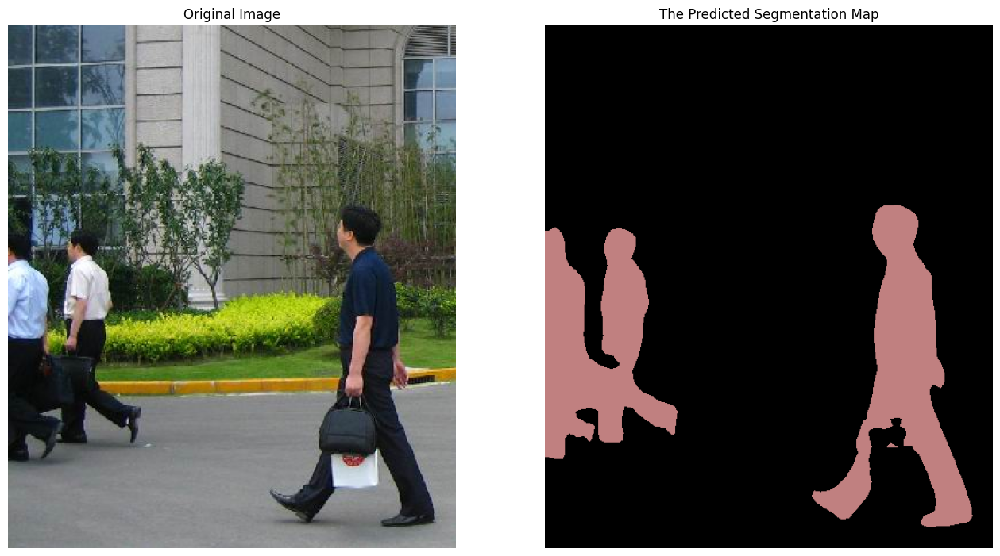

In [ ]:

## using 'decode_segmap' get an image where each class label is mapped to
#        a color.You may need to squeeze the 'pred' image
pred_segmap = decode_segmap(pred.squeeze(0))#...
print(pred_segmap.shape)

## TODO: visualize the original image('image') on the left, and the predicted
#        segmentation map ('pred_segmap') on the right
figure = plt.figure(figsize=(16,16))

figure.add_subplot(1,2,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

figure.add_subplot(1,2,2)
plt.imshow(pred_segmap)
plt.title("The Predicted Segmentation Map")
plt.axis("off")

plt.show()

Visualize the original image, the ground truth, and the predicted image.

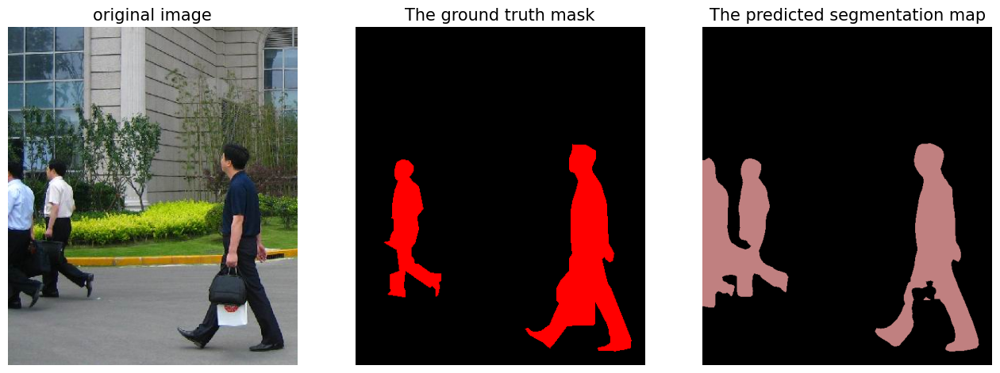

In [ ]:
## TODO: visualize 3 images: the original ('image') on the left, the ground truth
#        ('mask') in the center and the predicted ('pred_segmap') on the right

#specify the width and height of a figure in unit 16x16 inches
figure = plt.figure(figsize=(16,16))

#visualize the original ('image') on the left
figure.add_subplot(1,3,1)
plt.imshow(img)
plt.title("original image", fontsize = 15)
plt.axis("off")

#visualize the ground truth ('mask') in the center
figure.add_subplot(1,3,2)
plt.imshow(mask)
plt.title("The ground truth mask", fontsize = 15)
plt.axis("off")

#visualize the predicted ('pred_segmap') on the right
figure.add_subplot(1,3,3)
plt.imshow(pred_segmap)
plt.title("The predicted segmentation map", fontsize = 15)
plt.axis("off")

plt.show()

### 5a. IoU
Calculate the Intersection over Union. The IoU is defined as

$\text{IoU} = \dfrac{\text{area of overlap}}{\text{area of union}}$

You can use the `jaccard_score` from `sklearn` ([documentation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.jaccard_score.html#sklearn.metrics.jaccard_score)), or calculate it by other means.

In [ ]:
##  calculate the IoU.
#        If you use 'jaccard-score' from sklearn you have to reshape both 'labels'
#        and 'pred' into a 1-D tensor (e.g.: with torch.flatten()), and also use
#        'average="micro"' as argument

#reshape'labels' into a 1-D tensor
labels = torch.flatten(labels)
#reshape 'pred' into a 1-D tensor
pred = torch.flatten(pred)

#calculate the IoU
js = jaccard_score(labels, pred, average="micro")

## TODO:

#print the IoU value
print("IoU value :", js)

#print the IoU value with 4 decimal digit
print("IoU value with 4 decimal digit :", round(js,4))

#print the IoU value in percentage
print("IoU value in percentage: {: .2f}".format(100*js)+"%")

IoU value : 0.8870204583910167
IoU value with 4 decimal digit : 0.887
IoU value in percentage:  88.70%


### 5b. Accuracy

Calculate the accuracy. The accuracy is defined as

$\text{accuracy} = \dfrac{\text{correctly predicted pixels}}{\text{total number of image pixels}} = \dfrac{TP+TN}{TP+FP+FN+TN}$

and represents the percent of image pixels that are classified correctly.

In [ ]:
##calculate the accuracy.
#        You can bot calculate it "by hand" or find a library that computes it
#calculate the accuracy.
accuracy = accuracy_score(labels, pred)

## TODO: print the accuracy value
print("accuracy value is :",accuracy)

#print the accuracy value with 4 decimal digit
print("accuracy value with 4 decimal digit :", round(accuracy,4))

#print the accuracy value in percentage
print("accuracy value in percentage : {: .2f}".format(100*accuracy)+"%")

accuracy value is : 0.9401280780467446
accuracy value with 4 decimal digit : 0.9401
accuracy value in percentage :  94.01%


### 5c. Precision

Calculate the precision. The precision is defined as

$\text{precision} = \dfrac{\text{correctly predicted instance pixels}}{\text{total number of predicted instance pixels}} = \dfrac{TP}{TP+FP}$

and represents the proportion of the instance pixel (in this case an instance is a person) in the predicted image that match with the ground truth instance pixels.

In [ ]:
## calculate the precision.
#        You can bot calculate it "by hand" or find a library that computes it
#calculate the precision.
precision = precision_score(labels, pred, average = 'macro')

## TODO: print the precision value
print("precision value is : ", precision)

#print the precision value with 4 decimal digit
print("precision value with 4 decimal digit :", round(precision,4))

#print the precision value in percentage
print("precision value in percentage : {: .2f}".format(100*precision)+"%")

precision value is :  0.8361700965007395
precision value with 4 decimal digit : 0.8362
precision value in percentage :  83.62%


### 5d. Recall

Calculate the recall. The recall is defined as

$\text{recall} = \dfrac{\text{correctly predicted instance pixels}}{\text{total number of ground truth instance pixels}} = \dfrac{TP}{TP+FN}$

and represents the proportion of the instance pixel in the ground truth that were correctly identified through automatic segmentation.

In [ ]:
## TODO: calculate the recall.
#        You can bot calculate it "by hand" or find a library that computes it
#calculate recall
recall = recall_score(labels, pred, average = 'macro')

## TODO: print the recall value
print("recall value is :", recall)

#print the recall value with 4 decimal digit
print("recall value with 4 decimal digit :", round(recall,4))

#print the recall value in percentage
print("recall value in percentage : {: .2f}".format(100*recall)+"%")

recall value is : 0.9149574922668848
recall value with 4 decimal digit : 0.915
recall value in percentage :  91.50%


## 6. Results, observations and conclusions

TODO

Display in a table the calculated values of IoU, accuracy, precision and recall. To generate a markdown table you can use [this website](https://www.tablesgenerator.com/markdown_tables).

###Result :

| Tables    	 | values in precentage 	|
|-----------	 |:--------------------:	|
| **IoU**      |        88.70%        	|
| **Accuracy** |        94.01%        	|
| **Precision**|        83.62%        	|
| **Recall**   |        91.50%        	|

Observation: accuracy value in percantage is 94.01%, meaning that 94.01 percentage of pixels classified correctly.

Precision values in percentage is 83.62%, meaning that all of the objects that we predicted in a given image, 83.62% of those objects actually had a matching ground truth annotation.

Precision values in percentage is 91.50%, meaning that from all of the object annotated in our ground truth, we preceive 91.50% as positice predictions.

In general, based on the measurement's values which obtain in this project, we can claim that the network's performance is well.

In [ ]:
import torch
from torch.utils.data import Dataset

class ImageSegmentationDataset(Dataset):
    def __init__(self, images, masks, transforms=None, should_permute=True):

        self.transforms = transforms
        self.images = [torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)
                       if should_permute
                       else torch.tensor(img, dtype=torch.float32) for img in images]
        self.masks = [torch.tensor(mask, dtype=torch.float32) for mask in masks]

    def __getitem__(self, idx):
        if idx >= len(self.images):
            raise IndexError(f'Index {idx} out of bounds for dataset')

        img = self.images[idx]
        target = self.masks[idx]

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.images)

In [ ]:
def get_full_image_segmentation_set(dataset):
    images = []
    masks = []
    max_height = 0
    max_width = 0

    for image, gt_dict in dataset:
        # Convert image to numpy array and get its dimensions
        np_image = np.array(image)
        _, height, width = np_image.shape

        # Update max_height and max_width if necessary
        if height > max_height:
            max_height = height
        if width > max_width:
            max_width = width

        combined_mask = torch.max(gt_dict['masks'], dim=0)[0]
        images.append(np_image)
        masks.append(combined_mask)

    # Return the dataset along with the maximum height and width
    return ImageSegmentationDataset(images, masks, should_permute=False), (max_height, max_width)

train_seg_set, train_dims = get_full_image_segmentation_set(train_set)
val_seg_set, val_dims = get_full_image_segmentation_set(val_set)
test_seg_set, test_dims = get_full_image_segmentation_set(test_set)

In [ ]:
# Determine the largest dimensions across all datasets
max_height = max(train_dims[0], val_dims[0], test_dims[0])
max_width = max(train_dims[1], val_dims[1], test_dims[1])

# Adjust to nearest dimensions divisible by 32
target_height = ((max_height + 31) // 32) * 32
target_width = ((max_width + 31) // 32) * 32

In [ ]:
import torch
import torch.nn.functional as F

class ResizeWithPadding:
    def __init__(self, target_height, target_width):
        self.target_height = target_height
        self.target_width = target_width

    def __call__(self, x):
        if not torch.is_tensor(x):
            raise TypeError("Input must be a PyTorch tensor")

        # Get current dimensions of the image/mask
        height, width = x.shape[-2], x.shape[-1]

        # Calculate padding
        pad_height = self.target_height - height
        pad_width = self.target_width - width

        # If padding is negative, raise an error
        if pad_height < 0 or pad_width < 0:
            raise ValueError("Target size must be larger than the input size")

        # Calculate padding for top/bottom and left/right
        top_pad = pad_height // 2
        bottom_pad = pad_height - top_pad
        left_pad = pad_width // 2
        right_pad = pad_width - left_pad

        # Pad the tensor and maintain the number of channels
        padding = (left_pad, right_pad, top_pad, bottom_pad)
        if x.dim() == 3:  # If it's an image with 3 channels
            padded_x = F.pad(x, padding, mode='constant', value=0)
        elif x.dim() == 2 or (x.dim() == 3 and x.shape[0] == 1):  # If it's a mask
            padded_x = F.pad(x.unsqueeze(0), padding, mode='constant', value=0).squeeze(0)
        else:
            raise ValueError("Input tensor must be a 2D or 3D tensor")

        return padded_x


In [ ]:
segmentation_transform = Compose([
    ImageMaskTransform(ResizeWithPadding(target_height, target_width)),
    RandomCrop((576,576))
])
test_transform = ImageMaskTransform(ResizeWithPadding(target_height, target_width))

In [ ]:
test_seg_set.transforms = test_transform
train_seg_set.transforms =  segmentation_transform
val_seg_set.transforms =  segmentation_transform

In [ ]:
batch_size = 8

train_seg_loader = DataLoader(
    train_seg_set, batch_size=batch_size, shuffle=True, num_workers=2)
val_seg_loader = DataLoader(
    val_seg_set, batch_size=batch_size, shuffle=True, num_workers=2)
test_seg_loader = DataLoader(
    test_seg_set, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
batch = next(iter(test_seg_loader))
img, gt = batch
img.shape, gt.shape

In [ ]:
import os
import torch
import math
import torch.nn.functional as F
import torch.nn as nn

import time
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader

def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    """
    Calculate Intersection over Union (IoU) for a batch of outputs and labels.
    """
    # Apply sigmoid and threshold
    outputs = (torch.sigmoid(outputs) > 0.5).float()

    # Flatten tensors
    outputs_flat = outputs.view(-1)
    labels_flat = labels.view(-1)

    intersection = (outputs_flat * labels_flat).sum()
    union = outputs_flat.sum() + labels_flat.sum() - intersection

    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou

def train_one_seg_epoch(model, optimizer, criterion, data_loader, device, epoch):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter('lr', utils.SmoothedValue(window_size=1, fmt='{value:.6f}'))
    metric_logger.add_meter('iou', utils.SmoothedValue(window_size=1, fmt='{value:.4f}'))
    header = 'Epoch: [{}]'.format(epoch)

    count = 0
    global_loss = 0
    global_iou = 0
    for images, gt_masks in metric_logger.log_every(data_loader, print_freq=50, header=header):
        images = images.to(device)
        gt_masks = gt_masks.to(device).unsqueeze(1)

        output = model(images)
        loss = criterion(output, gt_masks)
        loss_value = loss.item()
        iou_value = iou_pytorch(output, gt_masks).item()

        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            sys.exit(1)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        count += 1
        global_loss += loss_value
        global_iou += iou_value

        metric_logger.update(loss=loss_value, iou=iou_value, lr=optimizer.param_groups[0]["lr"])

    avg_loss = round(global_loss / count, 2)
    avg_iou = round(global_iou / count, 4)
    return avg_loss, avg_iou, metric_logger

def validate(model, criterion, valid_loader, device):
    model.eval()
    total_loss = 0
    total_iou = 0
    count = 0

    with torch.no_grad():
        for images, gt_masks in valid_loader:
            images = images.to(device)
            gt_masks = gt_masks.to(device).unsqueeze(1)

            output = model(images)
            loss = criterion(output, gt_masks)
            iou = iou_pytorch(output, gt_masks).item()

            total_loss += loss.item()
            total_iou += iou
            count += 1

    avg_loss = total_loss / count if count > 0 else 0
    avg_iou = total_iou / count if count > 0 else 0
    return avg_loss, avg_iou


def train_segmentation(model, num_epochs,train_loader, valid_loader, optimizer, criterion, scheduler, patience, device, save_path):

    best_mIoU = 0
    no_improvement_count = 0
    metric_collector = []
    train_losses = []
    val_losses = []
    train_accs = []
    valid_accs = []
    for epoch in range(num_epochs):
        start = time.time()
        global_loss, mIoU_train, metric_logger = train_one_seg_epoch(model, optimizer, criterion, train_loader, device, epoch)
        valid_loss, mIoU_val = validate(model, criterion, valid_loader, device)
        val_losses.append(valid_loss)
        scheduler.step(valid_loss)
        print(f'Validation loss: {valid_loss}')
        end = time.time()

        print(f'Train IoU: {mIoU_train}')
        print(f'Val IoU: {mIoU_val}')

        if mIoU_val > best_mIoU:
            best_mIoU = mIoU_val
            no_improvement_count = 0
            best_save_path = os.path.join(save_path, "best_model.pth")
            print("Best IoU improved. Model saved to {}".format(best_save_path))
            torch.save(model.state_dict(), best_save_path)
        else:
            no_improvement_count += 1

        if no_improvement_count >= patience:
            print(f"No improvement for {no_improvement_count} epochs. Early stopping.")
            break


        if (epoch + 1) % 5 == 0:
            epoch_save_path = os.path.join(save_path, str(epoch) + ".pth")
            print("Model saved to {}".format(epoch_save_path))
            torch.save(model.state_dict(), epoch_save_path)


        train_losses.append(global_loss)
        metric_collector.append(metric_logger)

        train_accs.append(mIoU_train)
        valid_accs.append(mIoU_val)


        print('#' * 25)

    torch.save(model.state_dict(),
               os.path.join(save_path, str(num_epochs) + ".pth"))
    print("Training completed.")

    return train_accs, valid_accs, train_losses, val_losses, metric_collector

In [ ]:
import torch.nn.functional as F

class FocalLoss(torch.nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss) # prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss

In [ ]:
import segmentation_models_pytorch as smp

save_path = f'{CONFIG["models_path"]}/segmentation/unetplusplus34_full_size'
num_epochs = 250
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

if not os.path.exists(save_path):
        os.makedirs(save_path)

segmentation_model = smp.UnetPlusPlus(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
)
segmentation_model.to(device)

# criterion = DiceLoss()
criterion = FocalLoss()

params = [p for p in segmentation_model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.0005, weight_decay=0.0005)
early_stopping_patience = 20

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, factor=0.1, verbose=True)

In [ ]:
# Train the model
train_ious, val_ious, train_losses, val_losses,metric_collector = train_segmentation(segmentation_model, num_epochs, train_seg_loader, val_seg_loader, optimizer, criterion, scheduler, early_stopping_patience, device, save_path)

In [ ]:
def crop_images_and_masks(dataset):
    images = []
    masks = []

    for image, gt_dict in dataset:
        for i, box in enumerate(gt_dict['boxes']):
            image = np.array(image)
            _, img_height, img_width = image.shape
            x_start, y_start, x_end, y_end = map(int, box)  # Ensure the box coordinates are integers

            # Scale the box
            scaled_width = max(2 * (x_end - x_start), 288)
            scaled_height = max(2 * (y_end - y_start), 288)

            # Adjust start and end points to fit within the image boundaries
            x_start = max(0, x_start - (scaled_width - (x_end - x_start)) // 2)
            y_start = max(0, y_start - (scaled_height - (y_end - y_start)) // 2)

            x_end = min(img_width, x_start + scaled_width)
            y_end = min(img_height, y_start + scaled_height)

            # Ensure the crop is at least 288x288
            if (x_end - x_start) < 288:
                if x_start == 0:
                    x_end = 288
                else:
                    x_start = x_end - 288

            if (y_end - y_start) < 288:
                if y_start == 0:
                    y_end = 288
                else:
                    y_start = y_end - 288

            # Perform cropping
            cropped_img = image[:, y_start:y_end, x_start:x_end]
            combined_mask = torch.max(gt_dict['masks'], dim=0)[0]
            cropped_mask = combined_mask[y_start:y_end, x_start:x_end]

            images.append(torch.tensor(cropped_img))
            masks.append(cropped_mask)

    return images, masks


train_crop_images, train_crop_masks = crop_images_and_masks(train_set)
val_crop_images, val_crop_masks = crop_images_and_masks(val_set)
test_crop_images, test_crop_masks = crop_images_and_masks(test_set)

In [ ]:
train_seg_crop_set = ImageSegmentationDataset(train_crop_images, train_crop_masks, should_permute=False)
val_seg_crop_set = ImageSegmentationDataset(val_crop_images, val_crop_masks, should_permute=False)
test_seg_crop_set = ImageSegmentationDataset(test_crop_images, test_crop_masks, should_permute=False)

In [ ]:
crop_segmentation_transform = Compose([
    RandomCrop((288,288))
])

In [ ]:
train_seg_crop_set.transforms = crop_segmentation_transform
val_seg_crop_set.transforms =  crop_segmentation_transform
# test_seg_crop_set.transforms =  crop_segmentation_transform

In [ ]:
batch_size = 8
train_seg_crop_loader = DataLoader(
    train_seg_crop_set, batch_size=batch_size, shuffle=True, num_workers=2)
val_seg_crop_loader = DataLoader(
    val_seg_crop_set, batch_size=batch_size, shuffle=True, num_workers=2)
# test_seg_crop_loader = DataLoader(
#     test_seg_crop_set, batch_size=batch_size, shuffle=False, num_workers=2)

In [ ]:
batch = next(iter(train_seg_crop_loader))
img, gt = batch
img.shape, gt.shape

In [ ]:
save_path = f'{CONFIG["models_path"]}/segmentation/unetplusplus34_crops'
num_epochs = 250
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

if not os.path.exists(save_path):
        os.makedirs(save_path)

segmentation_model = smp.UnetPlusPlus(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
)
segmentation_model.to(device)

# criterion = DiceLoss()
criterion = FocalLoss()

params = [p for p in segmentation_model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.0005, weight_decay=0.0005)
early_stopping_patience = 20

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, factor=0.1, verbose=True)

In [ ]:
# Train the model
train_ious, val_ious, train_losses, val_losses,metric_collector = train_segmentation(segmentation_model, num_epochs, train_seg_crop_loader, val_seg_crop_loader, optimizer, criterion, scheduler, early_stopping_patience, device, save_path)

In [ ]:
segmentation_model = smp.UnetPlusPlus(
    encoder_name="resnet34",
    in_channels=3,
    classes=1,
)

# segmentation_model.load_state_dict(torch.load('/gpfs/space/home/donatasv/semester_3/vcs/models/segmentation/unetplusplus34_full_size/best_model.pth'))
segmentation_model.load_state_dict(torch.load('/gpfs/space/home/donatasv/semester_3/vcs/models/segmentation/unetplusplus34_crops/best_model.pth'))
segmentation_model = segmentation_model.to(device)

In [ ]:
from torchvision.transforms import functional as TF

def pad_to_multiple_of_32(image, mask):
    h, w = image.shape[1], image.shape[2]
    new_h = (h // 32 + 1) * 32 if h % 32 != 0 else h
    new_w = (w // 32 + 1) * 32 if w % 32 != 0 else w

    # Pad the image and mask
    padded_image = TF.pad(image, padding=[0, 0, new_w - w, new_h - h], padding_mode='reflect')
    padded_mask = TF.pad(mask, padding=[0, 0, new_w - w, new_h - h], padding_mode='reflect')

    return padded_image, padded_mask

In [ ]:
import numpy as np
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, precision_recall_curve, f1_score, accuracy_score, auc, roc_curve

def calculate_metrics(raw_pred, true_mask, all_preds, all_trues):
    raw_pred_flat = raw_pred.detach().reshape(-1).cpu().numpy()
    true_mask_flat = true_mask.reshape(-1).cpu().numpy()

    all_preds.extend(raw_pred_flat)
    all_trues.extend(true_mask_flat)

    binary_pred = raw_pred_flat > 0.5
    iou = jaccard_score(true_mask_flat, binary_pred, average='binary')
    f1 = f1_score(true_mask_flat, binary_pred, average='binary')
    accuracy = accuracy_score(true_mask_flat, binary_pred)

    return iou, f1, accuracy

def pad_to_divisible(image, mask, divisor=32):
    _, height, width = image.shape

    pad_height = (divisor - height % divisor) % divisor
    pad_width = (divisor - width % divisor) % divisor

    pad_top = pad_height // 2
    pad_bottom = pad_height - pad_top
    pad_left = pad_width // 2
    pad_right = pad_width - pad_left

    padded_image = F.pad(image, (pad_left, pad_right, pad_top, pad_bottom), mode='constant', value=0)
    padded_mask = F.pad(mask, (pad_left, pad_right, pad_top, pad_bottom), mode='constant', value=0)

    return padded_image, padded_mask

def evaluate_and_visualize_model(segmentation_model, test_crop_set, device):
    iou_scores = []
    f1_scores = []
    accuracy_scores = []
    all_preds = []
    all_trues = []

    for i in range(len(test_crop_set)):
        test_img, test_mask = test_crop_set.__getitem__(i)
        original_size = test_mask.shape[-2:]

        test_img_padded, test_mask_padded = pad_to_divisible(test_img, test_mask)
        test_img_padded = test_img_padded.unsqueeze(0)

        raw_pred = segmentation_model(test_img_padded.to(device))
        raw_pred = torch.sigmoid(raw_pred[0, 0])
        unpadded_raw_pred = unpad_mask(raw_pred, original_size)

        iou, f1, accuracy = calculate_metrics(unpadded_raw_pred, test_mask, all_preds, all_trues)
        iou_scores.append(iou)
        f1_scores.append(f1)
        accuracy_scores.append(accuracy)

    precision, recall, _ = precision_recall_curve(all_trues, all_preds)
    fpr, tpr, _ = roc_curve(all_trues, all_preds)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    # plt.scatter(recall, precision)
    plt.plot(recall, precision, marker='.', markersize=1)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.plot(fpr, tpr, color='orange', marker='.')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.grid()
    plt.show()

    avg_iou = np.mean(iou_scores)
    avg_f1 = np.mean(f1_scores)
    avg_accuracy = np.mean(accuracy_scores)
    print(f"Average IoU: {avg_iou}")
    print(f"Average F1 Score: {avg_f1}")
    print(f"Average Accuracy: {avg_accuracy}")

def unpad_mask(raw_pred, original_size):
    height, width = original_size
    return raw_pred[:height, :width]

evaluate_and_visualize_model(segmentation_model, test_seg_crop_set, device)

In [ ]:
segmentation_model = smp.UnetPlusPlus(
    encoder_name="resnet34",
    in_channels=3,
    classes=1,
)

#full-size model
segmentation_model.load_state_dict(torch.load('/gpfs/space/home/donatasv/semester_3/vcs/models/segmentation/unetplusplus34_full_size/best_model.pth'))
segmentation_model = segmentation_model.to(device)

In [ ]:
evaluate_and_visualize_model(segmentation_model, test_seg_set, device)

In [ ]:
# det_model_path = '/content/models/detection/best_model.pth'
det_model_path = '/gpfs/space/home/donatasv/semester_3/vcs/models/detection/resnet_fpn_50/best_model.pth'
detection_model = fasterrcnn_resnet50_fpn(pretrained=True)
detection_model = get_detection_model(detection_model, num_classes=2)
detection_model.load_state_dict(torch.load(det_model_path))
detection_model = detection_model.to(device)

In [ ]:
segmentation_model = smp.UnetPlusPlus(
    encoder_name="resnet34",
    in_channels=3,
    classes=1,
)

segmentation_model.load_state_dict(torch.load('/gpfs/space/home/donatasv/semester_3/vcs/models/segmentation/unetplusplus34_crops/best_model.pth'))
segmentation_model = segmentation_model.to(device)

In [ ]:
import torch
from math import ceil

class DetectionSegmentationModel(nn.Module):
    def __init__(self, detection_model, segmentation_model):
        super(DetectionSegmentationModel, self).__init__()
        self.detection_model = detection_model
        self.segmentation_model = segmentation_model

    def forward(self, images):
        detections = self.detection_model(images)
        seg_masks = []
        for i, detection in enumerate(detections):
            masks, boxes, paddings, crops = [], [], [], []
            for box in detection['boxes']:
                crop, padding = self.expand_and_crop(images[i], box)
                crops.append(crop)
                mask = self.segmentation_model(crop.unsqueeze(0)).squeeze(0)
                masks.append(mask)
                paddings.append(padding)
                expanded_box = self.expand_box(box, factor=2, image_size=images[i].shape[1:])
                boxes.append(expanded_box)
            full_mask = self.stitch_masks(masks, boxes, paddings, image_size=images[i].shape[1:], device=device)
            seg_masks.append(full_mask)
        # return torch.stack(seg_masks), crops, masks
        return torch.stack(seg_masks)

    def expand_and_crop(self, image, box):
      center_x, center_y = (box[0] + box[2]) / 2, (box[1] + box[3]) / 2
      width, height = box[2] - box[0], box[3] - box[1]
      new_width, new_height = ceil(width * 2), ceil(height * 2)

      x1 = max(int(center_x - new_width / 2), 0)
      y1 = max(int(center_y - new_height / 2), 0)
      x2 = min(int(center_x + new_width / 2), image.shape[2])
      y2 = min(int(center_y + new_height / 2), image.shape[1])

      crop = image[:, y1:y2, x1:x2]

      new_height, new_width = crop.shape[1], crop.shape[2]
      pad_height, pad_width = ceil((32 - new_height % 32) % 32), ceil((32 - new_width % 32) % 32)


      pad_top = pad_height // 2
      pad_bottom = pad_height - pad_top
      pad_left = pad_width // 2
      pad_right = pad_width - pad_left

      crop = F.pad(crop, (pad_left, pad_right, pad_top, pad_bottom))

      return crop, (pad_width, pad_height)


    def stitch_masks(self, masks, boxes, paddings, image_size, device):
      stitched_mask = torch.zeros(1, image_size[0], image_size[1], dtype=torch.float32, device=device)
      for mask, box, padding in zip(masks, boxes, paddings):
          expected_height, expected_width = box[3] - box[1], box[2] - box[0]
          mask_cropped = mask[:, :expected_height, :expected_width]
          stitched_mask[0, box[1]:box[3], box[0]:box[2]] = torch.max(
              stitched_mask[0, box[1]:box[3], box[0]:box[2]],
              mask_cropped
          )
      return stitched_mask

    def expand_box(self, box, factor, image_size):
         center_x, center_y = (box[0] + box[2]) / 2, (box[1] + box[3]) / 2
         width, height = box[2] - box[0], box[3] - box[1]
         new_width, new_height = ceil(width * factor), ceil(height * factor)
         new_box = [max(center_x - new_width / 2, 0), max(center_y - new_height / 2, 0),
                    min(center_x + new_width / 2, image_size[1]), min(center_y + new_height / 2, image_size[0])]
         return [int(coord) for coord in new_box]


In [ ]:
device = torch.device('cpu')

In [ ]:
det_seg_model = DetectionSegmentationModel(detection_model, segmentation_model)
det_seg_model = det_seg_model.eval()
det_seg_model = det_seg_model.to(device)

In [ ]:
evaluate_and_visualize_model(det_seg_model, test_seg_set, device)

In [ ]:
test_sample = test_seg_set[3]
test_img, gt_mask = test_sample
test_img = test_img.unsqueeze(0)
pred = det_seg_model(test_img)
pred = pred.cpu().detach()[0,0]
fix, ax = plt.subplots(1,4, figsize=(10,20))

mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])
denormalized = test_img.cpu()[0] * std[:, None, None] + mean[:, None, None]
image = (denormalized.numpy() * 255).astype('uint8').transpose((1, 2, 0))



ax[0].imshow(image)
ax[1].imshow(pred)
ax[2].imshow(pred > 0.5)
ax[3].imshow(gt_mask)
